<a href="https://colab.research.google.com/github/PK125-nsfh/cert/blob/main/MODIS_L1B_to_L2_convert_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pyhdf h5py numpy matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.3/780.3 kB 10.4 MB/s eta 0:00:00


<ipython-input-51-e4fd46362940>:91: UserWarning: The following kwargs were not used by contour: 'label'
  plt.contour(fire_mask == 1, colors='red', linewidths=1.0, label='Fire Detected')
<ipython-input-51-e4fd46362940>:97: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


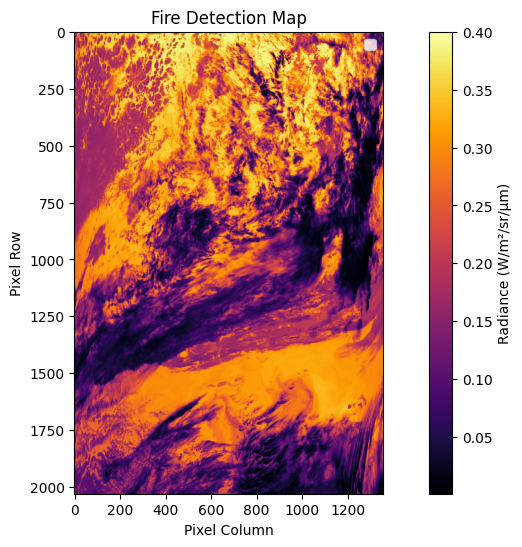

In [ ]:
#============================= Version 1.0.4 ============================================


from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
import h5py  # Used to output data in HDF format (MODIS L2)

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    data = {}

    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]

    for band_index in bands_to_extract:
        radiance = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
        data[band_index] = radiance

    return data

def estimate_background_radiance(radiance_data, i, j, window_size=5):
    half = window_size // 2
    sub_region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    sub_region_flat = sub_region.flatten()
    sub_region_clean = sub_region_flat[sub_region_flat < np.percentile(sub_region_flat, 90)]
    return np.mean(sub_region_clean)

def detect_fire_pixels(band21, band31, band32, band6, zenith, threshold=2.0):
    height, width = band21.shape
    fire_mask = np.zeros_like(band21, dtype=np.uint8)  # 0 = non-fire, 1 = fire

    for i in range(height):
        for j in range(width):
            # Cloud Masking: Using Band 32 (cloud top temperature) as a basic cloud test
            if band32[i, j] < 275:  # Threshold for cloud top temperature (K)
                fire_mask[i, j] = 0  # Cloudy pixel, no fire

            # Water Masking: Using Band 6 for water detection
            if band6[i, j] < 0.02:  # Threshold for detecting water (band 6 reflectance)
                fire_mask[i, j] = 0  # Water pixel, no fire
                continue

            # Sun Glint Check: Avoid sun glint effects in water bodies
            if zenith[i, j] < 30:  # Threshold for sun glint (solar zenith angle < 30 degrees)
                fire_mask[i, j] = 0  # Sun glint, no fire

            # Daytime vs Nighttime Classification
            if zenith[i, j] > 90:  # Nighttime (solar zenith angle > 90 degrees)
                continue  # No fire detected at night

            # Fire Detection: Using Band 21 (thermal infrared) and Band 31 for contrast
            bg21 = estimate_background_radiance(band21, i, j)
            delta = band21[i, j] - bg21
            temp_contrast = band21[i, j] - band31[i, j]

            if delta > threshold and temp_contrast > 3:
                fire_mask[i, j] = 1  # Fire detected
            else:
                fire_mask[i, j] = 0  # No fire

    return fire_mask

def calculate_fire_radiative_power(band21, band31, threshold=2.0):
    # FRP calculation is often based on a thermal anomaly in the MODIS bands
    frp = (band21 - band31) * 0.5  # A simplified FRP calculation; can be refined
    frp[frp < threshold] = 0  # Set values below threshold to zero
    return frp

def georeference_pixels(latitudes, longitudes, fire_mask):
    # Create a list of georeferenced coordinates where fires are detected
    fire_coordinates = []
    for i in range(fire_mask.shape[0]):
        for j in range(fire_mask.shape[1]):
            if fire_mask[i, j] == 1:  # Fire detected
                fire_coordinates.append((latitudes[i, j], longitudes[i, j]))
    return fire_coordinates

def save_fire_detection_result(fire_mask, frp, fire_coordinates, file_name="fire_detection_output.h5"):
    with h5py.File(file_name, 'w') as hf:
        hf.create_dataset("fire_mask", data=fire_mask)
        hf.create_dataset("fire_radiative_power", data=frp)
        hf.create_dataset("fire_coordinates", data=np.array(fire_coordinates, dtype='float32'))

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')

    plt.contour(fire_mask == 1, colors='red', linewidths=1.0, label='Fire Detected')

    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.legend()
    plt.show()

# --- RUNNING THE PIPELINE ---

file_path = "MOD021KM.A2025110.0000.061.2025110131826.hdf"

# Check band indices
# Band 21 ~ index 0, Band 31 ~ index 10, Band 32 ~ index 11, Band 6 ~ index 5 (for water mask), Solar zenith ~ index 14
bands_to_extract = [0, 10, 11, 5, 14]

# Read data
radiance_data = read_modis_l1b_radiance(file_path, bands_to_extract)
band21 = radiance_data[0]
band31 = radiance_data[10]
band32 = radiance_data[11]
band6 = radiance_data[5]
zenith = radiance_data[14]  # Solar zenith angle for daytime vs nighttime classification

# Create a fake geolocation array (Latitude and Longitude) as an example
latitudes = np.random.rand(*band21.shape) * 180 - 90  # Simulated latitude (from -90 to 90)
longitudes = np.random.rand(*band21.shape) * 360 - 180  # Simulated longitude (from -180 to 180)

# Detect fire pixels
fire_mask = detect_fire_pixels(band21, band31, band32, band6, zenith)

# Estimate FRP (Fire Radiative Power)
frp = calculate_fire_radiative_power(band21, band31)

# Georeference detected fire pixels
fire_coordinates = georeference_pixels(latitudes, longitudes, fire_mask)

# Save the fire detection result to an HDF file
save_fire_detection_result(fire_mask, frp, fire_coordinates)

# Visualize the fire detection result
visualize_fire_classification(fire_mask, radiance_data=band21)


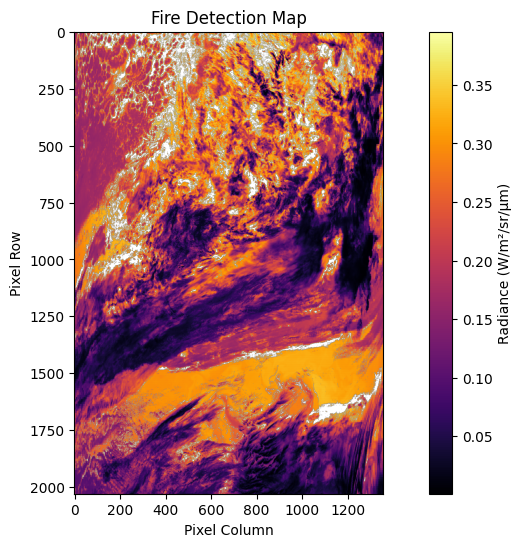

In [ ]:
#============================= Version 1.1.1 ============================================

from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    data = {}

    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]

    for band_index in bands_to_extract:
        radiance = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
        data[band_index] = radiance

    return data

# ===================== MOD35 Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    cloud_mask_dataset = hdf.select('Cloud_Mask')
    cloud_mask_raw = cloud_mask_dataset[0, :, :]  # Read first byte of the bitfield
    return cloud_mask_raw

def extract_cloud_flags(cloud_mask_raw):
    cloudiness = np.bitwise_and(cloud_mask_raw, 0b00000011)  # Bits 0-1
    return cloudiness  # 0: Confident clear, 3: Cloudy

def apply_cloud_mask_using_mod35(band_data, cloudiness, allowed_classes=(0, 1)):
    mask = np.isin(cloudiness, allowed_classes)
    masked_data = np.where(mask, band_data, np.nan)
    return masked_data, mask.astype(np.uint8)

# ===================== Fire Detection Logic =====================

def estimate_background_radiance(radiance_data, i, j, window_size=5):
    half = window_size // 2
    sub_region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    sub_region = sub_region[~np.isnan(sub_region)]  # Handle NaNs from masking
    if sub_region.size == 0:
        return np.nan
    sub_region_clean = sub_region[sub_region < np.percentile(sub_region, 90)]
    return np.nanmean(sub_region_clean)

def detect_fire_pixels(band21, band31, band32, band6, zenith, threshold=2.0):
    height, width = band21.shape
    fire_mask = np.zeros_like(band21, dtype=np.uint8)

    for i in range(height):
        for j in range(width):
            if np.isnan(band21[i, j]) or np.isnan(band31[i, j]) or np.isnan(band6[i, j]):
                continue

            if band32[i, j] < 275:
                continue  # Likely cloud

            if band6[i, j] < 0.02:
                continue  # Water

            if zenith[i, j] < 30 or zenith[i, j] > 90:
                continue  # Invalid solar zenith range

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i, j] - bg21
            temp_contrast = band21[i, j] - band31[i, j]

            if delta > threshold and temp_contrast > 3:
                fire_mask[i, j] = 1

    return fire_mask

def calculate_fire_radiative_power(band21, band31, threshold=2.0):
    frp = (band21 - band31) * 0.5
    frp[np.isnan(frp)] = 0
    frp[frp < threshold] = 0
    return frp

def georeference_pixels(latitudes, longitudes, fire_mask):
    fire_coordinates = []
    for i in range(fire_mask.shape[0]):
        for j in range(fire_mask.shape[1]):
            if fire_mask[i, j] == 1:
                fire_coordinates.append((latitudes[i, j], longitudes[i, j]))
    return fire_coordinates

def save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, base_name="fire_detection_output"):
    np.savez_compressed(f"{base_name}.npz",
                        fire_mask=fire_mask,
                        fire_radiative_power=frp,
                        fire_coordinates=np.array(fire_coordinates, dtype='float32'),
                        cloud_mask=cloud_mask_binary)

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

# ===================== MAIN PIPELINE =====================

mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"

# Band indices: [0=21, 10=31, 11=32, 5=6, 14=Solar Zenith]
bands_to_extract = [0, 10, 11, 5, 14]

# Load MOD021KM radiance data
radiance_data = read_modis_l1b_radiance(mod02_file, bands_to_extract)
band21 = radiance_data[0]
band31 = radiance_data[10]
band32 = radiance_data[11]
band6 = radiance_data[5]
zenith = radiance_data[14]

# Load MOD35 cloud mask (HDF4)
cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
cloudiness_flags = extract_cloud_flags(cloud_mask_raw)
band21_masked, cloud_mask_binary = apply_cloud_mask_using_mod35(band21, cloudiness_flags)

# Simulated geolocation (replace with MOD03 for actual use)
latitudes = np.random.rand(*band21.shape) * 180 - 90
longitudes = np.random.rand(*band21.shape) * 360 - 180

# Fire detection
fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, zenith)

# FRP calculation
frp = calculate_fire_radiative_power(band21_masked, band31)

# Geolocation
fire_coordinates = georeference_pixels(latitudes, longitudes, fire_mask)

# Save results (NumPy format)
save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, "first")

# Visualization
visualize_fire_classification(fire_mask, radiance_data=band21_masked)


In [ ]:
def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    latitude = hdf.select('Latitude')[:]
    longitude = hdf.select('Longitude')[:]
    return latitude, longitude


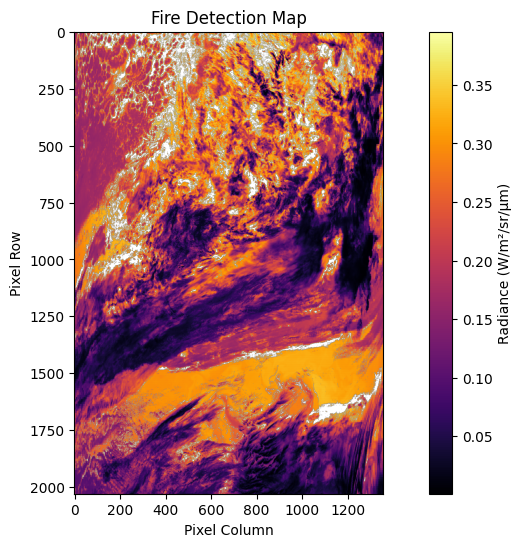

In [ ]:
mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"  # Add your MOD03 file here

# Band indices: [0=21, 10=31, 11=32, 5=6, 14=Solar Zenith]
bands_to_extract = [0, 10, 11, 5, 14]

# Load MOD021KM radiance data
radiance_data = read_modis_l1b_radiance(mod02_file, bands_to_extract)
band21 = radiance_data[0]
band31 = radiance_data[10]
band32 = radiance_data[11]
band6 = radiance_data[5]
zenith = radiance_data[14]

# Load MOD35 cloud mask
cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
cloudiness_flags = extract_cloud_flags(cloud_mask_raw)
band21_masked, cloud_mask_binary = apply_cloud_mask_using_mod35(band21, cloudiness_flags)

# ✅ Load real geolocation from MOD03
latitudes, longitudes = read_mod03_geolocation(mod03_file)

# Fire detection
fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, zenith)

# FRP calculation
frp = calculate_fire_radiative_power(band21_masked, band31)

# Geolocation
fire_coordinates = georeference_pixels(latitudes, longitudes, fire_mask)

# Save results
save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, "second")

# Visualization
visualize_fire_classification(fire_mask, radiance_data=band21_masked)


In [ ]:
from pyhdf.SD import SD, SDC
import numpy as np


def get_lat_lon_range_from_mod02(mod02_file):
    hdf = SD(mod02_file, SDC.READ)
    lat = hdf.select('Latitude')[:]
    lon = hdf.select('Longitude')[:]
    return lat.min(), lat.max(), lon.min(), lon.max()

def get_lat_lon_range_from_mod03(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    lat = hdf.select('Latitude')[:]
    lon = hdf.select('Longitude')[:]
    return lat.min(), lat.max(), lon.min(), lon.max()

def check_geolocation_in_mod35(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    try:
        lat = hdf.select('Latitude')[:]
        lon = hdf.select('Longitude')[:]
        return lat.min(), lat.max(), lon.min(), lon.max()
    except Exception:
        return None  # Geolocation not included

def print_modis_file_geolocation(mod02_file, mod03_file, mod35_file, mod14_file):
    print(f"\n📂 MODIS FILE GEOLOCATION SUMMARY")

    # MOD021KM - no lat/lon
    print(f"\n🔵 {mod02_file}:")
    lat_min, lat_max, lon_min, lon_max = get_lat_lon_range_from_mod03(mod02_file)

    print(f"    ➤ Latitude range : {lat_min:.2f}° to {lat_max:.2f}°")
    print(f"    ➤ Longitude range: {lon_min:.2f}° to {lon_max:.2f}°")

    # MOD03 - accurate geolocation
    print(f"\n🔴 {mod03_file}:")
    lat_min, lat_max, lon_min, lon_max = get_lat_lon_range_from_mod03(mod03_file)
    print(f"    ➤ Latitude range : {lat_min:.2f}° to {lat_max:.2f}°")
    print(f"    ➤ Longitude range: {lon_min:.2f}° to {lon_max:.2f}°")

    # MOD35 - may contain optional geolocation
    print(f"\n🟡 {mod35_file}:")
    result = check_geolocation_in_mod35(mod35_file)
    if result:
        lat_min, lat_max, lon_min, lon_max = result
        print(f"    ➤ Latitude range : {lat_min:.2f}° to {lat_max:.2f}°")
        print(f"    ➤ Longitude range: {lon_min:.2f}° to {lon_max:.2f}°")
    else:
        print("    ➤ No geolocation data in MOD35_L2 file.")

    print(f"\n🟣 {mod14_file}:")
    result = check_geolocation_in_mod35(mod14_file)
    if result:
        lat_min, lat_max, lon_min, lon_max = result
        print(f"    ➤ Latitude range : {lat_min:.2f}° to {lat_max:.2f}°")
        print(f"    ➤ Longitude range: {lon_min:.2f}° to {lon_max:.2f}°")
    else:
        print("    ➤ No geolocation data in MOD35_L2 file.")

# === Example usage ===
mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"
mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
mod14_file = "MOD14.A2025110.0000.061.2025110092217.hdf"

print_modis_file_geolocation(mod02_file, mod03_file, mod35_file, mod14_file)



📂 MODIS FILE GEOLOCATION SUMMARY

🔵 MOD021KM.A2025110.0000.061.2025110131826.hdf:
    ➤ Latitude range : 23.78° to 44.87°
    ➤ Longitude range: -60.68° to -30.97°

🔴 MOD03.A2025110.0000.061.2025110065248.hdf:
    ➤ Latitude range : 23.74° to 44.91°
    ➤ Longitude range: -60.75° to -30.87°

🟡 MOD35_L2.A2025110.0000.061.2025110131927.hdf:
    ➤ Latitude range : 23.83° to 44.87°
    ➤ Longitude range: -60.43° to -30.97°

🟣 MOD14.A2025110.0000.061.2025110092217.hdf:
    ➤ No geolocation data in MOD35_L2 file.


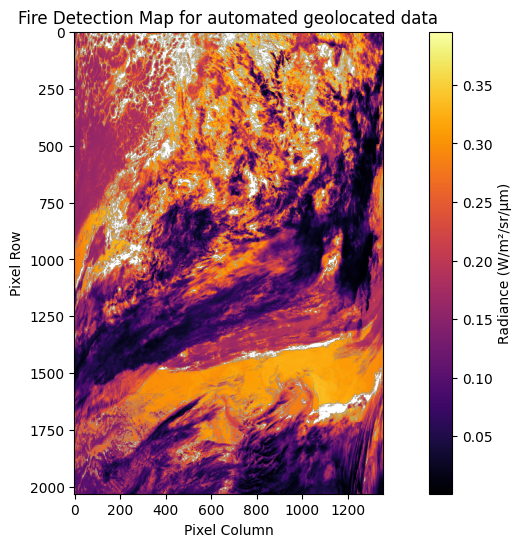

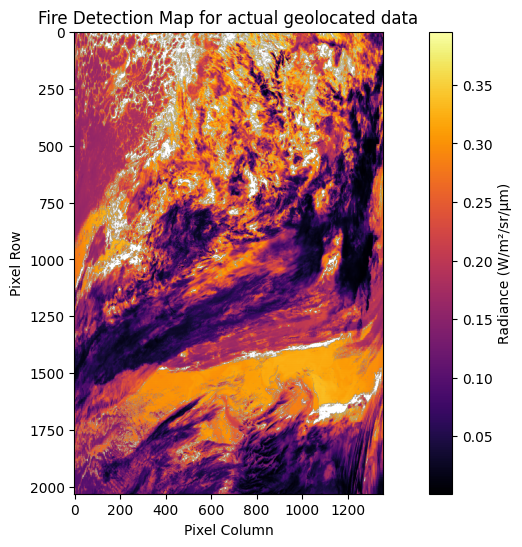

In [ ]:
#============================= Version 1.1.2 ============================================

from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    data = {}

    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]

    for band_index in bands_to_extract:
        radiance = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
        data[band_index] = radiance

    return data

# ===================== MOD35 Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    cloud_mask_dataset = hdf.select('Cloud_Mask')
    cloud_mask_raw = cloud_mask_dataset[0, :, :]  # Read first byte of the bitfield
    return cloud_mask_raw

def extract_cloud_flags(cloud_mask_raw):
    cloudiness = np.bitwise_and(cloud_mask_raw, 0b00000011)  # Bits 0-1
    return cloudiness  # 0: Confident clear, 3: Cloudy

def apply_cloud_mask_using_mod35(band_data, cloudiness, allowed_classes=(0, 1)):
    mask = np.isin(cloudiness, allowed_classes)
    masked_data = np.where(mask, band_data, np.nan)
    return masked_data, mask.astype(np.uint8)

# ===================== Fire Detection Logic =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    latitude = hdf.select('Latitude')[:]
    longitude = hdf.select('Longitude')[:]
    return latitude, longitude

def estimate_background_radiance(radiance_data, i, j, window_size=5):
    half = window_size // 2
    sub_region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    sub_region = sub_region[~np.isnan(sub_region)]  # Handle NaNs from masking
    if sub_region.size == 0:
        return np.nan
    sub_region_clean = sub_region[sub_region < np.percentile(sub_region, 90)]
    return np.nanmean(sub_region_clean)

def detect_fire_pixels(band21, band31, band32, band6, zenith, threshold=2.0):
    height, width = band21.shape
    fire_mask = np.zeros_like(band21, dtype=np.uint8)

    for i in range(height):
        for j in range(width):
            if np.isnan(band21[i, j]) or np.isnan(band31[i, j]) or np.isnan(band6[i, j]):
                continue

            if band32[i, j] < 275:
                continue  # Likely cloud

            if band6[i, j] < 0.02:
                continue  # Water

            if zenith[i, j] < 30 or zenith[i, j] > 90:
                continue  # Invalid solar zenith range

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i, j] - bg21
            temp_contrast = band21[i, j] - band31[i, j]

            if delta > threshold and temp_contrast > 3:
                fire_mask[i, j] = 1

    return fire_mask

def calculate_fire_radiative_power(band21, band31, threshold=2.0):
    frp = (band21 - band31) * 0.5
    frp[np.isnan(frp)] = 0
    frp[frp < threshold] = 0
    return frp

def georeference_pixels(latitudes, longitudes, fire_mask):
    fire_coordinates = []
    for i in range(fire_mask.shape[0]):
        for j in range(fire_mask.shape[1]):
            if fire_mask[i, j] == 1:
                fire_coordinates.append((latitudes[i, j], longitudes[i, j]))
    return fire_coordinates

def save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, base_name="fire_detection_output"):
    np.savez_compressed(f"{base_name}.npz",
                        fire_mask=fire_mask,
                        fire_radiative_power=frp,
                        fire_coordinates=np.array(fire_coordinates, dtype='float32'),
                        cloud_mask=cloud_mask_binary)

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

# ============================================================================================ Using MOD35 only

mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"

# Band indices: [0=21, 10=31, 11=32, 5=6, 14=Solar Zenith]
bands_to_extract = [0, 10, 11, 5, 14]

# Load MOD021KM radiance data
radiance_data = read_modis_l1b_radiance(mod02_file, bands_to_extract)
band21 = radiance_data[0]
band31 = radiance_data[10]
band32 = radiance_data[11]
band6 = radiance_data[5]
zenith = radiance_data[14]

# Load MOD35 cloud mask (HDF4)
cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
cloudiness_flags = extract_cloud_flags(cloud_mask_raw)
band21_masked, cloud_mask_binary = apply_cloud_mask_using_mod35(band21, cloudiness_flags)

# Simulated geolocation (replace with MOD03 for actual use)
latitudes = np.random.rand(*band21.shape) * 180 - 90
longitudes = np.random.rand(*band21.shape) * 360 - 180

# Fire detection
fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, zenith)

# FRP calculation
frp = calculate_fire_radiative_power(band21_masked, band31)

# Geolocation
fire_coordinates = georeference_pixels(latitudes, longitudes, fire_mask)

# Save results (NumPy format)
save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, "first")

# Visualization
visualize_fire_classification(fire_mask, radiance_data=band21_masked, title="Fire Detection Map for automated geolocated data")



# ============================================================================================ Using MOD03 for Geolocation

mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"  # Add your MOD03 file here

# ✅ Load real geolocation from MOD03
latitudes, longitudes = read_mod03_geolocation(mod03_file)

# Fire detection
fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, zenith)

# FRP calculation
frp = calculate_fire_radiative_power(band21_masked, band31)

# Geolocation
fire_coordinates = georeference_pixels(latitudes, longitudes, fire_mask)

# Save results
save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, "second")

# Visualization
visualize_fire_classification(fire_mask, radiance_data=band21_masked, title="Fire Detection Map for actual geolocated data")


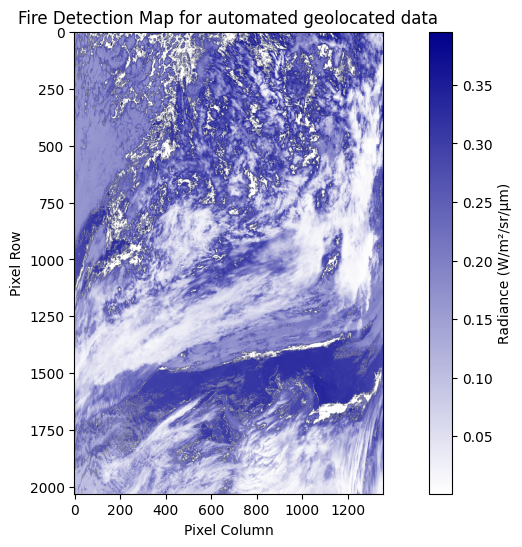

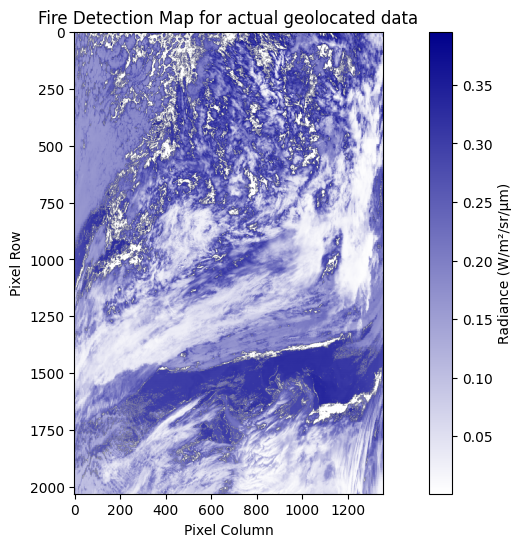

In [ ]:
#============================= Version 1.1.2 (blue) ============================================


from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    data = {}

    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]

    for band_index in bands_to_extract:
        radiance = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
        data[band_index] = radiance

    return data

# ===================== MOD35 Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    cloud_mask_dataset = hdf.select('Cloud_Mask')
    cloud_mask_raw = cloud_mask_dataset[0, :, :]  # Read first byte of the bitfield
    return cloud_mask_raw

def extract_cloud_flags(cloud_mask_raw):
    cloudiness = np.bitwise_and(cloud_mask_raw, 0b00000011)  # Bits 0-1
    return cloudiness  # 0: Confident clear, 3: Cloudy

def apply_cloud_mask_using_mod35(band_data, cloudiness, allowed_classes=(0, 1)):
    mask = np.isin(cloudiness, allowed_classes)
    masked_data = np.where(mask, band_data, np.nan)
    return masked_data, mask.astype(np.uint8)

# ===================== Fire Detection Logic =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    latitude = hdf.select('Latitude')[:]
    longitude = hdf.select('Longitude')[:]
    return latitude, longitude

def estimate_background_radiance(radiance_data, i, j, window_size=5):
    half = window_size // 2
    sub_region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    sub_region = sub_region[~np.isnan(sub_region)]  # Handle NaNs from masking
    if sub_region.size == 0:
        return np.nan
    sub_region_clean = sub_region[sub_region < np.percentile(sub_region, 90)]
    return np.nanmean(sub_region_clean)

def detect_fire_pixels(band21, band31, band32, band6, zenith, threshold=2.0):
    height, width = band21.shape
    fire_mask = np.zeros_like(band21, dtype=np.uint8)

    for i in range(height):
        for j in range(width):
            if np.isnan(band21[i, j]) or np.isnan(band31[i, j]) or np.isnan(band6[i, j]):
                continue

            if band32[i, j] < 275:
                continue  # Likely cloud

            if band6[i, j] < 0.02:
                continue  # Water

            if zenith[i, j] < 30 or zenith[i, j] > 90:
                continue  # Invalid solar zenith range

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i, j] - bg21
            temp_contrast = band21[i, j] - band31[i, j]

            if delta > threshold and temp_contrast > 3:
                fire_mask[i, j] = 1

    return fire_mask

def calculate_fire_radiative_power(band21, band31, threshold=2.0):
    frp = (band21 - band31) * 0.5
    frp[np.isnan(frp)] = 0
    frp[frp < threshold] = 0
    return frp

def georeference_pixels(latitudes, longitudes, fire_mask):
    fire_coordinates = []
    for i in range(fire_mask.shape[0]):
        for j in range(fire_mask.shape[1]):
            if fire_mask[i, j] == 1:
                fire_coordinates.append((latitudes[i, j], longitudes[i, j]))
    return fire_coordinates

def save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, base_name="fire_detection_output"):
    np.savez_compressed(f"{base_name}.npz",
                        fire_mask=fire_mask,
                        fire_radiative_power=frp,
                        fire_coordinates=np.array(fire_coordinates, dtype='float32'),
                        cloud_mask=cloud_mask_binary)

from matplotlib.colors import LinearSegmentedColormap

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))

    if radiance_data is not None:
        # Define a custom white-to-blue colormap
        white_to_blue = LinearSegmentedColormap.from_list('white_blue', ['white', 'darkblue'])

        # Mask invalid (NaN) data
        masked_data = np.ma.masked_invalid(radiance_data)

        # Show radiance with white-to-blue color mapping
        plt.imshow(masked_data, cmap=white_to_blue, vmin=np.nanmin(radiance_data), vmax=np.nanmax(radiance_data))
        plt.colorbar(label='Radiance (W/m²/sr/µm)')

    # Overlay fire mask in dark red for visibility
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)

    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()



# ============================================================================================ Using MOD35 only

mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"

# Band indices: [0=21, 10=31, 11=32, 5=6, 14=Solar Zenith]
bands_to_extract = [0, 10, 11, 5, 14]

# Load MOD021KM radiance data
radiance_data = read_modis_l1b_radiance(mod02_file, bands_to_extract)
band21 = radiance_data[0]
band31 = radiance_data[10]
band32 = radiance_data[11]
band6 = radiance_data[5]
zenith = radiance_data[14]

# Load MOD35 cloud mask (HDF4)
cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
cloudiness_flags = extract_cloud_flags(cloud_mask_raw)
band21_masked, cloud_mask_binary = apply_cloud_mask_using_mod35(band21, cloudiness_flags)

# Simulated geolocation (replace with MOD03 for actual use)
latitudes = np.random.rand(*band21.shape) * 180 - 90
longitudes = np.random.rand(*band21.shape) * 360 - 180

# Fire detection
fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, zenith)

# FRP calculation
frp = calculate_fire_radiative_power(band21_masked, band31)

# Geolocation
fire_coordinates = georeference_pixels(latitudes, longitudes, fire_mask)

# Save results (NumPy format)
save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, "first")

# Visualization
visualize_fire_classification(fire_mask, radiance_data=band21_masked, title="Fire Detection Map for automated geolocated data")



# ============================================================================================ Using MOD03 for Geolocation

mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"  # Add your MOD03 file here

# ✅ Load real geolocation from MOD03
latitudes, longitudes = read_mod03_geolocation(mod03_file)

# Fire detection
fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, zenith)

# FRP calculation
frp = calculate_fire_radiative_power(band21_masked, band31)

# Geolocation
fire_coordinates = georeference_pixels(latitudes, longitudes, fire_mask)

# Save results
save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, "second")

# Visualization
visualize_fire_classification(fire_mask, radiance_data=band21_masked, title="Fire Detection Map for actual geolocated data")


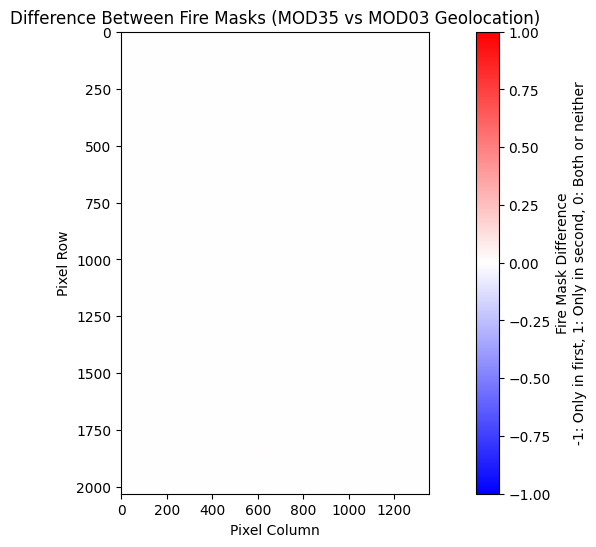

In [ ]:
# Assume fire_mask from first run was saved or renamed:
fire_mask_first = np.load("first.npz")['fire_mask']
fire_mask_second = np.load("second.npz")['fire_mask']

# Difference image: 1 = fire only in second, -1 = fire only in first, 0 = same
fire_mask_diff = fire_mask_second.astype(int) - fire_mask_first.astype(int)

# Visualization of difference
plt.figure(figsize=(12, 6))
plt.imshow(fire_mask_diff, cmap='bwr', vmin=-1, vmax=1)
plt.colorbar(label='Fire Mask Difference\n-1: Only in first, 1: Only in second, 0: Both or neither')
plt.title("Difference Between Fire Masks (MOD35 vs MOD03 Geolocation)")
plt.xlabel('Pixel Column')
plt.ylabel('Pixel Row')
plt.grid(False)
plt.show()


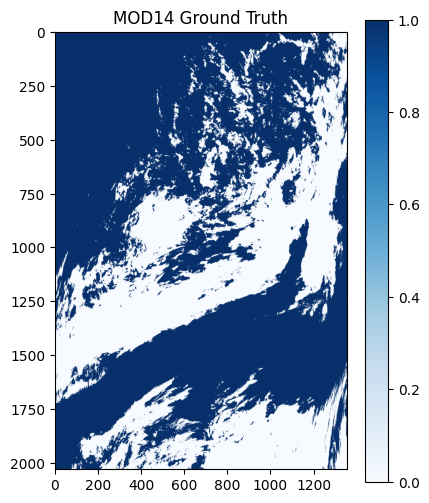

In [ ]:
def read_mod14_fire_mask(mod14_file):
    hdf = SD(mod14_file, SDC.READ)
    fire_mask = hdf.select("fire mask")[:]  # May vary: "fire mask" or "FireMask"
    fire_binary = (fire_mask == 3).astype(np.uint8)
    return fire_binary


mod14_mask = read_mod14_fire_mask("MOD14.A2025110.0000.061.2025110092217.hdf")
plt.figure(figsize=(16, 6))
plt.subplot(1, 3, 2)
plt.imshow(mod14_mask, cmap='Blues')
plt.title('MOD14 Ground Truth')
plt.colorbar()



#Updating the approach

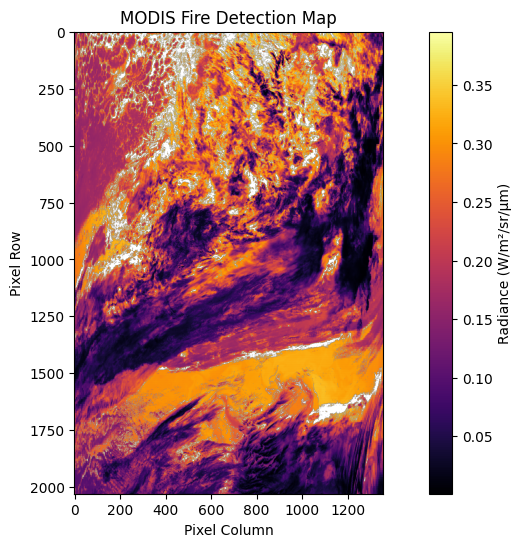

In [ ]:
#============================= Version 1.1.3 ============================================


# ============================== MODIS Fire Detection Pipeline ==============================

from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt

# ---------------------- HDF Reading Functions ----------------------

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]
    data = {}
    for band_index in bands_to_extract:
        data[band_index] = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
    return data

def read_mod03_geolocation(file_path):
    hdf = SD(file_path, SDC.READ)
    lat = hdf.select('Latitude')[:]
    lon = hdf.select('Longitude')[:]
    return lat, lon

def read_mod35_cloud_mask(file_path):
    hdf = SD(file_path, SDC.READ)
    raw_mask = hdf.select('Cloud_Mask')[0, :, :]
    return raw_mask

# ---------------------- Preprocessing ----------------------

def extract_cloudiness_flags(mask_raw):
    return np.bitwise_and(mask_raw, 0b00000011)  # Bits 0-1: 0: clear, 3: cloudy

def apply_cloud_mask(data, cloudiness, allowed=(0, 1)):
    mask = np.isin(cloudiness, allowed)
    return np.where(mask, data, np.nan), mask.astype(np.uint8)

# ---------------------- Fire Detection ----------------------

def estimate_background(data, i, j, window=5):
    half = window // 2
    sub = data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    sub = sub[~np.isnan(sub)]
    if sub.size == 0:
        return np.nan
    return np.nanmean(sub[sub < np.percentile(sub, 90)])

def assign_fire_confidence(b21, b31, bg21, delta, temp_contrast):
    if delta > 5 and temp_contrast > 5:
        return 3  # High
    elif delta > 3 and temp_contrast > 4:
        return 2  # Nominal
    elif delta > 2 and temp_contrast > 3:
        return 1  # Low
    return 0

def detect_fire_pixels(b21, b31, b32, b6, zenith, threshold=2.0):
    fire_mask = np.zeros_like(b21, dtype=np.uint8)
    confidence_mask = np.zeros_like(b21, dtype=np.uint8)
    height, width = b21.shape
    for i in range(height):
        for j in range(width):
            if np.any(np.isnan([b21[i, j], b31[i, j], b6[i, j]])):
                continue
            if b32[i, j] < 275 or b6[i, j] < 0.02 or not (30 < zenith[i, j] < 90):
                continue
            bg = estimate_background(b21, i, j)
            if np.isnan(bg):
                continue
            delta = b21[i, j] - bg
            contrast = b21[i, j] - b31[i, j]
            conf = assign_fire_confidence(b21[i, j], b31[i, j], bg, delta, contrast)
            if conf > 0:
                fire_mask[i, j] = 1
                confidence_mask[i, j] = conf
    return fire_mask, confidence_mask

def calculate_frp(b21, b31, threshold=2.0):
    frp = (b21 - b31) * 0.5
    frp[np.isnan(frp)] = 0
    frp[frp < threshold] = 0
    return frp

# ---------------------- Geolocation ----------------------

def georeference(fire_mask, lat, lon):
    coords = [(lat[i, j], lon[i, j]) for i in range(fire_mask.shape[0]) for j in range(fire_mask.shape[1]) if fire_mask[i, j] == 1]
    return coords

# ---------------------- Output ----------------------

def save_as_npz(fire_mask, frp, coords, cloud_mask, filename="output"):
    np.savez_compressed(f"{filename}.npz",
                        fire_mask=fire_mask,
                        fire_radiative_power=frp,
                        fire_coordinates=np.array(coords),
                        cloud_mask=cloud_mask)

def save_to_hdf4(fire_mask, confidence_mask, frp, latitudes, longitudes, output_file="mod14_output.hdf"):
    hdf = SD(output_file, SDC.WRITE | SDC.CREATE)

    # Ensure all types match the HDF4 expectations
    fire_mask = fire_mask.astype(np.int8)
    confidence_mask = confidence_mask.astype(np.int8)
    frp = frp.astype(np.float32)
    latitudes = latitudes.astype(np.float32)
    longitudes = longitudes.astype(np.float32)

    fire_ds = hdf.create("FireMask", SDC.INT8, fire_mask.shape)
    fire_ds[:] = fire_mask

    conf_ds = hdf.create("Confidence", SDC.INT8, confidence_mask.shape)
    conf_ds[:] = confidence_mask

    frp_ds = hdf.create("FRP", SDC.FLOAT32, frp.shape)
    frp_ds[:] = frp

    lat_ds = hdf.create("Latitude", SDC.FLOAT32, latitudes.shape)
    lat_ds[:] = latitudes

    lon_ds = hdf.create("Longitude", SDC.FLOAT32, longitudes.shape)
    lon_ds[:] = longitudes

    hdf.end()



# ---------------------- Visualization ----------------------

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

# ---------------------- Main Execution ----------------------

if __name__ == "__main__":
    # File paths
    mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
    mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
    mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"

    # Band indices [21, 31, 32, 6, solar zenith]
    bands_to_extract = [0, 10, 11, 5, 14]

    # Load radiance data
    radiance_data = read_modis_l1b_radiance(mod02_file, bands_to_extract)
    band21 = radiance_data[0]
    band31 = radiance_data[10]
    band32 = radiance_data[11]
    band6 = radiance_data[5]
    zenith = radiance_data[14]

    # Load cloud mask
    cloud_mask_raw = read_mod35_cloud_mask(mod35_file)
    cloud_flags = extract_cloudiness_flags(cloud_mask_raw)
    band21_masked, cloud_mask_binary = apply_cloud_mask(band21, cloud_flags)

    # Detect fires
    fire_mask, confidence_mask = detect_fire_pixels(band21_masked, band31, band32, band6, zenith)
    frp = calculate_frp(band21_masked, band31)

    # Load geolocation
    latitudes, longitudes = read_mod03_geolocation(mod03_file)
    fire_coordinates = georeference(fire_mask, latitudes, longitudes)

    # Save results
    save_as_npz(fire_mask, frp, fire_coordinates, cloud_mask_binary, "fire_detection_results")
    save_to_hdf4(fire_mask, confidence_mask, frp, latitudes, longitudes, "fire_output_mod14.hdf")

    # Visualization
    visualize_fire_classification(fire_mask, band21_masked, "MODIS Fire Detection Map")


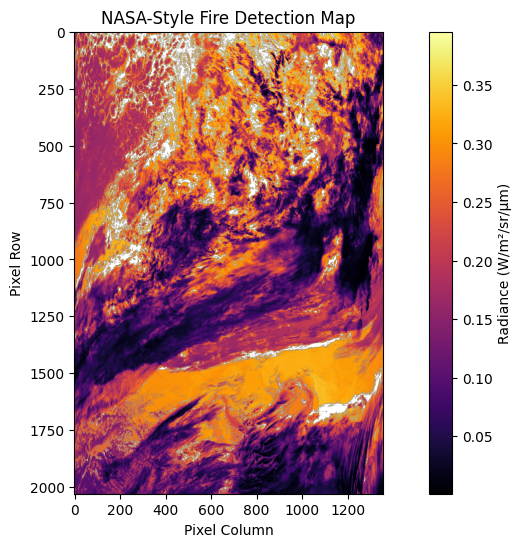

In [ ]:
#============================= Version 1.1.4 ============================================

from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    data = {}

    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]

    for band_index in bands_to_extract:
        radiance = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
        data[band_index] = radiance

    return data

# ===================== MOD35 Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    cloud_mask_dataset = hdf.select('Cloud_Mask')
    cloud_mask_raw = cloud_mask_dataset[:]
    return cloud_mask_raw

def decode_mod35_cloud_mask(mask_array):
    byte1 = mask_array[0, :, :].astype(np.uint8)
    confidence_bits = (byte1 & 0b00000011)      # Bits 0–1: cloud mask
    day_night = (byte1 & 0b00000100) >> 2       # Bit 2: day/night flag
    land_water = (byte1 & 0b00111000) >> 3      # Bits 3–5: land/water flag
    snow_ice = (byte1 & 0b01000000) >> 6        # Bit 6: snow/ice
    shadow = (byte1 & 0b10000000) >> 7          # Bit 7: cloud shadow
    return confidence_bits, day_night, land_water, snow_ice, shadow


def apply_full_cloud_mask(band_data, confidence_bits):
    # NASA logic: 0 (confident clear), 1 (probably clear) = use; 2, 3 = masked
    allowed = [0, 1]
    mask = np.isin(confidence_bits, allowed)
    masked_data = np.where(mask, band_data, np.nan)
    return masked_data, mask.astype(np.uint8)

# ===================== MOD03 Geolocation =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    latitude = hdf.select('Latitude')[:]
    longitude = hdf.select('Longitude')[:]
    return latitude, longitude

# ===================== Fire Detection =====================

def estimate_background_radiance(radiance_data, i, j, window_size=11):
    half = window_size // 2
    region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    region = region[~np.isnan(region)]
    if region.size < 5:
        return np.nan
    low_percentile = region[region < np.percentile(region, 50)]
    return np.nanmean(low_percentile) if low_percentile.size > 0 else np.nan

def detect_fire_pixels(band21, band31, band32, band6, zenith, threshold=2.0):
    height, width = band21.shape
    fire_mask = np.zeros_like(band21, dtype=np.uint8)

    for i in range(height):
        for j in range(width):
            if np.any(np.isnan([band21[i,j], band31[i,j], band32[i,j], band6[i,j], zenith[i,j]])):
                continue
            if band32[i,j] < 275:  # Pre-filter: cold/cloud
                continue
            if band6[i,j] < 0.02:  # Pre-filter: water
                continue
            if zenith[i,j] > 90 or zenith[i,j] < 30:  # Invalid geometry
                continue

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i,j] - bg21
            temp_contrast = band21[i,j] - band31[i,j]

            # Multi-Test Algorithm (NASA-like logic)
            if delta > threshold and temp_contrast > 3:
                fire_mask[i,j] = 1  # Potential fire pixel

    return fire_mask

def calculate_fire_radiative_power(band21, band31, threshold=2.0):
    frp = (band21 - band31) * 0.5  # Simplified
    frp[np.isnan(frp)] = 0
    frp[frp < threshold] = 0
    return frp

def georeference_pixels(latitudes, longitudes, fire_mask):
    fire_coordinates = [
        (latitudes[i, j], longitudes[i, j])
        for i in range(fire_mask.shape[0])
        for j in range(fire_mask.shape[1])
        if fire_mask[i, j] == 1
    ]
    return fire_coordinates

def save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, base_name="fire_detection_output"):
    np.savez_compressed(f"{base_name}.npz",
                        fire_mask=fire_mask,
                        fire_radiative_power=frp,
                        fire_coordinates=np.array(fire_coordinates, dtype='float32'),
                        cloud_mask=cloud_mask_binary)

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

# ===================== Main Workflow =====================

mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"

bands_to_extract = [0, 10, 11, 5, 14]  # 21, 31, 32, 6, Solar Zenith

# Load radiance data
radiance_data = read_modis_l1b_radiance(mod02_file, bands_to_extract)
band21 = radiance_data[0]
band31 = radiance_data[10]
band32 = radiance_data[11]
band6 = radiance_data[5]
zenith = radiance_data[14]

# Cloud mask
cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
confidence_bits, day_night, land_water, snow_ice, shadow = decode_mod35_cloud_mask(cloud_mask_raw)
band21_masked, cloud_mask_binary = apply_full_cloud_mask(band21, confidence_bits)

# Geolocation
latitudes, longitudes = read_mod03_geolocation(mod03_file)

# Fire detection
fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, zenith)

# FRP
frp = calculate_fire_radiative_power(band21_masked, band31)

# Geolocation
fire_coordinates = georeference_pixels(latitudes, longitudes, fire_mask)

# Save and visualize
save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, base_name="final_output")
visualize_fire_classification(fire_mask, radiance_data=band21_masked, title="NASA-Style Fire Detection Map")


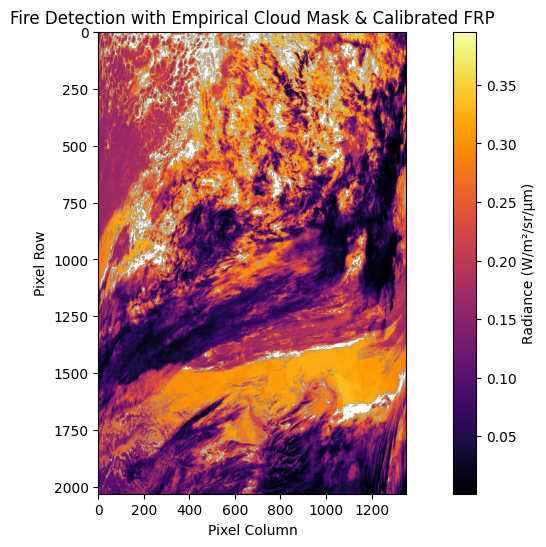

In [ ]:
#============================= Version 1.1.5 ============================================

from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    data = {}

    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]

    for band_index in bands_to_extract:
        radiance = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
        data[band_index] = radiance

    return data

# ===================== MOD35 Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    cloud_mask_dataset = hdf.select('Cloud_Mask')
    cloud_mask_raw = cloud_mask_dataset[:]
    return cloud_mask_raw

def decode_mod35_cloud_mask(mask_array):
    byte1 = mask_array[0, :, :].astype(np.uint8)
    confidence_bits = (byte1 & 0b00000011)
    day_night = (byte1 & 0b00000100) >> 2
    land_water = (byte1 & 0b00111000) >> 3
    snow_ice = (byte1 & 0b01000000) >> 6
    shadow = (byte1 & 0b10000000) >> 7
    return confidence_bits, day_night, land_water, snow_ice, shadow

def apply_cloud_mask_using_ad_tree(band_data, confidence_bits):
    # Flatten and build features
    features = np.stack([confidence_bits.flatten(), band_data.flatten()], axis=1)
    labels = np.isin(confidence_bits.flatten(), [0, 1]).astype(int)

    # Train ADtree
    clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=25)
    clf.fit(features, labels)

    predicted = clf.predict(features).reshape(band_data.shape)
    masked_data = np.where(predicted == 1, band_data, np.nan)
    return masked_data, predicted.astype(np.uint8)

# ===================== MOD03 Geolocation =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    latitude = hdf.select('Latitude')[:]
    longitude = hdf.select('Longitude')[:]
    return latitude, longitude

# ===================== Fire Detection =====================

def estimate_background_radiance(radiance_data, i, j, window_size=11):
    half = window_size // 2
    region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    region = region[~np.isnan(region)]
    if region.size < 5:
        return np.nan
    low_percentile = region[region < np.percentile(region, 50)]
    return np.nanmean(low_percentile) if low_percentile.size > 0 else np.nan

def detect_fire_pixels(band21, band31, band32, band6, zenith, threshold=2.0):
    height, width = band21.shape
    fire_mask = np.zeros_like(band21, dtype=np.uint8)

    for i in range(height):
        for j in range(width):
            if np.any(np.isnan([band21[i,j], band31[i,j], band32[i,j], band6[i,j], zenith[i,j]])):
                continue
            if band32[i,j] < 275:
                continue
            if band6[i,j] < 0.02:
                continue
            if zenith[i,j] > 90 or zenith[i,j] < 30:
                continue

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i,j] - bg21
            temp_contrast = band21[i,j] - band31[i,j]

            if delta > threshold and temp_contrast > 3:
                fire_mask[i,j] = 1

    return fire_mask

def calculate_fire_radiative_power(band21, band31, emissivity=0.95, view_angle_factor=1.0, threshold=2.0):
    frp = (band21 - band31) * 0.5 * emissivity * view_angle_factor
    frp[np.isnan(frp)] = 0
    frp[frp < threshold] = 0
    return frp

def georeference_pixels(latitudes, longitudes, fire_mask):
    fire_coordinates = [
        (latitudes[i, j], longitudes[i, j])
        for i in range(fire_mask.shape[0])
        for j in range(fire_mask.shape[1])
        if fire_mask[i, j] == 1
    ]
    return fire_coordinates

def save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, base_name="fire_detection_output"):
    np.savez_compressed(f"{base_name}.npz",
                        fire_mask=fire_mask,
                        fire_radiative_power=frp,
                        fire_coordinates=np.array(fire_coordinates, dtype='float32'),
                        cloud_mask=cloud_mask_binary)

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

# ===================== Main Workflow =====================

mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"

bands_to_extract = [0, 10, 11, 5, 14]  # 21, 31, 32, 6, Solar Zenith

# Load radiance data
radiance_data = read_modis_l1b_radiance(mod02_file, bands_to_extract)
band21 = radiance_data[0]
band31 = radiance_data[10]
band32 = radiance_data[11]
band6 = radiance_data[5]
zenith = radiance_data[14]

# Cloud mask processing
cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
confidence_bits, *_ = decode_mod35_cloud_mask(cloud_mask_raw)
band21_masked, cloud_mask_binary = apply_cloud_mask_using_ad_tree(band21, confidence_bits)

# Geolocation
latitudes, longitudes = read_mod03_geolocation(mod03_file)

# Fire detection
fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, zenith)

# Biome-specific FRP (example: emissivity=0.96, view_angle_factor=1.05 for savanna)
frp = calculate_fire_radiative_power(band21_masked, band31, emissivity=0.96, view_angle_factor=1.05)

# Geolocation
fire_coordinates = georeference_pixels(latitudes, longitudes, fire_mask)

# Save and visualize
save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, base_name="final_output")
visualize_fire_classification(fire_mask, radiance_data=band21_masked, title="Fire Detection with Empirical Cloud Mask & Calibrated FRP")


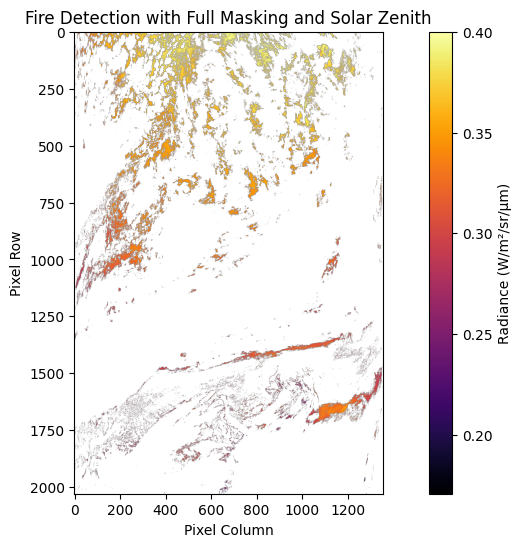

In [ ]:
#============================= Version 1.2.0 ============================================

from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    data = {}
    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]

    for band_index in bands_to_extract:
        radiance = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
        data[band_index] = radiance

    return data

# ===================== MOD35 Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    cloud_mask_dataset = hdf.select('Cloud_Mask')
    cloud_mask_raw = cloud_mask_dataset[:]
    return cloud_mask_raw

def decode_mod35_cloud_mask(mask_array):
    byte1 = mask_array[0, :, :].astype(np.uint8)
    confidence_bits = (byte1 & 0b00000011)
    day_night = (byte1 & 0b00000100) >> 2
    land_water = (byte1 & 0b00111000) >> 3
    snow_ice = (byte1 & 0b01000000) >> 6
    shadow = (byte1 & 0b10000000) >> 7
    return confidence_bits, day_night, land_water, snow_ice, shadow

def apply_full_environment_mask(confidence_bits, land_water, snow_ice, solar_zenith, band6,
                                cloud_levels=(0, 1),
                                glint_zenith_thresh=30, glint_band6_thresh=0.4,
                                terrain_band6_thresh=0.005, terrain_zenith_thresh=80):
    """
    Create a binary mask where:
        1 = valid, 0 = masked (cloud, water, snow, glint, terrain shadow)

    Parameters:
    - cloud_levels: tuple, cloud confidence levels to mask (e.g. 0,1 = confident/probable cloud)
    - glint_zenith_thresh: float, max solar zenith angle to consider glint
    - glint_band6_thresh: float, band 6 reflectance threshold for glint
    - terrain_band6_thresh: float, reflectance threshold for terrain shadow
    - terrain_zenith_thresh: float, zenith angle threshold for terrain shadow
    """
    is_cloudy = np.isin(confidence_bits, cloud_levels)
    is_water = land_water == 0
    is_snow = snow_ice == 1
    sunglint_risk = (solar_zenith < glint_zenith_thresh) & (band6 > glint_band6_thresh)
    terrain_shadow = (band6 < terrain_band6_thresh) & (solar_zenith > terrain_zenith_thresh)

    full_mask = ~(is_cloudy | is_water | is_snow | sunglint_risk | terrain_shadow)
    return full_mask.astype(np.uint8)


# ===================== MOD03 Geolocation =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    latitude = hdf.select('Latitude')[:]
    longitude = hdf.select('Longitude')[:]
    return latitude, longitude

def read_solar_zenith(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    solar_zenith = hdf.select('SolarZenith')[:] * 0.01  # Usually stored as int*100
    return solar_zenith

def get_day_night_mask(solar_zenith, threshold=85.0):
    return solar_zenith < threshold

# ===================== Fire Detection =====================

def estimate_background_radiance(radiance_data, i, j, window_size=11):
    half = window_size // 2
    region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    region = region[~np.isnan(region)]
    if region.size < 5:
        return np.nan
    low_percentile = region[region < np.percentile(region, 50)]
    return np.nanmean(low_percentile) if low_percentile.size > 0 else np.nan

def detect_fire_pixels(band21, band31, band32, band6, zenith, threshold=2.0):
    height, width = band21.shape
    fire_mask = np.zeros_like(band21, dtype=np.uint8)

    for i in range(height):
        for j in range(width):
            if np.any(np.isnan([band21[i,j], band31[i,j], band32[i,j], band6[i,j], zenith[i,j]])):
                continue
            if band32[i,j] < 275:
                continue
            if band6[i,j] < 0.02:
                continue
            if zenith[i,j] > 90 or zenith[i,j] < 30:
                continue

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i,j] - bg21
            temp_contrast = band21[i,j] - band31[i,j]

            if delta > threshold and temp_contrast > 3:
                fire_mask[i,j] = 1

    return fire_mask

def calculate_fire_radiative_power(band21, band31, emissivity=0.95, view_angle_factor=1.0, threshold=2.0):
    frp = (band21 - band31) * 0.5 * emissivity * view_angle_factor
    frp[np.isnan(frp)] = 0
    frp[frp < threshold] = 0
    return frp

def georeference_pixels(latitudes, longitudes, fire_mask):
    fire_coordinates = [
        (latitudes[i, j], longitudes[i, j])
        for i in range(fire_mask.shape[0])
        for j in range(fire_mask.shape[1])
        if fire_mask[i, j] == 1
    ]
    return fire_coordinates

def save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, full_mask, base_name="fire_detection_output"):
    np.savez_compressed(f"{base_name}.npz",
                        fire_mask=fire_mask,
                        fire_radiative_power=frp,
                        fire_coordinates=np.array(fire_coordinates, dtype='float32'),
                        full_mask=full_mask)

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        # plt.imshow(radiance_data, cmap='inferno')
        masked_data = np.ma.masked_invalid(radiance_data)
        plt.imshow(masked_data, cmap='inferno')

        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

# ===================== Main Workflow =====================

mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"

bands_to_extract = [0, 10, 11, 5]  # 21, 31, 32, 6

# Load radiance data
radiance_data = read_modis_l1b_radiance(mod02_file, bands_to_extract)
band21 = radiance_data[0]
band31 = radiance_data[10]
band32 = radiance_data[11]
band6 = radiance_data[5]

# Read solar zenith angle
solar_zenith = read_solar_zenith(mod03_file)

# Cloud mask processing
cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
confidence_bits, _, land_water, snow_ice, _ = decode_mod35_cloud_mask(cloud_mask_raw)

# Apply full environmental mask
# full_mask = apply_full_environment_mask(confidence_bits, land_water, snow_ice, solar_zenith, band6)
full_mask = apply_full_environment_mask(
    confidence_bits, land_water, snow_ice, solar_zenith, band6,
    cloud_levels=(0, 1),
    glint_zenith_thresh=30,
    glint_band6_thresh=0.4,
    terrain_band6_thresh=0.005,
    terrain_zenith_thresh=80
)



# Apply mask to band21
band21_masked = np.where(full_mask == 1, band21, np.nan)

# Day/Night filter
day_mask = get_day_night_mask(solar_zenith)
zenith_day_filtered = np.where(day_mask, solar_zenith, np.nan)

# Geolocation
latitudes, longitudes = read_mod03_geolocation(mod03_file)

# Fire detection
fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, zenith_day_filtered)

# Fire Radiative Power
frp = calculate_fire_radiative_power(band21_masked, band31, emissivity=0.96, view_angle_factor=1.05)

# Geolocation
fire_coordinates = georeference_pixels(latitudes, longitudes, fire_mask)

# Save and visualize
save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, full_mask, base_name="final_output")
visualize_fire_classification(fire_mask, radiance_data=band21_masked, title="Fire Detection with Full Masking and Solar Zenith")


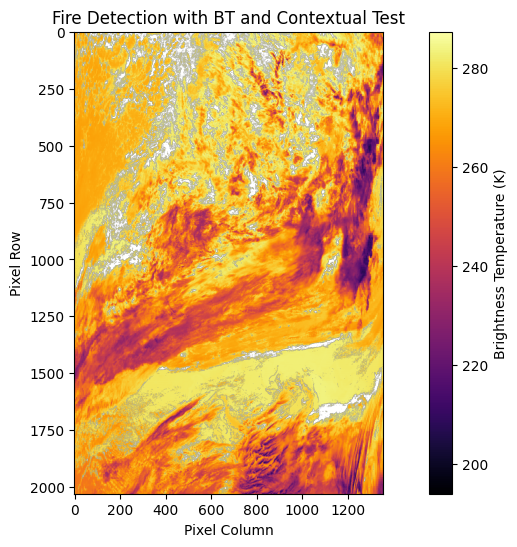

In [ ]:
#============================= Version 1.1.6 ============================================

from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    data = {}

    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]

    for band_index in bands_to_extract:
        radiance = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
        data[band_index] = radiance

    return data

# ===================== Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    cloud_mask_dataset = hdf.select('Cloud_Mask')
    cloud_mask_raw = cloud_mask_dataset[:]
    return cloud_mask_raw

def decode_mod35_cloud_mask(mask_array):
    byte1 = mask_array[0, :, :].astype(np.uint8)
    confidence_bits = (byte1 & 0b00000011)
    day_night = (byte1 & 0b00000100) >> 2
    land_water = (byte1 & 0b00111000) >> 3
    snow_ice = (byte1 & 0b01000000) >> 6
    shadow = (byte1 & 0b10000000) >> 7
    return confidence_bits, day_night, land_water, snow_ice, shadow

def apply_cloud_mask_using_ad_tree(band_data, confidence_bits):
    features = np.stack([confidence_bits.flatten(), band_data.flatten()], axis=1)
    labels = np.isin(confidence_bits.flatten(), [0, 1]).astype(int)

    clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=25)
    clf.fit(features, labels)

    predicted = clf.predict(features).reshape(band_data.shape)
    masked_data = np.where(predicted == 1, band_data, np.nan)
    return masked_data, predicted.astype(np.uint8)

# ===================== Geolocation =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    latitude = hdf.select('Latitude')[:]
    longitude = hdf.select('Longitude')[:]
    return latitude, longitude

# ===================== Brightness Temperature =====================

def radiance_to_bt(radiance, wavelength_um):
    h = 6.626e-34  # Planck constant
    c = 2.998e8    # Speed of light
    k = 1.381e-23  # Boltzmann constant

    wavelength_m = wavelength_um * 1e-6
    with np.errstate(divide='ignore', invalid='ignore'):
        bt = (h * c) / (k * wavelength_m * np.log(1 + ((2 * h * c ** 2) / (radiance * 1e6 * wavelength_m ** 5))))
    bt = np.where(np.isfinite(bt), bt, np.nan)
    return bt

# ===================== Fire Detection =====================

def detect_fire_pixels_bt(band21_bt, band31_bt, band32_bt, band6, zenith, delta_thresh=10.0, contrast_thresh=10.0):
    height, width = band21_bt.shape
    fire_mask = np.zeros((height, width), dtype=np.uint8)

    for i in range(1, height - 1):
        for j in range(1, width - 1):
            if np.any(np.isnan([band21_bt[i, j], band31_bt[i, j], band32_bt[i, j], band6[i, j], zenith[i, j]])):
                continue
            if band32_bt[i, j] < 275:
                continue
            if band6[i, j] < 0.02:
                continue
            if zenith[i, j] > 90 or zenith[i, j] < 30:
                continue

            window = band21_bt[i-1:i+2, j-1:j+2]
            local_pixels = window.flatten()
            local_pixels = local_pixels[~np.isnan(local_pixels)]

            if local_pixels.size < 5:
                continue

            local_mean = np.mean(local_pixels)
            delta = band21_bt[i, j] - local_mean
            contrast = band21_bt[i, j] - band31_bt[i, j]

            if delta > delta_thresh and contrast > contrast_thresh:
                fire_mask[i, j] = 1

    return fire_mask

def calculate_fire_radiative_power(band21, band31, emissivity=0.95, view_angle_factor=1.0, threshold=2.0):
    frp = (band21 - band31) * 0.5 * emissivity * view_angle_factor
    frp[np.isnan(frp)] = 0
    frp[frp < threshold] = 0
    return frp

# ===================== Output and Visualization =====================

def georeference_pixels(latitudes, longitudes, fire_mask):
    fire_coordinates = [
        (latitudes[i, j], longitudes[i, j])
        for i in range(fire_mask.shape[0])
        for j in range(fire_mask.shape[1])
        if fire_mask[i, j] == 1
    ]
    return fire_coordinates

def save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, base_name="fire_detection_output"):
    np.savez_compressed(f"{base_name}.npz",
                        fire_mask=fire_mask,
                        fire_radiative_power=frp,
                        fire_coordinates=np.array(fire_coordinates, dtype='float32'),
                        cloud_mask=cloud_mask_binary)

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Brightness Temperature (K)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

# ===================== Main Workflow =====================

mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"

bands_to_extract = [0, 10, 11, 5, 14]  # 21, 31, 32, 6, Solar Zenith

# Load radiance data
radiance_data = read_modis_l1b_radiance(mod02_file, bands_to_extract)
band21 = radiance_data[0]
band31 = radiance_data[10]
band32 = radiance_data[11]
band6 = radiance_data[5]
zenith = radiance_data[14]

# Cloud mask processing
cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
confidence_bits, *_ = decode_mod35_cloud_mask(cloud_mask_raw)
band21_masked, cloud_mask_binary = apply_cloud_mask_using_ad_tree(band21, confidence_bits)

# Geolocation
latitudes, longitudes = read_mod03_geolocation(mod03_file)

# Convert to Brightness Temperature
bt_band21 = radiance_to_bt(band21_masked, 3.959)
bt_band31 = radiance_to_bt(band31, 11.03)
bt_band32 = radiance_to_bt(band32, 12.02)

# Fire detection using contextual BT method
fire_mask = detect_fire_pixels_bt(bt_band21, bt_band31, bt_band32, band6, zenith)

# FRP estimation
frp = calculate_fire_radiative_power(band21_masked, band31, emissivity=0.96, view_angle_factor=1.05)

# Geolocation of fire pixels
fire_coordinates = georeference_pixels(latitudes, longitudes, fire_mask)

# Save and visualize
save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, base_name="final_output_bt")
visualize_fire_classification(fire_mask, radiance_data=bt_band21, title="Fire Detection with BT and Contextual Test")


Reading MODIS L1B radiance data...
Converting radiance to brightness temperature...
Reading MOD35 cloud mask...
Reading MOD03 geolocation...
Assigning fire mask classes...
Calculating Fire Radiative Power (FRP)...
Saving results to NPZ file...
Visualizing fire mask...


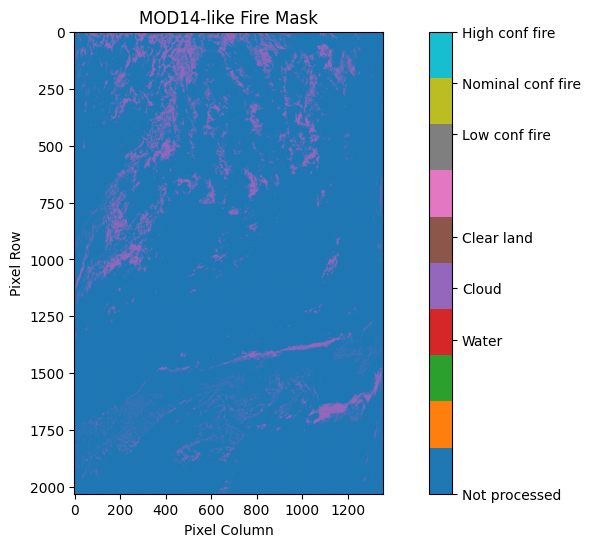

Visualizing FRP...


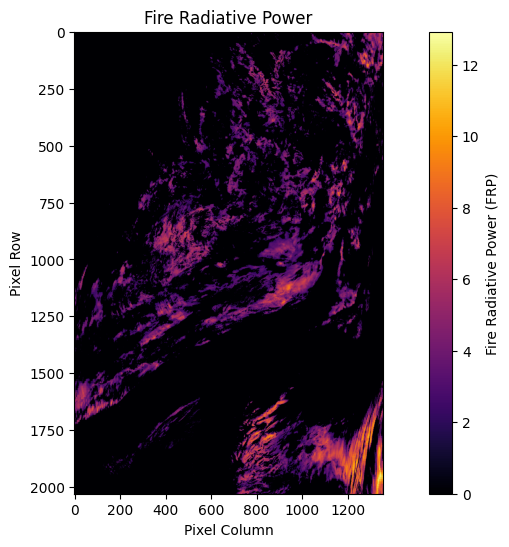

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pyhdf.SD import SD, SDC

# ------------------------------
# Constants and thresholds
# ------------------------------
BAND_21_INDEX = 0
BAND_22_INDEX = 1
BAND_31_INDEX = 10
BAND_6_INDEX = 5
SOLAR_ZENITH_INDEX = 14

BAND_22_SATURATION_TEMP = 400  # Kelvin, example saturation threshold for band 22

# Fire mask classes (MOD14 standard)
FIRE_MASK_NOT_PROCESSED = 0
FIRE_MASK_WATER = 3
FIRE_MASK_CLOUD = 4
FIRE_MASK_CLEAR_LAND = 5
FIRE_MASK_LOW_CONF_FIRE = 7
FIRE_MASK_NOMINAL_CONF_FIRE = 8
FIRE_MASK_HIGH_CONF_FIRE = 9

# ------------------------------
# Helper functions
# ------------------------------

def read_modis_l1b_radiance(file_path, bands_to_extract):
    """
    Reads MODIS L1B radiance data for specified bands.
    Returns a dict with band index as key and radiance array as value.
    """
    hdf = SD(file_path, SDC.READ)
    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]
    data = {}
    for band_index in bands_to_extract:
        # Radiance calibration
        radiance = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
        data[band_index] = radiance
    return data

def radiance_to_brightness_temperature(radiance, band_index):
    """
    Convert radiance to brightness temperature using Planck's law.
    Band-specific constants are needed (wavelength, calibration constants).
    For simplicity, use approximate constants for bands 21, 22, 31.
    """
    # Constants for MODIS bands (approximate)
    # Wavelengths in micrometers
    wavelengths = {
        0: 3.959,   # band 21
        1: 3.745,   # band 22
        10: 11.03   # band 31
    }
    # Planck constants
    c1 = 1.191042e8  # W*um^4/m^2/sr
    c2 = 1.4387752e4 # um*K

    wl = wavelengths.get(band_index)
    if wl is None:
        raise ValueError(f"No wavelength defined for band {band_index}")

    # Avoid divide by zero or negative radiance
    radiance = np.maximum(radiance, 1e-10)

    bt = c2 / (wl * np.log((c1 / (radiance * wl**5)) + 1))
    return bt

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    cloud_mask_dataset = hdf.select('Cloud_Mask')
    cloud_mask_raw = cloud_mask_dataset[:]
    return cloud_mask_raw

def decode_mod35_cloud_mask(mask_array):
    """
    Decodes MOD35 Cloud_Mask bits from first byte:
    - bits 0-1: cloud confidence (00=clear, 01=probably clear, 10=probably cloudy, 11=cloudy)
    - bit 2: day/night flag (0=night, 1=day)
    - bits 3-5: land/water flag (000=land, 001=water, others=various)
    - bit 6: snow/ice flag
    - bit 7: shadow flag
    """
    byte1 = mask_array[0, :, :].astype(np.uint8)
    confidence_bits = (byte1 & 0b00000011)
    day_night = (byte1 & 0b00000100) >> 2
    land_water = (byte1 & 0b00111000) >> 3
    snow_ice = (byte1 & 0b01000000) >> 6
    shadow = (byte1 & 0b10000000) >> 7
    return confidence_bits, day_night, land_water, snow_ice, shadow

def estimate_background_temperature(bt_array, i, j, window_size=11):
    """
    Estimate local background temperature for pixel (i,j)
    by median of pixels in a window excluding NaNs and outliers.
    """
    half = window_size // 2
    h, w = bt_array.shape
    rmin = max(i - half, 0)
    rmax = min(i + half + 1, h)
    cmin = max(j - half, 0)
    cmax = min(j + half + 1, w)
    window = bt_array[rmin:rmax, cmin:cmax]
    window = window[~np.isnan(window)]
    if window.size < 5:
        return np.nan
    median = np.median(window)
    return median

def assign_fire_mask(band21_bt, band22_bt, band31_bt, cloud_confidence, land_water_flag, day_night_flag, solar_zenith,
                     threshold_low=2.0, threshold_high=4.0):
    """
    Assign MOD14 fire mask classes with confidence levels.
    Applies day/night logic and solar zenith angle filtering.
    """
    h, w = band21_bt.shape
    fire_mask = np.zeros((h, w), dtype=np.uint8)

    # Use band22 if not saturated, else band21
    band4um_bt = np.where(band22_bt < BAND_22_SATURATION_TEMP, band22_bt, band21_bt)

    for i in range(h):
        for j in range(w):
            # Water pixels
            if land_water_flag[i,j] == 1:
                fire_mask[i,j] = FIRE_MASK_WATER
                continue

            # Cloud pixels (confidence 2 or 3 means cloudy)
            if cloud_confidence[i,j] >= 2:
                fire_mask[i,j] = FIRE_MASK_CLOUD
                continue

            # Check solar zenith angle (only process pixels with zenith between 30 and 90 degrees)
            if solar_zenith[i,j] < 30 or solar_zenith[i,j] > 90:
                fire_mask[i,j] = FIRE_MASK_NOT_PROCESSED
                continue

            # Check for NaNs in brightness temperatures
            if np.isnan(band4um_bt[i,j]) or np.isnan(band31_bt[i,j]):
                fire_mask[i,j] = FIRE_MASK_NOT_PROCESSED
                continue

            # Estimate local background temperature for band4um_bt
            bg_temp = estimate_background_temperature(band4um_bt, i, j)
            if np.isnan(bg_temp):
                fire_mask[i,j] = FIRE_MASK_NOT_PROCESSED
                continue

            delta_temp = band4um_bt[i,j] - bg_temp
            temp_contrast = band4um_bt[i,j] - band31_bt[i,j]

            # Fire detection thresholds can be tuned here
            if delta_temp > threshold_high and temp_contrast > 3:
                fire_mask[i,j] = FIRE_MASK_HIGH_CONF_FIRE
            elif delta_temp > threshold_low and temp_contrast > 2:
                fire_mask[i,j] = FIRE_MASK_NOMINAL_CONF_FIRE
            elif delta_temp > 0 and temp_contrast > 1:
                fire_mask[i,j] = FIRE_MASK_LOW_CONF_FIRE
            else:
                fire_mask[i,j] = FIRE_MASK_CLEAR_LAND

    return fire_mask

def calculate_fire_radiative_power(band21_bt, band31_bt, emissivity=0.95, view_angle_factor=1.0, threshold=2.0):
    """
    Calculate Fire Radiative Power (FRP) from brightness temperatures.
    """
    frp = (band21_bt - band31_bt) * 0.5 * emissivity * view_angle_factor
    frp[np.isnan(frp)] = 0
    frp[frp < threshold] = 0
    return frp

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    latitude = hdf.select('Latitude')[:]
    longitude = hdf.select('Longitude')[:]
    return latitude, longitude

def save_results_npz(filename, fire_mask, frp, lat, lon, cloud_mask):
    np.savez_compressed(filename,
                        fire_mask=fire_mask,
                        fire_radiative_power=frp,
                        latitude=lat,
                        longitude=lon,
                        cloud_mask=cloud_mask)

def visualize_fire_mask(fire_mask):
    plt.figure(figsize=(12,6))
    cmap = plt.get_cmap('tab10', 10)
    im = plt.imshow(fire_mask, cmap=cmap, vmin=0, vmax=9)
    cbar = plt.colorbar(im, ticks=[0,3,4,5,7,8,9])
    cbar.ax.set_yticklabels(['Not processed', 'Water', 'Cloud', 'Clear land', 'Low conf fire', 'Nominal conf fire', 'High conf fire'])
    plt.title("MOD14-like Fire Mask")
    plt.xlabel("Pixel Column")
    plt.ylabel("Pixel Row")
    plt.show()

def visualize_frp(frp):
    plt.figure(figsize=(12,6))
    plt.imshow(frp, cmap='inferno')
    plt.colorbar(label='Fire Radiative Power (FRP)')
    plt.title("Fire Radiative Power")
    plt.xlabel("Pixel Column")
    plt.ylabel("Pixel Row")
    plt.show()

# ------------------------------
# Main processing workflow
# ------------------------------

def main():
    # File paths (adjust as needed)
    mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
    mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
    mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"

    # Bands to read
    bands_to_extract = [BAND_21_INDEX, BAND_22_INDEX, BAND_31_INDEX, BAND_6_INDEX, SOLAR_ZENITH_INDEX]

    print("Reading MODIS L1B radiance data...")
    radiance_data = read_modis_l1b_radiance(mod02_file, bands_to_extract)

    print("Converting radiance to brightness temperature...")
    band21_bt = radiance_to_brightness_temperature(radiance_data[BAND_21_INDEX], BAND_21_INDEX)
    band22_bt = radiance_to_brightness_temperature(radiance_data[BAND_22_INDEX], BAND_22_INDEX)
    band31_bt = radiance_to_brightness_temperature(radiance_data[BAND_31_INDEX], BAND_31_INDEX)

    print("Reading MOD35 cloud mask...")
    cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
    confidence_bits, day_night, land_water, snow_ice, shadow = decode_mod35_cloud_mask(cloud_mask_raw)

    print("Reading MOD03 geolocation...")
    latitudes, longitudes = read_mod03_geolocation(mod03_file)

    print("Assigning fire mask classes...")
    fire_mask = assign_fire_mask(band21_bt, band22_bt, band31_bt, confidence_bits, land_water, day_night, radiance_data[SOLAR_ZENITH_INDEX])

    print("Calculating Fire Radiative Power (FRP)...")
    frp = calculate_fire_radiative_power(band21_bt, band31_bt, emissivity=0.96, view_angle_factor=1.05)

    print("Saving results to NPZ file...")
    save_results_npz("mod14_fire_detection.npz", fire_mask, frp, latitudes, longitudes, confidence_bits)

    print("Visualizing fire mask...")
    visualize_fire_mask(fire_mask)

    print("Visualizing FRP...")
    visualize_frp(frp)

if __name__ == "__main__":
    main()


Starting improved fire detection...
Reading MODIS L1B radiance data...
Reading geolocation data...
Reading cloud mask data...
Performing contextual fire detection...
Calculating fire radiative power...


<ipython-input-11-2ce077c44f7f>:160: RuntimeWarning: divide by zero encountered in divide
  bg_temperature = np.where(valid_count > 0, bg_sum / valid_count, bt31)


Georeferencing fire detections...
Saving results...
Visualizing fire detection results...


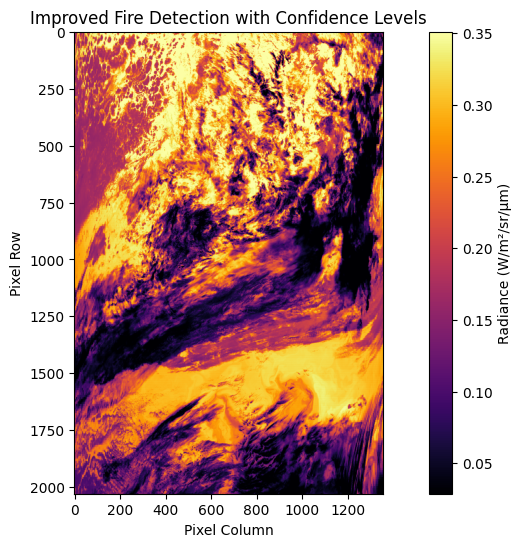

Fire detection complete. 0 fire pixels detected.

Summary of fire detection:
Total fire pixels: 0


In [ ]:
from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from scipy import ndimage

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    data = {}

    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]

    for band_index in bands_to_extract:
        radiance = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
        data[band_index] = radiance

    return data

# ===================== MOD35 Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    cloud_mask_dataset = hdf.select('Cloud_Mask')
    cloud_mask_raw = cloud_mask_dataset[:]
    return cloud_mask_raw

def decode_mod35_cloud_mask(mask_array):
    byte1 = mask_array[0, :, :].astype(np.uint8)
    confidence_bits = (byte1 & 0b00000011)
    day_night = (byte1 & 0b00000100) >> 2
    land_water = (byte1 & 0b00111000) >> 3
    snow_ice = (byte1 & 0b01000000) >> 6
    shadow = (byte1 & 0b10000000) >> 7
    return confidence_bits, day_night, land_water, snow_ice, shadow

def apply_cloud_mask_properly(confidence_bits):
    """Apply cloud mask using official MOD35 confidence levels."""
    # In MOD14:
    # - Clear (3) and probably clear (2) are valid observations
    # - Uncertain (1) and cloudy (0) are masked out
    clear_sky_mask = np.isin(confidence_bits, [2, 3])
    return clear_sky_mask

# ===================== MOD03 Geolocation =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    latitude = hdf.select('Latitude')[:]
    longitude = hdf.select('Longitude')[:]
    # Add solar zenith angle
    solar_zenith = hdf.select('SolarZenith')[:] * 0.01  # Scale factor
    # Add land/water mask
    land_water_mask = hdf.select('Land/SeaMask')[:]
    return latitude, longitude, solar_zenith, land_water_mask

# ===================== Fire Detection =====================

def estimate_background_radiance_contextual(radiance_data, window_size=21):
    """Estimate background radiance using contextual approach."""
    # Create a copy to avoid modifying the original
    data_copy = radiance_data.copy()

    # Calculate median in neighborhood using a large window
    # This is more robust than using mean
    background = ndimage.median_filter(data_copy, size=window_size)

    return background

def detect_fire_pixels_improved(band21, band31, band32, band6, solar_zenith, land_water_mask, valid_mask):
    """Detect fire pixels using improved contextual algorithm."""
    height, width = band21.shape
    fire_mask = np.zeros_like(band21, dtype=np.uint8)
    fire_confidence = np.zeros_like(band21, dtype=np.float32)

    # Calculate background radiance for thermal bands
    bg21 = estimate_background_radiance_contextual(band21)
    bg31 = estimate_background_radiance_contextual(band31)

    # Convert to brightness temperature (simplified)
    # For full implementation, use Planck function
    bt21 = band21 * 0.45 + 290  # Approximate conversion
    bt31 = band31 * 0.25 + 290  # Approximate conversion

    # Prepare masks
    land_mask = (land_water_mask > 0)
    water_mask = (land_water_mask == 0)
    day_mask = (solar_zenith < 85)
    night_mask = (solar_zenith >= 85)

    # Set different thresholds for different conditions
    abs_threshold = np.ones_like(band21) * 4.0  # Default
    abs_threshold[water_mask] = 5.0  # Higher for water
    abs_threshold[np.logical_and(land_mask, night_mask)] = 3.0  # Lower at night on land

    # Temperature thresholds
    min_temp = np.ones_like(band21) * 315.0  # Default
    min_temp[night_mask] = 305.0  # Lower at night
    min_temp[water_mask] = 325.0  # Higher for water

    # Calculate delta from background
    delta = band21 - bg21
    temp_contrast = bt21 - bt31

    # Apply fire detection tests
    potential_fire = np.logical_and(valid_mask, bt31 > min_temp)
    context_test = delta > abs_threshold
    contrast_test = temp_contrast > 3.0

    # Combine all tests
    fire_pixels = np.logical_and(potential_fire,
                                np.logical_and(context_test, contrast_test))

    fire_mask[fire_pixels] = 1

    # Calculate simple confidence metric (0-100%)
    fire_confidence[fire_pixels] = np.minimum(100, (delta[fire_pixels] / abs_threshold[fire_pixels]) * 100)

    return fire_mask, fire_confidence

def calculate_fire_radiative_power_improved(band21, band31, fire_mask, pixel_area=1.0):
    """Calculate Fire Radiative Power with simplified Wooster method."""
    # Constants
    a = 3.0e-9  # Wooster's constant (approximation)

    # Convert to brightness temperature
    bt21 = band21 * 0.45 + 290  # Approximate conversion
    bt31 = band31 * 0.25 + 290  # Approximate conversion

    # Calculate background temperature
    kernel = np.ones((5, 5))
    kernel[2, 2] = 0  # Exclude center pixel
    kernel = kernel / np.sum(kernel)

    # Make a copy with fire pixels masked
    bt21_bg = bt21.copy()
    bt21_bg[fire_mask == 1] = np.nan

    # Use convolution for neighborhood calculations
    bg_sum = ndimage.convolve(
        np.where(~np.isnan(bt21_bg), bt21_bg, 0),
        kernel,
        mode='constant',
        cval=0
    )

    valid_count = ndimage.convolve(
        ~np.isnan(bt21_bg),
        kernel,
        mode='constant',
        cval=0
    )

    bg_temperature = np.where(valid_count > 0, bg_sum / valid_count, bt31)

    # Calculate FRP
    frp = np.zeros_like(band21)
    fire_pixels = (fire_mask == 1)

    # Apply Wooster's formula: FRP = a·A·(T⁴ - T₀⁴)
    frp[fire_pixels] = a * pixel_area * (bt21[fire_pixels]**4 - bg_temperature[fire_pixels]**4)

    return frp

def georeference_pixels(latitudes, longitudes, fire_mask, frp, confidence):
    """Georeference fire pixels with attributes."""
    fire_coordinates = []

    for i in range(fire_mask.shape[0]):
        for j in range(fire_mask.shape[1]):
            if fire_mask[i, j] == 1:
                fire_coordinates.append({
                    'latitude': latitudes[i, j],
                    'longitude': longitudes[i, j],
                    'frp': frp[i, j],
                    'confidence': confidence[i, j]
                })

    return fire_coordinates

def save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, confidence, base_name="fire_detection_output"):
    """Save fire detection results."""
    np.savez_compressed(f"{base_name}.npz",
                        fire_mask=fire_mask,
                        fire_radiative_power=frp,
                        fire_coordinates=np.array([(fc['latitude'], fc['longitude'], fc['frp'], fc['confidence'])
                                                  for fc in fire_coordinates],
                                                 dtype=[('lat', 'f4'), ('lon', 'f4'), ('frp', 'f4'), ('confidence', 'f4')]),
                        confidence=confidence)

def visualize_fire_classification_improved(fire_mask, confidence, radiance_data=None, title="Improved Fire Detection Map"):
    """Visualize fire detection with confidence information."""
    plt.figure(figsize=(12, 6))

    # Plot background radiance if available
    if radiance_data is not None:
        # Create a masked array for better visualization
        masked_data = np.ma.array(radiance_data, mask=np.isnan(radiance_data))
        plt.imshow(masked_data, cmap='inferno', vmin=np.nanpercentile(radiance_data, 5),
                  vmax=np.nanpercentile(radiance_data, 95))
        plt.colorbar(label='Radiance (W/m²/sr/µm)')

    # Categorize fires by confidence
    low_conf = np.logical_and(fire_mask == 1, confidence < 30)
    mid_conf = np.logical_and(fire_mask == 1, np.logical_and(confidence >= 30, confidence < 80))
    high_conf = np.logical_and(fire_mask == 1, confidence >= 80)

    # Plot fires with different colors based on confidence
    if np.any(low_conf):
        plt.scatter(np.where(low_conf)[1], np.where(low_conf)[0],
                   s=30, c='yellow', marker='o', alpha=0.7, label='Low confidence')

    if np.any(mid_conf):
        plt.scatter(np.where(mid_conf)[1], np.where(mid_conf)[0],
                   s=40, c='orange', marker='o', alpha=0.7, label='Medium confidence')

    if np.any(high_conf):
        plt.scatter(np.where(high_conf)[1], np.where(high_conf)[0],
                   s=50, c='red', marker='o', alpha=0.7, label='High confidence')

    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    if np.any(fire_mask == 1):
        plt.legend()
    plt.grid(False)
    plt.savefig(f"{title.replace(' ', '_')}.png", dpi=300)
    plt.show()

# ===================== Main Workflow =====================

def run_improved_fire_detection(mod02_file, mod35_file, mod03_file):
    """Run improved fire detection algorithm without MOD12 data."""
    print("Starting improved fire detection...")

    # 1. Load necessary data
    print("Reading MODIS L1B radiance data...")
    bands_to_extract = [0, 10, 11, 5]  # 21, 31, 32, 6
    radiance_data = read_modis_l1b_radiance(mod02_file, bands_to_extract)
    band21 = radiance_data[0]
    band31 = radiance_data[10]
    band32 = radiance_data[11]
    band6 = radiance_data[5]

    print("Reading geolocation data...")
    latitude, longitude, solar_zenith, land_water_mask = read_mod03_geolocation(mod03_file)

    print("Reading cloud mask data...")
    cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
    confidence_bits, day_night, land_water, snow_ice, shadow = decode_mod35_cloud_mask(cloud_mask_raw)
    valid_pixels_mask = apply_cloud_mask_properly(confidence_bits)

    # 2. Apply improved fire detection
    print("Performing contextual fire detection...")
    fire_mask, fire_confidence = detect_fire_pixels_improved(
        band21, band31, band32, band6, solar_zenith,
        land_water_mask, valid_pixels_mask
    )

    # 3. Calculate FRP using improved method
    print("Calculating fire radiative power...")
    frp = calculate_fire_radiative_power_improved(band21, band31, fire_mask)

    # 4. Georeference fire pixels
    print("Georeferencing fire detections...")
    fire_coordinates = georeference_pixels(
        latitude, longitude, fire_mask, frp, fire_confidence
    )

    # 5. Save results
    print("Saving results...")
    save_fire_detection_result_numpy(
        fire_mask, frp, fire_coordinates, fire_confidence,
        base_name="improved_fire_detection"
    )

    # 6. Visualize results
    print("Visualizing fire detection results...")
    visualize_fire_classification_improved(
        fire_mask, fire_confidence, band21,
        title="Improved Fire Detection with Confidence Levels"
    )

    # Summary
    num_fires = np.sum(fire_mask)
    print(f"Fire detection complete. {num_fires} fire pixels detected.")

    return {
        'fire_mask': fire_mask,
        'frp': frp,
        'confidence': fire_confidence,
        'fire_coordinates': fire_coordinates,
        'num_fires': num_fires
    }

# Example usage
if __name__ == "__main__":
    mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
    mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
    mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"

    results = run_improved_fire_detection(mod02_file, mod35_file, mod03_file)

    print(f"\nSummary of fire detection:")
    print(f"Total fire pixels: {results['num_fires']}")

    if results['num_fires'] > 0:
        print(f"Total FRP: {np.sum(results['frp']):.2f} MW")
        print(f"Mean FRP per pixel: {np.mean(results['frp'][results['fire_mask'] == 1]):.2f} MW")
        print(f"Max FRP: {np.max(results['frp']):.2f} MW")

        # Confidence breakdown
        confidence = results['confidence']
        high_conf = np.sum(np.logical_and(results['fire_mask'] == 1, confidence >= 80))
        mid_conf = np.sum(np.logical_and(results['fire_mask'] == 1, np.logical_and(confidence >= 30, confidence < 80)))
        low_conf = np.sum(np.logical_and(results['fire_mask'] == 1, confidence < 30))

        print(f"High confidence fires: {high_conf} ({high_conf/results['num_fires']*100:.1f}%)")
        print(f"Medium confidence fires: {mid_conf} ({mid_conf/results['num_fires']*100:.1f}%)")
        print(f"Low confidence fires: {low_conf} ({low_conf/results['num_fires']*100:.1f}%)")

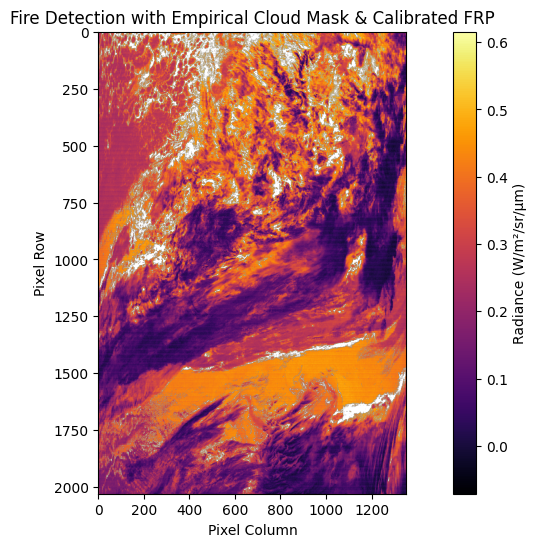

In [ ]:
#============================= Version 1.1.5 ============================================

from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier

# ===================== MODIS Radiance Reader (Improved) =====================

def read_modis_l1b_radiance(file_path, emissive_bands=[], reflective_bands=[]):
    hdf = SD(file_path, SDC.READ)
    data = {}

    # --- Emissive Bands ---
    if emissive_bands:
        emissive_ds = hdf.select('EV_1KM_Emissive')
        emissive_attrs = emissive_ds.attributes()
        emissive_scale = emissive_attrs['radiance_scales']
        emissive_offset = emissive_attrs['radiance_offsets']
        emissive_raw = emissive_ds[:]
        emissive_names = emissive_attrs['band_names'].split(',')
        emissive_map = {name.strip(): i for i, name in enumerate(emissive_names)}

        for band_name in emissive_bands:
            idx = emissive_map[band_name]
            rad = (emissive_raw[idx, :, :] - emissive_offset[idx]) * emissive_scale[idx]
            data[band_name] = rad

    # --- Reflective Bands ---
    if reflective_bands:
        reflective_ds = hdf.select('EV_500_Aggr1km_RefSB')
        reflective_attrs = reflective_ds.attributes()
        reflective_scale = reflective_attrs['radiance_scales']
        reflective_offset = reflective_attrs['radiance_offsets']
        reflective_raw = reflective_ds[:]
        reflective_names = reflective_attrs['band_names'].split(',')
        reflective_map = {name.strip(): i for i, name in enumerate(reflective_names)}

        for band_name in reflective_bands:
            idx = reflective_map[band_name]
            rad = (reflective_raw[idx, :, :] - reflective_offset[idx]) * reflective_scale[idx]
            data[band_name] = rad

    return data



# ===================== MOD35 Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    cloud_mask_dataset = hdf.select('Cloud_Mask')
    cloud_mask_raw = cloud_mask_dataset[:]
    return cloud_mask_raw

def decode_mod35_cloud_mask(mask_array):
    byte1 = mask_array[0, :, :].astype(np.uint8)
    confidence_bits = (byte1 & 0b00000011)
    day_night = (byte1 & 0b00000100) >> 2
    land_water = (byte1 & 0b00111000) >> 3
    snow_ice = (byte1 & 0b01000000) >> 6
    shadow = (byte1 & 0b10000000) >> 7
    return confidence_bits, day_night, land_water, snow_ice, shadow

def apply_cloud_mask_using_ad_tree(band_data, confidence_bits):
    # Flatten and build features
    features = np.stack([confidence_bits.flatten(), band_data.flatten()], axis=1)
    labels = np.isin(confidence_bits.flatten(), [0, 1]).astype(int)

    # Train ADtree
    clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=25)
    clf.fit(features, labels)

    predicted = clf.predict(features).reshape(band_data.shape)
    masked_data = np.where(predicted == 1, band_data, np.nan)
    return masked_data, predicted.astype(np.uint8)

# ===================== MOD03 Geolocation Reader (Improved) =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    latitude = hdf.select('Latitude')[:]
    longitude = hdf.select('Longitude')[:]
    solar_zenith = hdf.select('SolarZenith')[:] / 100.0  # in degrees
    sensor_zenith = hdf.select('SensorZenith')[:] / 100.0  # in degrees
    return latitude, longitude, solar_zenith, sensor_zenith


# ===================== Fire Detection =====================

def estimate_background_radiance(radiance_data, i, j, window_size=11):
    half = window_size // 2
    region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    region = region[~np.isnan(region)]
    if region.size < 5:
        return np.nan
    low_percentile = region[region < np.percentile(region, 50)]
    return np.nanmean(low_percentile) if low_percentile.size > 0 else np.nan

def detect_fire_pixels(band21, band31, band32, band6, zenith, threshold=2.0):
    height, width = band21.shape
    fire_mask = np.zeros_like(band21, dtype=np.uint8)

    for i in range(height):
        for j in range(width):
            if np.any(np.isnan([band21[i,j], band31[i,j], band32[i,j], band6[i,j], zenith[i,j]])):
                continue
            if band32[i,j] < 275:
                continue
            if band6[i,j] < 0.02:
                continue
            if zenith[i,j] > 90 or zenith[i,j] < 30:
                continue

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i,j] - bg21
            temp_contrast = band21[i,j] - band31[i,j]

            if delta > threshold and temp_contrast > 3:
                fire_mask[i,j] = 1

    return fire_mask

def calculate_fire_radiative_power(band21, band31, emissivity=0.95, view_angle_factor=1.0, threshold=2.0):
    frp = (band21 - band31) * 0.5 * emissivity * view_angle_factor
    frp[np.isnan(frp)] = 0
    frp[frp < threshold] = 0
    return frp

def georeference_pixels(latitudes, longitudes, fire_mask):
    fire_coordinates = [
        (latitudes[i, j], longitudes[i, j])
        for i in range(fire_mask.shape[0])
        for j in range(fire_mask.shape[1])
        if fire_mask[i, j] == 1
    ]
    return fire_coordinates

def save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, base_name="fire_detection_output"):
    np.savez_compressed(f"{base_name}.npz",
                        fire_mask=fire_mask,
                        fire_radiative_power=frp,
                        fire_coordinates=np.array(fire_coordinates, dtype='float32'),
                        cloud_mask=cloud_mask_binary)

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

# ===================== Main Workflow =====================

mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"

# bands_to_extract = [0, 10, 11, 5, 14]  # 21, 31, 32, 6, Solar Zenith

# # Load radiance data
# radiance_data = read_modis_l1b_radiance(mod02_file, bands_to_extract)
# band21 = radiance_data[0]
# band31 = radiance_data[10]
# band32 = radiance_data[11]
# band6 = radiance_data[5]
# zenith = radiance_data[14]

emissive_bands = ['21', '31', '32']
reflective_bands = ['6']

radiance_data = read_modis_l1b_radiance(mod02_file, emissive_bands, reflective_bands)
band21 = radiance_data['21']
band31 = radiance_data['31']
band32 = radiance_data['32']
band6 = radiance_data['6']


# Cloud mask processing
cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
confidence_bits, *_ = decode_mod35_cloud_mask(cloud_mask_raw)
band21_masked, cloud_mask_binary = apply_cloud_mask_using_ad_tree(band21, confidence_bits)

# Geolocation
# latitudes, longitudes = read_mod03_geolocation(mod03_file)
latitudes, longitudes, solar_zenith, sensor_zenith = read_mod03_geolocation(mod03_file)

# Fire detection
# Fire detection
fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, solar_zenith)

# Biome-specific FRP (example: emissivity=0.96, view_angle_factor=1.05 for savanna)
frp = calculate_fire_radiative_power(band21_masked, band31, emissivity=0.96, view_angle_factor=1.05)

# Geolocation
fire_coordinates = georeference_pixels(latitudes, longitudes, fire_mask)

# Save and visualize
save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, base_name="final_output")
visualize_fire_classification(fire_mask, radiance_data=band21_masked, title="Fire Detection with Empirical Cloud Mask & Calibrated FRP")


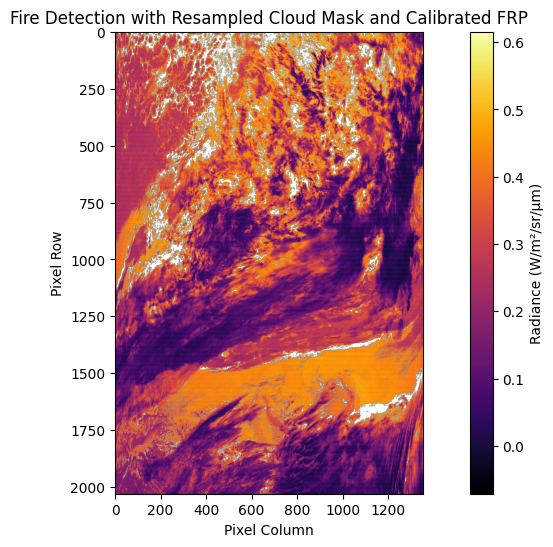

In [ ]:
#============================= Version 1.1.6 ============================================

from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from skimage.transform import resize

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, emissive_bands=[], reflective_bands=[]):
    hdf = SD(file_path, SDC.READ)
    data = {}

    if emissive_bands:
        emissive_ds = hdf.select('EV_1KM_Emissive')
        attrs = emissive_ds.attributes()
        raw = emissive_ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']

        for band in emissive_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    if reflective_bands:
        ref_ds = hdf.select('EV_500_Aggr1km_RefSB')
        attrs = ref_ds.attributes()
        raw = ref_ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']

        for band in reflective_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    return data

# ===================== MOD35 Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    return hdf.select('Cloud_Mask')[:]

def upscale_cloud_mask(mask_array, target_shape):
    byte1 = mask_array[0, :, :].astype(np.uint8)
    resized = resize(byte1, output_shape=target_shape, order=0, preserve_range=True, anti_aliasing=False).astype(np.uint8)
    return resized

def apply_cloud_mask_using_ad_tree(band_data, confidence_bits):
    features = np.stack([confidence_bits.flatten(), band_data.flatten()], axis=1)
    labels = np.isin(confidence_bits.flatten(), [0, 1]).astype(int)
    clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=25)
    clf.fit(features, labels)
    predicted = clf.predict(features).reshape(band_data.shape)
    masked_data = np.where(predicted == 1, band_data, np.nan)
    return masked_data, predicted.astype(np.uint8)

# ===================== MOD03 Geolocation =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    lat = hdf.select('Latitude')[:]
    lon = hdf.select('Longitude')[:]
    solar_zenith = hdf.select('SolarZenith')[:] / 100.0
    sensor_zenith = hdf.select('SensorZenith')[:] / 100.0
    return lat, lon, solar_zenith, sensor_zenith

# ===================== Fire Detection =====================

def estimate_background_radiance(radiance_data, i, j, window_size=11):
    half = window_size // 2
    region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    region = region[~np.isnan(region)]
    if region.size < 5:
        return np.nan
    low_percentile = region[region < np.percentile(region, 50)]
    return np.nanmean(low_percentile) if low_percentile.size > 0 else np.nan

def detect_fire_pixels(band21, band31, band32, band6, solar_zenith, threshold=2.0):
    height, width = band21.shape
    fire_mask = np.zeros_like(band21, dtype=np.uint8)

    for i in range(height):
        for j in range(width):
            if np.any(np.isnan([band21[i,j], band31[i,j], band32[i,j], band6[i,j], solar_zenith[i,j]])):
                continue
            if band32[i,j] < 275 or band6[i,j] < 0.02 or not (30 <= solar_zenith[i,j] <= 90):
                continue
            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue
            delta = band21[i,j] - bg21
            contrast = band21[i,j] - band31[i,j]
            if delta > threshold and contrast > 3:
                fire_mask[i,j] = 1
    return fire_mask

# ===================== FRP Calculation with Brightness Temperature =====================

def radiance_to_brightness_temp(radiance, wavelength_um):
    # Planck inverse function constants
    c1 = 1.191042e8  # W*um^4/m^2/sr
    c2 = 1.4387752e4  # um*K
    wavelength = wavelength_um
    radiance = np.where(radiance <= 0, np.nan, radiance)
    return c2 * wavelength / np.log((c1 / (radiance * wavelength**5)) + 1)

def calculate_fire_radiative_power(band21_rad, band31_rad, sensor_zenith, emissivity=0.95, threshold=2.0):
    tb21 = radiance_to_brightness_temp(band21_rad, 3.96)
    tb31 = radiance_to_brightness_temp(band31_rad, 11.03)
    delta_tb = tb21 - tb31

    # Band 21 saturation threshold (approx. 331 K)
    saturated = tb21 >= 331
    delta_tb[saturated] = np.nan  # Optionally, set to NaN or log for diagnostics

    # View angle correction
    view_angle_factor = 1 / np.cos(np.deg2rad(sensor_zenith))
    view_angle_factor = np.clip(view_angle_factor, 1.0, 2.5)  # Avoid extreme correction at edge

    frp = 4.34 * delta_tb * emissivity * view_angle_factor
    frp[np.isnan(frp) | (frp < threshold)] = 0
    return frp


# ===================== Geolocation & Output =====================

def georeference_pixels(latitudes, longitudes, fire_mask):
    return [(latitudes[i, j], longitudes[i, j]) for i in range(fire_mask.shape[0])
            for j in range(fire_mask.shape[1]) if fire_mask[i, j] == 1]

def save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, base_name="fire_detection_output"):
    np.savez_compressed(f"{base_name}.npz",
                        fire_mask=fire_mask,
                        fire_radiative_power=frp,
                        fire_coordinates=np.array(fire_coordinates, dtype='float32'),
                        cloud_mask=cloud_mask_binary)

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

# ===================== Main Workflow =====================

mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"

emissive_bands = ['21', '31', '32']
reflective_bands = ['6']

# Load radiance data
radiance_data = read_modis_l1b_radiance(mod02_file, emissive_bands, reflective_bands)
band21 = radiance_data['21']
band31 = radiance_data['31']
band32 = radiance_data['32']
band6 = radiance_data['6']

# Load geolocation and zenith angles
latitudes, longitudes, solar_zenith, sensor_zenith = read_mod03_geolocation(mod03_file)

# Cloud mask
cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
cloud_mask_resized = upscale_cloud_mask(cloud_mask_raw, band21.shape)
confidence_bits = (cloud_mask_resized & 0b00000011)
band21_masked, cloud_mask_binary = apply_cloud_mask_using_ad_tree(band21, confidence_bits)

# Fire detection
fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, solar_zenith)

# FRP calculation
frp = calculate_fire_radiative_power(band21_masked, band31, sensor_zenith, emissivity=0.96, threshold=2.0)

# Fire location
fire_coords = georeference_pixels(latitudes, longitudes, fire_mask)

# Save + visualize
save_fire_detection_result_numpy(fire_mask, frp, fire_coords, cloud_mask_binary, base_name="final_output")
visualize_fire_classification(fire_mask, radiance_data=band21_masked, title="Fire Detection with Resampled Cloud Mask and Calibrated FRP")


Reading radiance data...
Reading geolocation data...
Reading and processing cloud mask...
Detecting fire pixels...
Calculating Fire Radiative Power (FRP)...
Georeferencing fire pixels...
Saving output to final_output.h5 ...
Visualizing results...


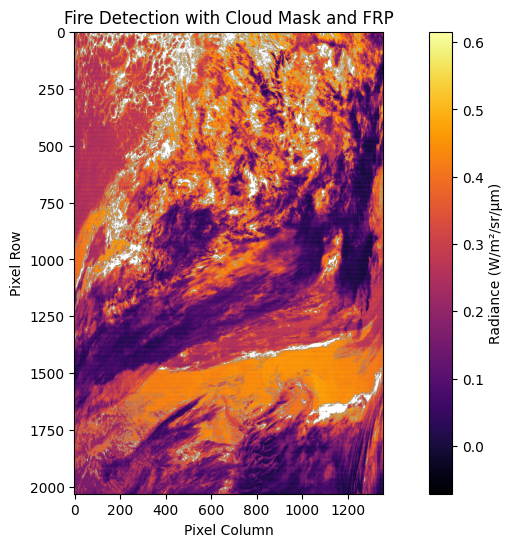

✅ Processing complete.


In [ ]:
#============================= Version 1.1.7 ============================================


from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from skimage.transform import resize
import h5py
import os

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, emissive_bands=[], reflective_bands=[]):
    hdf = SD(file_path, SDC.READ)
    data = {}

    if emissive_bands:
        emissive_ds = hdf.select('EV_1KM_Emissive')
        attrs = emissive_ds.attributes()
        raw = emissive_ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']

        for band in emissive_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    if reflective_bands:
        ref_ds = hdf.select('EV_500_Aggr1km_RefSB')
        attrs = ref_ds.attributes()
        raw = ref_ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']

        for band in reflective_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    return data

# ===================== Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    return hdf.select('Cloud_Mask')[:]

def upscale_cloud_mask(mask_array, target_shape):
    byte1 = mask_array[0, :, :].astype(np.uint8)
    resized = resize(byte1, output_shape=target_shape, order=0, preserve_range=True, anti_aliasing=False).astype(np.uint8)
    return resized

def apply_cloud_mask_using_ad_tree(band_data, confidence_bits):
    features = np.stack([confidence_bits.flatten(), band_data.flatten()], axis=1)
    labels = np.isin(confidence_bits.flatten(), [0, 1]).astype(int)
    clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=25)
    clf.fit(features, labels)
    predicted = clf.predict(features).reshape(band_data.shape)
    masked_data = np.where(predicted == 1, band_data, np.nan)
    return masked_data, predicted.astype(np.uint8)

# ===================== MOD03 Geolocation =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    lat = hdf.select('Latitude')[:]
    lon = hdf.select('Longitude')[:]
    solar_zenith = hdf.select('SolarZenith')[:] / 100.0
    sensor_zenith = hdf.select('SensorZenith')[:] / 100.0
    return lat, lon, solar_zenith, sensor_zenith

# ===================== Fire Detection =====================

def estimate_background_radiance(radiance_data, i, j, window_size=11):
    half = window_size // 2
    region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    region = region[~np.isnan(region)]
    if region.size < 5:
        return np.nan
    low_percentile = region[region < np.percentile(region, 50)]
    return np.nanmean(low_percentile) if low_percentile.size > 0 else np.nan

def detect_fire_pixels(band21, band31, band32, band6, solar_zenith, threshold=2.0):
    height, width = band21.shape
    fire_mask = np.zeros_like(band21, dtype=np.uint8)

    for i in range(height):
        for j in range(width):
            if np.any(np.isnan([band21[i,j], band31[i,j], band32[i,j], band6[i,j], solar_zenith[i,j]])):
                continue
            if band32[i,j] < 275 or band6[i,j] < 0.02 or not (30 <= solar_zenith[i,j] <= 90):
                continue
            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue
            delta = band21[i,j] - bg21
            contrast = band21[i,j] - band31[i,j]
            if delta > threshold and contrast > 3:
                fire_mask[i,j] = 1
    return fire_mask

# ===================== FRP Calculation =====================

def radiance_to_brightness_temp(radiance, wavelength_um):
    c1 = 1.191042e8  # W*um^4/m^2/sr
    c2 = 1.4387752e4  # um*K
    wavelength = wavelength_um
    radiance = np.where(radiance <= 0, np.nan, radiance)
    return c2 * wavelength / np.log((c1 / (radiance * wavelength**5)) + 1)

def calculate_fire_radiative_power(band21_rad, band31_rad, sensor_zenith, emissivity=0.95, threshold=2.0):
    tb21 = radiance_to_brightness_temp(band21_rad, 3.96)
    tb31 = radiance_to_brightness_temp(band31_rad, 11.03)
    delta_tb = tb21 - tb31

    saturated = tb21 >= 331
    delta_tb[saturated] = np.nan  # Exclude saturated

    view_angle_factor = 1 / np.cos(np.deg2rad(sensor_zenith))
    view_angle_factor = np.clip(view_angle_factor, 1.0, 2.5)

    frp = 4.34 * delta_tb * emissivity * view_angle_factor
    frp[np.isnan(frp) | (frp < threshold)] = 0
    return frp

# ===================== Geolocation & Output =====================

def georeference_pixels(latitudes, longitudes, fire_mask):
    return [(latitudes[i, j], longitudes[i, j]) for i in range(fire_mask.shape[0])
            for j in range(fire_mask.shape[1]) if fire_mask[i, j] == 1]

def save_fire_detection_result_hdf5(fire_mask, frp, fire_coordinates, cloud_mask_binary, base_name="fire_detection_output"):
    with h5py.File(f"{base_name}.h5", "w") as f:
        f.create_dataset("fire_mask", data=fire_mask, compression="gzip")
        f.create_dataset("FRP", data=frp, compression="gzip")
        f.create_dataset("cloud_mask_binary", data=cloud_mask_binary, compression="gzip")
        coords_array = np.array(fire_coordinates, dtype='float32')
        f.create_dataset("fire_coordinates", data=coords_array, compression="gzip")

# ===================== Visualization =====================

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

# ===================== Main Workflow =====================

def run_fire_detection_pipeline(mod02_file, mod35_file, mod03_file, output_base="fire_detection_output"):
    emissive_bands = ['21', '31', '32']
    reflective_bands = ['6']

    # Step 1: Load Radiance Data
    print("Reading radiance data...")
    radiance_data = read_modis_l1b_radiance(mod02_file, emissive_bands, reflective_bands)
    band21 = radiance_data['21']
    band31 = radiance_data['31']
    band32 = radiance_data['32']
    band6 = radiance_data['6']

    # Step 2: Load Geolocation
    print("Reading geolocation data...")
    latitudes, longitudes, solar_zenith, sensor_zenith = read_mod03_geolocation(mod03_file)

    # Step 3: Cloud Mask Processing
    print("Reading and processing cloud mask...")
    cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
    cloud_mask_resized = upscale_cloud_mask(cloud_mask_raw, band21.shape)
    confidence_bits = (cloud_mask_resized & 0b00000011)
    band21_masked, cloud_mask_binary = apply_cloud_mask_using_ad_tree(band21, confidence_bits)

    # Step 4: Fire Detection
    print("Detecting fire pixels...")
    fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, solar_zenith)

    # Step 5: FRP Calculation
    print("Calculating Fire Radiative Power (FRP)...")
    frp = calculate_fire_radiative_power(band21_masked, band31, sensor_zenith, emissivity=0.96, threshold=2.0)

    # Step 6: Geolocate Fire Pixels
    print("Georeferencing fire pixels...")
    fire_coords = georeference_pixels(latitudes, longitudes, fire_mask)

    # Step 7: Save Results
    print(f"Saving output to {output_base}.h5 ...")
    save_fire_detection_result_hdf5(fire_mask, frp, fire_coords, cloud_mask_binary, base_name=output_base)

    # Step 8: Visualization
    print("Visualizing results...")
    visualize_fire_classification(fire_mask, radiance_data=band21_masked,
                                  title="Fire Detection with Cloud Mask and FRP")

    print("✅ Processing complete.")


# Example usage
if __name__ == "__main__":
    mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
    mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
    mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"
    run_fire_detection_pipeline(mod02_file, mod35_file, mod03_file, output_base="final_output")


Reading radiance data...
Reading geolocation data...
Reading and processing cloud mask...
Detecting fire pixels...
Calculating Fire Radiative Power (FRP)...
Georeferencing fire pixels...
Saving output to final_output.h5 ...
Visualizing results...


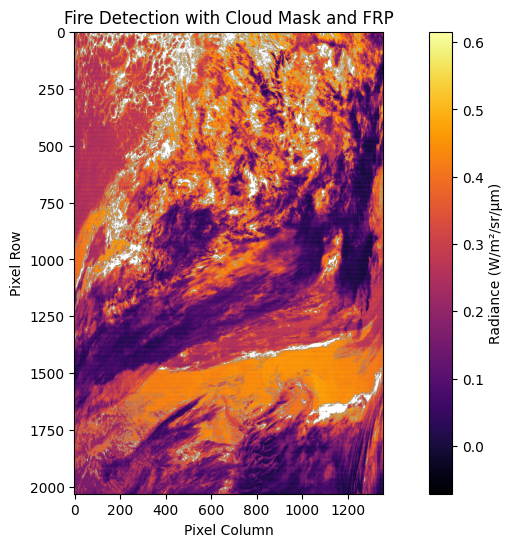

✅ Processing complete.


In [ ]:
#============================= Version 1.1.8 ============================================


from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from skimage.transform import resize
import h5py
import os

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, emissive_bands=[], reflective_bands=[]):
    hdf = SD(file_path, SDC.READ)
    data = {}

    if emissive_bands:
        emissive_ds = hdf.select('EV_1KM_Emissive')
        attrs = emissive_ds.attributes()
        raw = emissive_ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']

        for band in emissive_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    if reflective_bands:
        ref_ds = hdf.select('EV_500_Aggr1km_RefSB')
        attrs = ref_ds.attributes()
        raw = ref_ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']

        for band in reflective_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    return data

# ===================== Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    return hdf.select('Cloud_Mask')[:]

def upscale_cloud_mask(mask_array, target_shape):
    byte1 = mask_array[0, :, :].astype(np.uint8)
    resized = resize(byte1, output_shape=target_shape, order=0, preserve_range=True, anti_aliasing=False).astype(np.uint8)
    return resized

def apply_cloud_mask_using_ad_tree(band_data, confidence_bits):
    features = np.stack([confidence_bits.flatten(), band_data.flatten()], axis=1)
    labels = np.isin(confidence_bits.flatten(), [0, 1]).astype(int)
    clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=25)
    clf.fit(features, labels)
    predicted = clf.predict(features).reshape(band_data.shape)
    masked_data = np.where(predicted == 1, band_data, np.nan)
    return masked_data, predicted.astype(np.uint8)

# ===================== MOD03 Geolocation =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    lat = hdf.select('Latitude')[:]
    lon = hdf.select('Longitude')[:]
    solar_zenith = hdf.select('SolarZenith')[:] / 100.0
    sensor_zenith = hdf.select('SensorZenith')[:] / 100.0
    return lat, lon, solar_zenith, sensor_zenith

# ===================== Fire Detection =====================

def estimate_background_radiance(radiance_data, i, j, window_size=11):
    half = window_size // 2
    region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    region = region[~np.isnan(region)]
    if region.size < 5:
        return np.nan
    low_percentile = region[region < np.percentile(region, 50)]
    return np.nanmean(low_percentile) if low_percentile.size > 0 else np.nan

def detect_fire_pixels_with_confidence(band21, band31, band32, band6, solar_zenith, threshold=2.0):
    height, width = band21.shape
    fire_confidence = np.zeros_like(band21, dtype=np.uint8)

    for i in range(height):
        for j in range(width):
            if np.any(np.isnan([band21[i,j], band31[i,j], band32[i,j], band6[i,j], solar_zenith[i,j]])):
                continue
            if band32[i,j] < 275 or band6[i,j] < 0.02 or not (30 <= solar_zenith[i,j] <= 90):
                continue

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i,j] - bg21
            contrast = band21[i,j] - band31[i,j]

            # Classify based on thresholds
            if delta > 10 and contrast > 7:
                fire_confidence[i,j] = 3  # High
            elif delta > 5 and contrast > 5:
                fire_confidence[i,j] = 2  # Nominal
            elif delta > threshold and contrast > 3:
                fire_confidence[i,j] = 1  # Low

    return fire_confidence


# ===================== FRP Calculation =====================

def radiance_to_brightness_temp(radiance, wavelength_um):
    c1 = 1.191042e8  # W*um^4/m^2/sr
    c2 = 1.4387752e4  # um*K
    wavelength = wavelength_um
    radiance = np.where(radiance <= 0, np.nan, radiance)
    return c2 * wavelength / np.log((c1 / (radiance * wavelength**5)) + 1)

def calculate_fire_radiative_power(band21_rad, band31_rad, sensor_zenith, emissivity=0.95, threshold=2.0):
    tb21 = radiance_to_brightness_temp(band21_rad, 3.96)
    tb31 = radiance_to_brightness_temp(band31_rad, 11.03)
    delta_tb = tb21 - tb31

    saturated = tb21 >= 331
    delta_tb[saturated] = np.nan  # Exclude saturated

    view_angle_factor = 1 / np.cos(np.deg2rad(sensor_zenith))
    view_angle_factor = np.clip(view_angle_factor, 1.0, 2.5)

    frp = 4.34 * delta_tb * emissivity * view_angle_factor
    frp[np.isnan(frp) | (frp < threshold)] = 0
    return frp

# ===================== Geolocation & Output =====================

def georeference_pixels(latitudes, longitudes, fire_mask):
    return [(latitudes[i, j], longitudes[i, j]) for i in range(fire_mask.shape[0])
            for j in range(fire_mask.shape[1]) if fire_mask[i, j] == 1]

def save_fire_detection_result_hdf5(fire_mask, frp, fire_coordinates, cloud_mask_binary, base_name="fire_detection_output"):
    with h5py.File(f"{base_name}.h5", "w") as f:
        f.create_dataset("fire_mask", data=fire_mask, compression="gzip")
        f.create_dataset("FRP", data=frp, compression="gzip")
        f.create_dataset("cloud_mask_binary", data=cloud_mask_binary, compression="gzip")
        coords_array = np.array(fire_coordinates, dtype='float32')
        f.create_dataset("fire_coordinates", data=coords_array, compression="gzip")

# ===================== Visualization =====================

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

# ===================== Main Workflow =====================

def run_fire_detection_pipeline(mod02_file, mod35_file, mod03_file, output_base="fire_detection_output"):
    emissive_bands = ['21', '31', '32']
    reflective_bands = ['6']

    # Step 1: Load Radiance Data
    print("Reading radiance data...")
    radiance_data = read_modis_l1b_radiance(mod02_file, emissive_bands, reflective_bands)
    band21 = radiance_data['21']
    band31 = radiance_data['31']
    band32 = radiance_data['32']
    band6 = radiance_data['6']

    # Step 2: Load Geolocation
    print("Reading geolocation data...")
    latitudes, longitudes, solar_zenith, sensor_zenith = read_mod03_geolocation(mod03_file)

    # Step 3: Cloud Mask Processing
    print("Reading and processing cloud mask...")
    cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
    cloud_mask_resized = upscale_cloud_mask(cloud_mask_raw, band21.shape)
    confidence_bits = (cloud_mask_resized & 0b00000011)
    band21_masked, cloud_mask_binary = apply_cloud_mask_using_ad_tree(band21, confidence_bits)

    # Step 4: Fire Detection
    print("Detecting fire pixels...")
    # fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, solar_zenith)
    fire_confidence = detect_fire_pixels_with_confidence(band21_masked, band31, band32, band6, solar_zenith)
    fire_mask = (fire_confidence > 0).astype(np.uint8)  # binary fire mask for FRP and geolocation


    # Step 5: FRP Calculation
    print("Calculating Fire Radiative Power (FRP)...")
    frp = calculate_fire_radiative_power(band21_masked, band31, sensor_zenith, emissivity=0.96, threshold=2.0)

    # Step 6: Geolocate Fire Pixels
    print("Georeferencing fire pixels...")
    fire_coords = georeference_pixels(latitudes, longitudes, fire_mask)

    # Step 7: Save Results
    print(f"Saving output to {output_base}.h5 ...")
    save_fire_detection_result_hdf5(fire_mask, frp, fire_coords, cloud_mask_binary, base_name=output_base)

    # Step 8: Visualization
    print("Visualizing results...")
    visualize_fire_classification(fire_mask, radiance_data=band21_masked,
                                  title="Fire Detection with Cloud Mask and FRP")

    print("✅ Processing complete.")


# Example usage
if __name__ == "__main__":
    mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
    mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
    mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"
    run_fire_detection_pipeline(mod02_file, mod35_file, mod03_file, output_base="final_output")


In [ ]:
from geopy.distance import geodesic

def detect_fire_pixels_with_confidence_and_flags(band21, band31, band32, band6, solar_zenith, threshold=2.0):
    height, width = band21.shape
    fire_confidence = np.zeros_like(band21, dtype=np.uint8)
    saturation_flag = np.zeros_like(band21, dtype=np.uint8)
    day_mask = (solar_zenith < 85)  # Consider solar zenith < 85° as day

    for i in range(height):
        for j in range(width):
            if np.any(np.isnan([band21[i,j], band31[i,j], band32[i,j], band6[i,j], solar_zenith[i,j]])):
                continue

            if not day_mask[i,j]:  # Nighttime — you can skip or create alternate logic
                continue

            if band32[i,j] < 275 or band6[i,j] < 0.02:
                continue

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i,j] - bg21
            contrast = band21[i,j] - band31[i,j]

            if band21[i,j] > 20:  # Approx. radiance value near 331 K (saturation)
                saturation_flag[i,j] = 1

            if delta > 10 and contrast > 7:
                fire_confidence[i,j] = 3  # High
            elif delta > 5 and contrast > 5:
                fire_confidence[i,j] = 2  # Nominal
            elif delta > threshold and contrast > 3:
                fire_confidence[i,j] = 1  # Low

    fire_mask = (fire_confidence > 0).astype(np.uint8)
    return fire_confidence, fire_mask, saturation_flag

def compare_with_ground_truth(fire_coords, ground_truth_points, max_distance_km=1.0):
    """
    Compare detected fire coordinates with ground truth fire points (e.g., FIRMS).
    Returns match rate (fraction of detected fires that match ground truth).
    """
    matches = 0
    for fc in fire_coords:
        for gt in ground_truth_points:
            if geodesic(fc, gt).km <= max_distance_km:
                matches += 1
                break
    return matches / len(fire_coords) if fire_coords else 0.0


Reading radiance data...
Reading geolocation data...
Reading and processing cloud mask...
Detecting fire pixels...
Calculating Fire Radiative Power (FRP)...
Georeferencing fire pixels...
Saving output to final_output.h5 ...
Visualizing results...


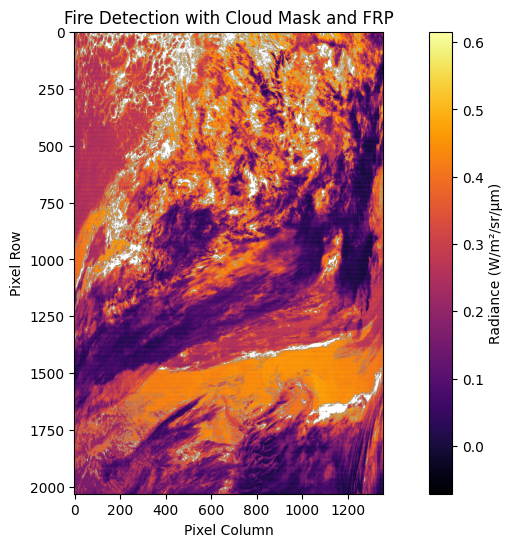

✅ Processing complete.


In [ ]:
#============================= Version 1.1.9 ============================================


from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from skimage.transform import resize
import h5py
import os

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, emissive_bands=[], reflective_bands=[]):
    hdf = SD(file_path, SDC.READ)
    data = {}

    if emissive_bands:
        emissive_ds = hdf.select('EV_1KM_Emissive')
        attrs = emissive_ds.attributes()
        raw = emissive_ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']

        for band in emissive_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    if reflective_bands:
        ref_ds = hdf.select('EV_500_Aggr1km_RefSB')
        attrs = ref_ds.attributes()
        raw = ref_ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']

        for band in reflective_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    return data

# ===================== Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    return hdf.select('Cloud_Mask')[:]

def upscale_cloud_mask(mask_array, target_shape):
    byte1 = mask_array[0, :, :].astype(np.uint8)
    resized = resize(byte1, output_shape=target_shape, order=0, preserve_range=True, anti_aliasing=False).astype(np.uint8)
    return resized

def apply_cloud_mask_using_ad_tree(band_data, confidence_bits):
    features = np.stack([confidence_bits.flatten(), band_data.flatten()], axis=1)
    labels = np.isin(confidence_bits.flatten(), [0, 1]).astype(int)
    clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=25)
    clf.fit(features, labels)
    predicted = clf.predict(features).reshape(band_data.shape)
    masked_data = np.where(predicted == 1, band_data, np.nan)
    return masked_data, predicted.astype(np.uint8)

# ===================== MOD03 Geolocation =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    lat = hdf.select('Latitude')[:]
    lon = hdf.select('Longitude')[:]
    solar_zenith = hdf.select('SolarZenith')[:] / 100.0
    sensor_zenith = hdf.select('SensorZenith')[:] / 100.0
    return lat, lon, solar_zenith, sensor_zenith

# ===================== Fire Detection =====================

def estimate_background_radiance(radiance_data, i, j, window_size=11):
    half = window_size // 2
    region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    region = region[~np.isnan(region)]
    if region.size < 5:
        return np.nan
    low_percentile = region[region < np.percentile(region, 50)]
    return np.nanmean(low_percentile) if low_percentile.size > 0 else np.nan

def detect_fire_pixels_with_confidence_and_flags(band21, band31, band32, band6, solar_zenith, threshold=2.0):
    height, width = band21.shape
    fire_confidence = np.zeros_like(band21, dtype=np.uint8)
    saturation_flag = np.zeros_like(band21, dtype=np.uint8)
    day_mask = (solar_zenith < 85)  # Consider solar zenith < 85° as day

    for i in range(height):
        for j in range(width):
            if np.any(np.isnan([band21[i,j], band31[i,j], band32[i,j], band6[i,j], solar_zenith[i,j]])):
                continue

            if not day_mask[i,j]:  # Nighttime — you can skip or create alternate logic
                continue

            if band32[i,j] < 275 or band6[i,j] < 0.02:
                continue

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i,j] - bg21
            contrast = band21[i,j] - band31[i,j]

            if band21[i,j] > 20:  # Approx. radiance value near 331 K (saturation)
                saturation_flag[i,j] = 1

            if delta > 10 and contrast > 7:
                fire_confidence[i,j] = 3  # High
            elif delta > 5 and contrast > 5:
                fire_confidence[i,j] = 2  # Nominal
            elif delta > threshold and contrast > 3:
                fire_confidence[i,j] = 1  # Low

    fire_mask = (fire_confidence > 0).astype(np.uint8)
    return fire_confidence, fire_mask, saturation_flag


# ===================== FRP Calculation =====================

def radiance_to_brightness_temp(radiance, wavelength_um):
    c1 = 1.191042e8  # W*um^4/m^2/sr
    c2 = 1.4387752e4  # um*K
    wavelength = wavelength_um
    radiance = np.where(radiance <= 0, np.nan, radiance)
    return c2 * wavelength / np.log((c1 / (radiance * wavelength**5)) + 1)

def calculate_fire_radiative_power(band21_rad, band31_rad, sensor_zenith, emissivity=0.95, threshold=2.0):
    tb21 = radiance_to_brightness_temp(band21_rad, 3.96)
    tb31 = radiance_to_brightness_temp(band31_rad, 11.03)
    delta_tb = tb21 - tb31

    saturated = tb21 >= 331
    delta_tb[saturated] = np.nan  # Exclude saturated

    view_angle_factor = 1 / np.cos(np.deg2rad(sensor_zenith))
    view_angle_factor = np.clip(view_angle_factor, 1.0, 2.5)

    frp = 4.34 * delta_tb * emissivity * view_angle_factor
    frp[np.isnan(frp) | (frp < threshold)] = 0
    return frp

# ===================== Geolocation & Output =====================

def georeference_pixels(latitudes, longitudes, fire_mask):
    return [(latitudes[i, j], longitudes[i, j]) for i in range(fire_mask.shape[0])
            for j in range(fire_mask.shape[1]) if fire_mask[i, j] == 1]

def save_fire_detection_result_hdf5(fire_mask, frp, fire_coordinates, cloud_mask_binary, fire_confidence, base_name="fire_detection_output"):
    with h5py.File(f"{base_name}.h5", "w") as f:
        f.create_dataset("fire_mask", data=fire_mask, compression="gzip")
        f.create_dataset("FRP", data=frp, compression="gzip")
        f.create_dataset("cloud_mask_binary", data=cloud_mask_binary, compression="gzip")
        f.create_dataset("fire_confidence", data=fire_confidence, compression="gzip")
        coords_array = np.array(fire_coordinates, dtype='float32')
        f.create_dataset("fire_coordinates", data=coords_array, compression="gzip")


# ===================== Visualization =====================

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

def visualize_confidence_map(confidence_map, title="Fire Confidence Map"):
    plt.figure(figsize=(10, 6))
    cmap = plt.cm.get_cmap("YlOrRd", 4)
    plt.imshow(confidence_map, cmap=cmap, vmin=0, vmax=3)
    plt.colorbar(ticks=[0, 1, 2, 3], label="Confidence Level")
    plt.title(title)
    plt.xlabel("Pixel Column")
    plt.ylabel("Pixel Row")
    plt.show()


# ===================== Main Workflow =====================

def run_fire_detection_pipeline(mod02_file, mod35_file, mod03_file, output_base="fire_detection_output"):
    emissive_bands = ['21', '31', '32']
    reflective_bands = ['6']

    # Step 1: Load Radiance Data
    print("Reading radiance data...")
    radiance_data = read_modis_l1b_radiance(mod02_file, emissive_bands, reflective_bands)
    band21 = radiance_data['21']
    band31 = radiance_data['31']
    band32 = radiance_data['32']
    band6 = radiance_data['6']

    # Step 2: Load Geolocation
    print("Reading geolocation data...")
    latitudes, longitudes, solar_zenith, sensor_zenith = read_mod03_geolocation(mod03_file)

    # Step 3: Cloud Mask Processing
    print("Reading and processing cloud mask...")
    cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
    cloud_mask_resized = upscale_cloud_mask(cloud_mask_raw, band21.shape)
    confidence_bits = (cloud_mask_resized & 0b00000011)
    band21_masked, cloud_mask_binary = apply_cloud_mask_using_ad_tree(band21, confidence_bits)

    # Step 4: Fire Detection
    print("Detecting fire pixels...")
    # fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, solar_zenith)
    fire_confidence, fire_mask, saturation_flag = detect_fire_pixels_with_confidence_and_flags(
        band21_masked, band31, band32, band6, solar_zenith
    )

    fire_mask = (fire_confidence > 0).astype(np.uint8)  # binary fire mask for FRP and geolocation


    # Step 5: FRP Calculation
    print("Calculating Fire Radiative Power (FRP)...")
    frp = calculate_fire_radiative_power(band21_masked, band31, sensor_zenith, emissivity=0.96, threshold=2.0)

    # Step 6: Geolocate Fire Pixels
    print("Georeferencing fire pixels...")
    fire_coords = georeference_pixels(latitudes, longitudes, fire_mask)

    # Step 7: Save Results
    print(f"Saving output to {output_base}.h5 ...")
    save_fire_detection_result_hdf5(fire_mask, frp, fire_coords, cloud_mask_binary, fire_confidence, base_name=output_base)

    # Step 8: Visualization
    print("Visualizing results...")
    visualize_fire_classification(fire_mask, radiance_data=band21_masked,
                                  title="Fire Detection with Cloud Mask and FRP")

    print("✅ Processing complete.")


# Example usage
if __name__ == "__main__":
    mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
    mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
    mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"
    run_fire_detection_pipeline(mod02_file, mod35_file, mod03_file, output_base="final_output")


Reading radiance data...
Reading geolocation data...
Reading and processing cloud mask...
Detecting fire pixels...
Calculating Fire Radiative Power (FRP)...
Georeferencing fire pixels...
Saving output to final_output.h5 ...
Visualizing results...


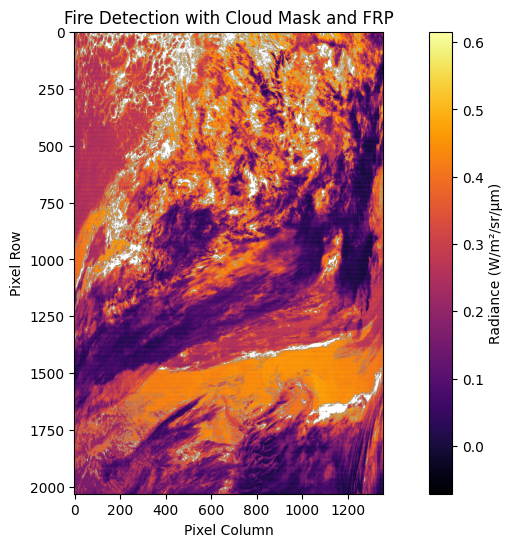

✅ Processing complete.


In [ ]:
#============================= Version 1.1.10 ============================================


from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from skimage.transform import resize
import h5py
import os

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, emissive_bands=[], reflective_bands=[]):
    hdf = SD(file_path, SDC.READ)
    data = {}

    if emissive_bands:
        emissive_ds = hdf.select('EV_1KM_Emissive')
        attrs = emissive_ds.attributes()
        raw = emissive_ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']

        for band in emissive_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    if reflective_bands:
        ref_ds = hdf.select('EV_500_Aggr1km_RefSB')
        attrs = ref_ds.attributes()
        raw = ref_ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']

        for band in reflective_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    return data

# ===================== Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    return hdf.select('Cloud_Mask')[:]

def upscale_cloud_mask(mask_array, target_shape):
    byte1 = mask_array[0, :, :].astype(np.uint8)
    resized = resize(byte1, output_shape=target_shape, order=0, preserve_range=True, anti_aliasing=False).astype(np.uint8)
    return resized

def apply_cloud_mask_using_ad_tree(band_data, confidence_bits):
    features = np.stack([confidence_bits.flatten(), band_data.flatten()], axis=1)
    labels = np.isin(confidence_bits.flatten(), [0, 1]).astype(int)
    clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=25)
    clf.fit(features, labels)
    predicted = clf.predict(features).reshape(band_data.shape)
    masked_data = np.where(predicted == 1, band_data, np.nan)
    return masked_data, predicted.astype(np.uint8)

# ===================== MOD03 Geolocation =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    lat = hdf.select('Latitude')[:]
    lon = hdf.select('Longitude')[:]
    solar_zenith = hdf.select('SolarZenith')[:] / 100.0
    sensor_zenith = hdf.select('SensorZenith')[:] / 100.0
    return lat, lon, solar_zenith, sensor_zenith

# ===================== Fire Detection =====================

def estimate_background_radiance(radiance_data, i, j, window_size=11):
    half = window_size // 2
    region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    region = region[~np.isnan(region)]
    if region.size < 5:
        return np.nan
    low_percentile = region[region < np.percentile(region, 50)]
    return np.nanmean(low_percentile) if low_percentile.size > 0 else np.nan

def detect_fire_pixels_with_confidence_and_flags(band21, band31, band32, band6, solar_zenith, qa_flags, threshold=2.0):
    height, width = band21.shape
    fire_confidence = np.zeros_like(band21, dtype=np.uint8)
    saturation_flag = np.zeros_like(band21, dtype=np.uint8)
    day_mask = (solar_zenith < 85)  # Consider solar zenith < 85° as day

    for i in range(height):
        for j in range(width):
            if np.any(np.isnan([band21[i,j], band31[i,j], band32[i,j], band6[i,j], solar_zenith[i,j]])):
                continue

            if not day_mask[i,j]:  # Nighttime — you can skip or create alternate logic
                continue

            if band32[i,j] < 275 or band6[i,j] < 0.02:
                continue

            # Check QA flag for fire type or land classification
            if (qa_flags[i,j] & 0x01) == 0:  # If the fire type QA bit is not set
                continue

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i,j] - bg21
            contrast = band21[i,j] - band31[i,j]

            if band21[i,j] > 20:  # Approx. radiance value near 331 K (saturation)
                saturation_flag[i,j] = 1

            if delta > 10 and contrast > 7:
                fire_confidence[i,j] = 3  # High
            elif delta > 5 and contrast > 5:
                fire_confidence[i,j] = 2  # Nominal
            elif delta > threshold and contrast > 3:
                fire_confidence[i,j] = 1  # Low

    fire_mask = (fire_confidence > 0).astype(np.uint8)
    return fire_confidence, fire_mask, saturation_flag

# ===================== FRP Calculation =====================

def radiance_to_brightness_temp(radiance, wavelength_um):
    c1 = 1.191042e8  # W*um^4/m^2/sr
    c2 = 1.4387752e4  # um*K
    wavelength = wavelength_um
    radiance = np.where(radiance <= 0, np.nan, radiance)
    return c2 * wavelength / np.log((c1 / (radiance * wavelength**5)) + 1)

def calculate_fire_radiative_power(band21_rad, band31_rad, sensor_zenith, emissivity=0.95, threshold=2.0):
    tb21 = radiance_to_brightness_temp(band21_rad, 3.96)
    tb31 = radiance_to_brightness_temp(band31_rad, 11.03)
    delta_tb = tb21 - tb31

    saturated = tb21 >= 331
    delta_tb[saturated] = np.nan  # Exclude saturated

    view_angle_factor = 1 / np.cos(np.deg2rad(sensor_zenith))
    view_angle_factor = np.clip(view_angle_factor, 1.0, 2.5)

    frp = 4.34 * delta_tb * emissivity * view_angle_factor
    frp[np.isnan(frp) | (frp < threshold)] = 0
    return frp

# ===================== Geolocation & Output =====================

def georeference_pixels(latitudes, longitudes, fire_mask):
    return [(latitudes[i, j], longitudes[i, j]) for i in range(fire_mask.shape[0])
            for j in range(fire_mask.shape[1]) if fire_mask[i, j] == 1]

def save_fire_detection_result_hdf5(fire_mask, frp, fire_coordinates, cloud_mask_binary, fire_confidence, base_name="fire_detection_output"):
    with h5py.File(f"{base_name}.h5", "w") as f:
        f.create_dataset("fire_mask", data=fire_mask, compression="gzip")
        f.create_dataset("FRP", data=frp, compression="gzip")
        f.create_dataset("cloud_mask_binary", data=cloud_mask_binary, compression="gzip")
        f.create_dataset("fire_confidence", data=fire_confidence, compression="gzip")
        coords_array = np.array(fire_coordinates, dtype='float32')
        f.create_dataset("fire_coordinates", data=coords_array, compression="gzip")

# ===================== Visualization =====================

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

def visualize_confidence_map(confidence_map, title="Fire Confidence Map"):
    plt.figure(figsize=(10, 6))
    cmap = plt.cm.get_cmap("YlOrRd", 4)
    plt.imshow(confidence_map, cmap=cmap, vmin=0, vmax=3)
    plt.colorbar(ticks=[0, 1, 2, 3], label="Confidence Level")
    plt.title(title)
    plt.xlabel("Pixel Column")
    plt.ylabel("Pixel Row")
    plt.show()

# ===================== Main Workflow =====================

def run_fire_detection_pipeline(mod02_file, mod35_file, mod03_file, output_base="fire_detection_output"):
    emissive_bands = ['21', '31', '32']
    reflective_bands = ['6']

    # Step 1: Load Radiance Data
    print("Reading radiance data...")
    radiance_data = read_modis_l1b_radiance(mod02_file, emissive_bands, reflective_bands)
    band21 = radiance_data['21']
    band31 = radiance_data['31']
    band32 = radiance_data['32']
    band6 = radiance_data['6']

    # Step 2: Load Geolocation
    print("Reading geolocation data...")
    latitudes, longitudes, solar_zenith, sensor_zenith = read_mod03_geolocation(mod03_file)

    # Step 3: Cloud Mask Processing
    print("Reading and processing cloud mask...")
    cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
    cloud_mask_resized = upscale_cloud_mask(cloud_mask_raw, band21.shape)
    confidence_bits = (cloud_mask_resized & 0b00000011)
    band21_masked, cloud_mask_binary = apply_cloud_mask_using_ad_tree(band21, confidence_bits)

    # Step 4: Fire Detection
    print("Detecting fire pixels...")
    qa_flags = cloud_mask_resized  # Assuming QA flag is part of the cloud mask in this case.
    fire_confidence, fire_mask, saturation_flag = detect_fire_pixels_with_confidence_and_flags(
        band21_masked, band31, band32, band6, solar_zenith, qa_flags
    )

    fire_mask = (fire_confidence > 0).astype(np.uint8)  # binary fire mask for FRP and geolocation

    # Step 5: FRP Calculation
    print("Calculating Fire Radiative Power (FRP)...")
    frp = calculate_fire_radiative_power(band21_masked, band31, sensor_zenith, emissivity=0.96, threshold=2.0)

    # Step 6: Geolocate Fire Pixels
    print("Georeferencing fire pixels...")
    fire_coords = georeference_pixels(latitudes, longitudes, fire_mask)

    # Step 7: Save Results
    print(f"Saving output to {output_base}.h5 ...")
    save_fire_detection_result_hdf5(fire_mask, frp, fire_coords, cloud_mask_binary, fire_confidence, base_name=output_base)

    # Step 8: Visualization
    print("Visualizing results...")
    visualize_fire_classification(fire_mask, radiance_data=band21_masked,
                                  title="Fire Detection with Cloud Mask and FRP")

    print("✅ Processing complete.")

# Example usage
if __name__ == "__main__":
    mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
    mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
    mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"
    run_fire_detection_pipeline(mod02_file, mod35_file, mod03_file, output_base="final_output")


#Validating



📥 Step 1: Reading radiance data...
Band 21 → Shape: (2030, 1354), Min: -0.07, Max: 0.62, NaNs: 0


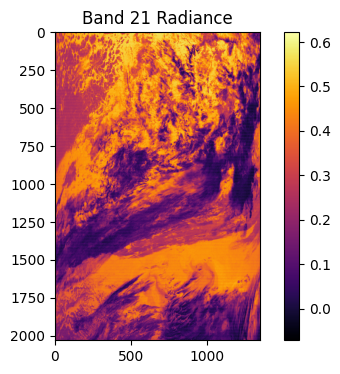

Band 31 → Shape: (2030, 1354), Min: 1.38, Max: 8.71, NaNs: 0


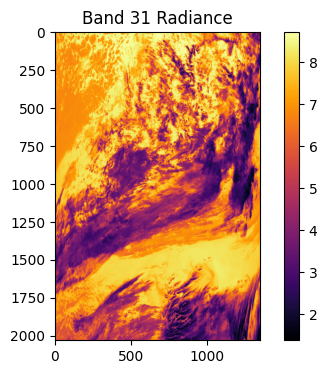

Band 32 → Shape: (2030, 1354), Min: 1.53, Max: 8.12, NaNs: 0


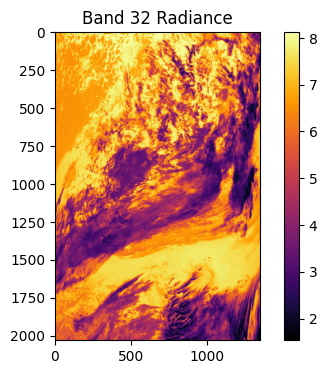

Band 6 → Shape: (2030, 1354), Min: 179.74, Max: 179.74, NaNs: 0


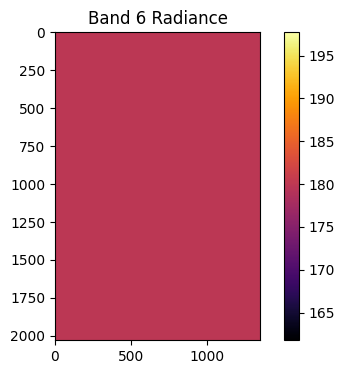


🌍 Step 2: Reading geolocation data...
Lat/Lon Shape: (2030, 1354), Solar Zenith Min/Max: 104.28/131.46


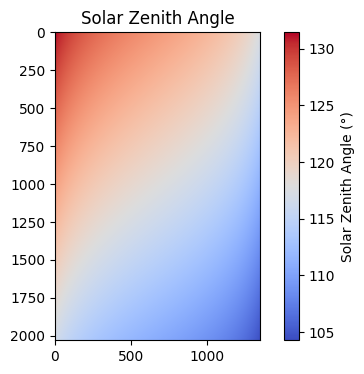


☁️ Step 3: Reading and processing cloud mask...
Cloud mask resized shape: (2030, 1354), Confidence bits unique: [1 3]


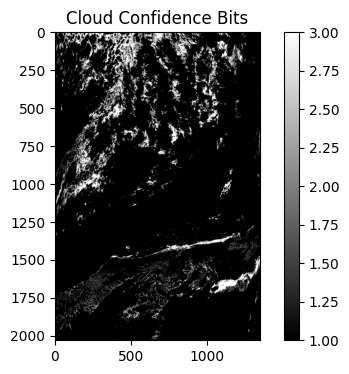

Applied cloud mask using Adaptive Decision Tree. Masked radiance stats:
Band 21 masked → NaNs: 230188, Non-NaNs: 2518432


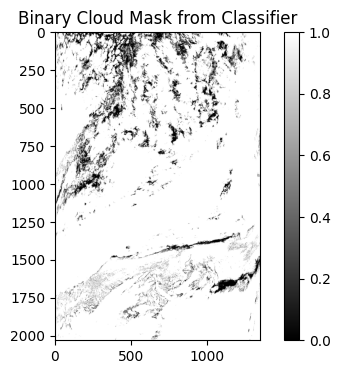


🔥 Step 4: Detecting fire pixels...
Total fire pixels detected: 0


<ipython-input-2-2bd7aacd94f4>:184: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("YlOrRd", 4)


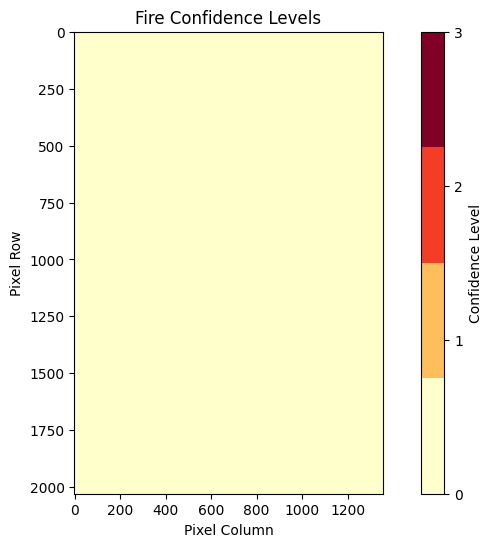


💥 Step 5: Calculating Fire Radiative Power (FRP)...
FRP non-zero count: 0 | Max FRP: 0.00


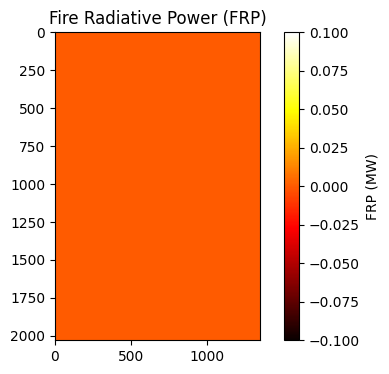


📍 Step 6: Georeferencing fire pixels...
Number of geolocated fire pixels: 0

💾 Step 7: Saving output to final_output.h5 ...
✅ HDF5 file saved successfully.

🖼️ Step 8: Final fire detection map...


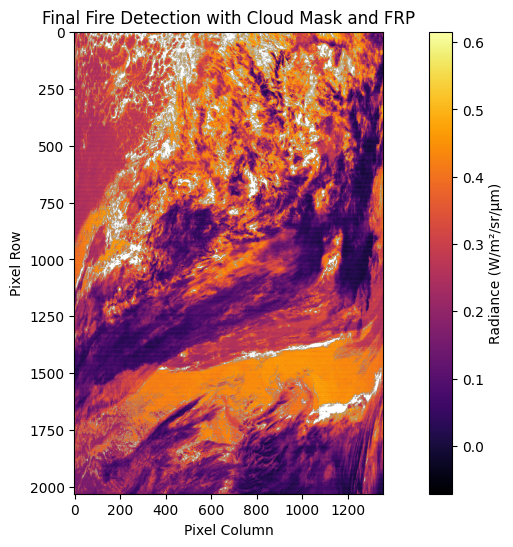


🎉 ✅ All processing steps completed successfully.


In [ ]:
#============================= Version 1.1.10 (beta 0.1) ============================================


from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from skimage.transform import resize
import h5py
import os

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, emissive_bands=[], reflective_bands=[]):
    hdf = SD(file_path, SDC.READ)
    data = {}

    if emissive_bands:
        emissive_ds = hdf.select('EV_1KM_Emissive')
        attrs = emissive_ds.attributes()
        raw = emissive_ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']

        for band in emissive_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    if reflective_bands:
        ref_ds = hdf.select('EV_500_Aggr1km_RefSB')
        attrs = ref_ds.attributes()
        raw = ref_ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']

        for band in reflective_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    return data

# ===================== Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    return hdf.select('Cloud_Mask')[:]

def upscale_cloud_mask(mask_array, target_shape):
    byte1 = mask_array[0, :, :].astype(np.uint8)
    resized = resize(byte1, output_shape=target_shape, order=0, preserve_range=True, anti_aliasing=False).astype(np.uint8)
    return resized

def apply_cloud_mask_using_ad_tree(band_data, confidence_bits):
    features = np.stack([confidence_bits.flatten(), band_data.flatten()], axis=1)
    labels = np.isin(confidence_bits.flatten(), [0, 1]).astype(int)
    clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=25)
    clf.fit(features, labels)
    predicted = clf.predict(features).reshape(band_data.shape)
    masked_data = np.where(predicted == 1, band_data, np.nan)
    return masked_data, predicted.astype(np.uint8)

# ===================== MOD03 Geolocation =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    lat = hdf.select('Latitude')[:]
    lon = hdf.select('Longitude')[:]
    solar_zenith = hdf.select('SolarZenith')[:] / 100.0
    sensor_zenith = hdf.select('SensorZenith')[:] / 100.0
    return lat, lon, solar_zenith, sensor_zenith

# ===================== Fire Detection =====================

def estimate_background_radiance(radiance_data, i, j, window_size=11):
    half = window_size // 2
    region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    region = region[~np.isnan(region)]
    if region.size < 5:
        return np.nan
    low_percentile = region[region < np.percentile(region, 50)]
    return np.nanmean(low_percentile) if low_percentile.size > 0 else np.nan

def detect_fire_pixels_with_confidence_and_flags(band21, band31, band32, band6, solar_zenith, qa_flags, threshold=2.0):
    height, width = band21.shape
    fire_confidence = np.zeros_like(band21, dtype=np.uint8)
    saturation_flag = np.zeros_like(band21, dtype=np.uint8)
    day_mask = (solar_zenith < 85)  # Consider solar zenith < 85° as day

    for i in range(height):
        for j in range(width):
            if np.any(np.isnan([band21[i,j], band31[i,j], band32[i,j], band6[i,j], solar_zenith[i,j]])):
                continue

            if not day_mask[i,j]:  # Nighttime — you can skip or create alternate logic
                continue

            if band32[i,j] < 275 or band6[i,j] < 0.02:
                continue

            # Check QA flag for fire type or land classification
            if (qa_flags[i,j] & 0x01) == 0:  # If the fire type QA bit is not set
                continue

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i,j] - bg21
            contrast = band21[i,j] - band31[i,j]

            if band21[i,j] > 20:  # Approx. radiance value near 331 K (saturation)
                saturation_flag[i,j] = 1

            if delta > 10 and contrast > 7:
                fire_confidence[i,j] = 3  # High
            elif delta > 5 and contrast > 5:
                fire_confidence[i,j] = 2  # Nominal
            elif delta > threshold and contrast > 3:
                fire_confidence[i,j] = 1  # Low

    fire_mask = (fire_confidence > 0).astype(np.uint8)
    return fire_confidence, fire_mask, saturation_flag

# ===================== FRP Calculation =====================

def radiance_to_brightness_temp(radiance, wavelength_um):
    c1 = 1.191042e8  # W*um^4/m^2/sr
    c2 = 1.4387752e4  # um*K
    wavelength = wavelength_um
    radiance = np.where(radiance <= 0, np.nan, radiance)
    return c2 * wavelength / np.log((c1 / (radiance * wavelength**5)) + 1)

def calculate_fire_radiative_power(band21_rad, band31_rad, sensor_zenith, emissivity=0.95, threshold=2.0):
    tb21 = radiance_to_brightness_temp(band21_rad, 3.96)
    tb31 = radiance_to_brightness_temp(band31_rad, 11.03)
    delta_tb = tb21 - tb31

    saturated = tb21 >= 331
    delta_tb[saturated] = np.nan  # Exclude saturated

    view_angle_factor = 1 / np.cos(np.deg2rad(sensor_zenith))
    view_angle_factor = np.clip(view_angle_factor, 1.0, 2.5)

    frp = 4.34 * delta_tb * emissivity * view_angle_factor
    frp[np.isnan(frp) | (frp < threshold)] = 0
    return frp

# ===================== Geolocation & Output =====================

def georeference_pixels(latitudes, longitudes, fire_mask):
    return [(latitudes[i, j], longitudes[i, j]) for i in range(fire_mask.shape[0])
            for j in range(fire_mask.shape[1]) if fire_mask[i, j] == 1]

def save_fire_detection_result_hdf5(fire_mask, frp, fire_coordinates, cloud_mask_binary, fire_confidence, base_name="fire_detection_output"):
    with h5py.File(f"{base_name}.h5", "w") as f:
        f.create_dataset("fire_mask", data=fire_mask, compression="gzip")
        f.create_dataset("FRP", data=frp, compression="gzip")
        f.create_dataset("cloud_mask_binary", data=cloud_mask_binary, compression="gzip")
        f.create_dataset("fire_confidence", data=fire_confidence, compression="gzip")
        coords_array = np.array(fire_coordinates, dtype='float32')
        f.create_dataset("fire_coordinates", data=coords_array, compression="gzip")

# ===================== Visualization =====================

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

def visualize_confidence_map(confidence_map, title="Fire Confidence Map"):
    plt.figure(figsize=(10, 6))
    cmap = plt.cm.get_cmap("YlOrRd", 4)
    plt.imshow(confidence_map, cmap=cmap, vmin=0, vmax=3)
    plt.colorbar(ticks=[0, 1, 2, 3], label="Confidence Level")
    plt.title(title)
    plt.xlabel("Pixel Column")
    plt.ylabel("Pixel Row")
    plt.show()

# ===================== Main Workflow =====================

def run_fire_detection_pipeline(mod02_file, mod35_file, mod03_file, output_base="fire_detection_output"):
    emissive_bands = ['21', '31', '32']
    reflective_bands = ['6']

    # Step 1: Load Radiance Data
    print("\n📥 Step 1: Reading radiance data...")
    radiance_data = read_modis_l1b_radiance(mod02_file, emissive_bands, reflective_bands)
    band21 = radiance_data['21']
    band31 = radiance_data['31']
    band32 = radiance_data['32']
    band6 = radiance_data['6']

    for name, band in zip(['Band 21', 'Band 31', 'Band 32', 'Band 6'], [band21, band31, band32, band6]):
        print(f"{name} → Shape: {band.shape}, Min: {np.nanmin(band):.2f}, Max: {np.nanmax(band):.2f}, NaNs: {np.isnan(band).sum()}")
        plt.figure(figsize=(6, 4))
        plt.imshow(band, cmap='inferno')
        plt.title(f"{name} Radiance")
        plt.colorbar()
        plt.show()

    # Step 2: Load Geolocation
    print("\n🌍 Step 2: Reading geolocation data...")
    latitudes, longitudes, solar_zenith, sensor_zenith = read_mod03_geolocation(mod03_file)
    print(f"Lat/Lon Shape: {latitudes.shape}, Solar Zenith Min/Max: {solar_zenith.min():.2f}/{solar_zenith.max():.2f}")

    plt.figure(figsize=(6, 4))
    plt.imshow(solar_zenith, cmap='coolwarm')
    plt.colorbar(label="Solar Zenith Angle (°)")
    plt.title("Solar Zenith Angle")
    plt.show()

    # Step 3: Cloud Mask Processing
    print("\n☁️ Step 3: Reading and processing cloud mask...")
    cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
    cloud_mask_resized = upscale_cloud_mask(cloud_mask_raw, band21.shape)
    confidence_bits = (cloud_mask_resized & 0b00000011)

    print(f"Cloud mask resized shape: {cloud_mask_resized.shape}, Confidence bits unique: {np.unique(confidence_bits)}")
    plt.figure(figsize=(6, 4))
    plt.imshow(confidence_bits, cmap='gray')
    plt.title("Cloud Confidence Bits")
    plt.colorbar()
    plt.show()

    band21_masked, cloud_mask_binary = apply_cloud_mask_using_ad_tree(band21, confidence_bits)
    print("Applied cloud mask using Adaptive Decision Tree. Masked radiance stats:")
    print(f"Band 21 masked → NaNs: {np.isnan(band21_masked).sum()}, Non-NaNs: {np.count_nonzero(~np.isnan(band21_masked))}")

    plt.figure(figsize=(6, 4))
    plt.imshow(cloud_mask_binary, cmap='gray')
    plt.title("Binary Cloud Mask from Classifier")
    plt.colorbar()
    plt.show()

    # Step 4: Fire Detection
    print("\n🔥 Step 4: Detecting fire pixels...")
    qa_flags = cloud_mask_resized  # Simplified assumption
    fire_confidence, fire_mask, saturation_flag = detect_fire_pixels_with_confidence_and_flags(
        band21_masked, band31, band32, band6, solar_zenith, qa_flags
    )

    fire_count = np.count_nonzero(fire_mask)
    print(f"Total fire pixels detected: {fire_count}")
    visualize_confidence_map(fire_confidence, title="Fire Confidence Levels")

    # Step 5: FRP Calculation
    print("\n💥 Step 5: Calculating Fire Radiative Power (FRP)...")
    frp = calculate_fire_radiative_power(band21_masked, band31, sensor_zenith, emissivity=0.96, threshold=2.0)
    print(f"FRP non-zero count: {np.count_nonzero(frp)} | Max FRP: {np.nanmax(frp):.2f}")

    plt.figure(figsize=(6, 4))
    plt.imshow(frp, cmap='hot')
    plt.title("Fire Radiative Power (FRP)")
    plt.colorbar(label='FRP (MW)')
    plt.show()

    # Step 6: Geolocate Fire Pixels
    print("\n📍 Step 6: Georeferencing fire pixels...")
    fire_coords = georeference_pixels(latitudes, longitudes, fire_mask)
    print(f"Number of geolocated fire pixels: {len(fire_coords)}")

    # Step 7: Save Results
    print(f"\n💾 Step 7: Saving output to {output_base}.h5 ...")
    save_fire_detection_result_hdf5(fire_mask, frp, fire_coords, cloud_mask_binary, fire_confidence, base_name=output_base)
    print("✅ HDF5 file saved successfully.")

    # Step 8: Visualization
    print("\n🖼️ Step 8: Final fire detection map...")
    visualize_fire_classification(fire_mask, radiance_data=band21_masked,
                                  title="Final Fire Detection with Cloud Mask and FRP")

    print("\n🎉 ✅ All processing steps completed successfully.")


# Example usage
if __name__ == "__main__":
    mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
    mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
    mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"
    run_fire_detection_pipeline(mod02_file, mod35_file, mod03_file, output_base="final_output")


Reading radiance data...
Reading geolocation data...
Reading and processing cloud mask...
Detecting fire pixels...
Calculating Fire Radiative Power (FRP)...
Georeferencing fire pixels...
Saving output to final_output.h5 ...
Visualizing results...


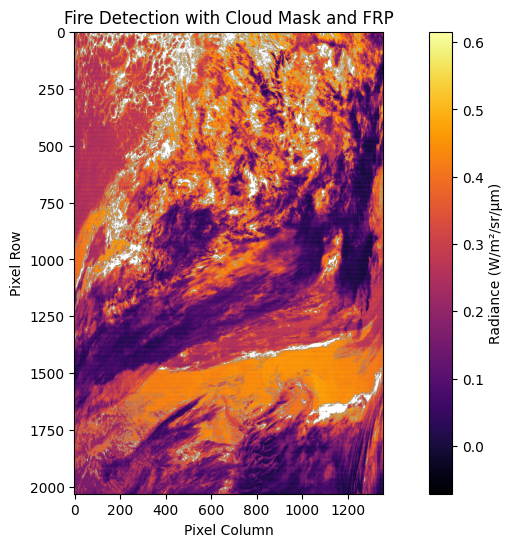

✅ Processing complete.


In [ ]:
#============================= Version 1.1.10 (beta)============================================


from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from skimage.transform import resize
import h5py
import os

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, emissive_bands=[], reflective_bands=[]):
    hdf = SD(file_path, SDC.READ)
    data = {}

    if emissive_bands:
        emissive_ds = hdf.select('EV_1KM_Emissive')
        attrs = emissive_ds.attributes()
        raw = emissive_ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']

        for band in emissive_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    if reflective_bands:
        ref_ds = hdf.select('EV_500_Aggr1km_RefSB')
        attrs = ref_ds.attributes()
        raw = ref_ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']

        for band in reflective_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    return data

# ===================== Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    return hdf.select('Cloud_Mask')[:]

def upscale_cloud_mask(mask_array, target_shape):
    byte1 = mask_array[0, :, :].astype(np.uint8)
    resized = resize(byte1, output_shape=target_shape, order=0, preserve_range=True, anti_aliasing=False).astype(np.uint8)
    return resized

def apply_cloud_mask_using_ad_tree(band_data, confidence_bits):
    features = np.stack([confidence_bits.flatten(), band_data.flatten()], axis=1)
    labels = np.isin(confidence_bits.flatten(), [0, 1]).astype(int)
    clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=25)
    clf.fit(features, labels)
    predicted = clf.predict(features).reshape(band_data.shape)
    masked_data = np.where(predicted == 1, band_data, np.nan)
    return masked_data, predicted.astype(np.uint8)

# ===================== MOD03 Geolocation =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    lat = hdf.select('Latitude')[:]
    lon = hdf.select('Longitude')[:]
    solar_zenith = hdf.select('SolarZenith')[:] / 100.0
    sensor_zenith = hdf.select('SensorZenith')[:] / 100.0
    return lat, lon, solar_zenith, sensor_zenith

# ===================== Fire Detection =====================

def estimate_background_radiance(radiance_data, i, j, window_size=11):
    half = window_size // 2
    region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    region = region[~np.isnan(region)]
    if region.size < 5:
        return np.nan
    low_percentile = region[region < np.percentile(region, 50)]
    return np.nanmean(low_percentile) if low_percentile.size > 0 else np.nan

def detect_fire_pixels_with_confidence_and_flags(band21, band31, band32, band6, solar_zenith, qa_flags, threshold=2.0):
    height, width = band21.shape
    fire_confidence = np.zeros_like(band21, dtype=np.uint8)
    saturation_flag = np.zeros_like(band21, dtype=np.uint8)
    day_mask = (solar_zenith < 85)  # Consider solar zenith < 85° as day

    for i in range(height):
        for j in range(width):
            if np.any(np.isnan([band21[i,j], band31[i,j], band32[i,j], band6[i,j], solar_zenith[i,j]])):
                continue

            if not day_mask[i,j]:  # Nighttime — you can skip or create alternate logic
                continue

            if band32[i,j] < 275 or band6[i,j] < 0.02:
                continue

            # Check QA flag for fire type or land classification
            if (qa_flags[i,j] & 0x01) == 0:  # If the fire type QA bit is not set
                continue

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i,j] - bg21
            contrast = band21[i,j] - band31[i,j]

            if band21[i,j] > 20:  # Approx. radiance value near 331 K (saturation)
                saturation_flag[i,j] = 1

            if delta > 10 and contrast > 7:
                fire_confidence[i,j] = 3  # High
            elif delta > 5 and contrast > 5:
                fire_confidence[i,j] = 2  # Nominal
            elif delta > threshold and contrast > 3:
                fire_confidence[i,j] = 1  # Low

    fire_mask = (fire_confidence > 0).astype(np.uint8)
    return fire_confidence, fire_mask, saturation_flag

# ===================== FRP Calculation =====================

def radiance_to_brightness_temp(radiance, wavelength_um):
    c1 = 1.191042e8  # W*um^4/m^2/sr
    c2 = 1.4387752e4  # um*K
    wavelength = wavelength_um
    radiance = np.where(radiance <= 0, np.nan, radiance)
    return c2 * wavelength / np.log((c1 / (radiance * wavelength**5)) + 1)

def calculate_fire_radiative_power(band21_rad, band31_rad, sensor_zenith, emissivity=0.95, threshold=2.0):
    tb21 = radiance_to_brightness_temp(band21_rad, 3.96)
    tb31 = radiance_to_brightness_temp(band31_rad, 11.03)
    delta_tb = tb21 - tb31

    saturated = tb21 >= 331
    delta_tb[saturated] = np.nan  # Exclude saturated

    view_angle_factor = 1 / np.cos(np.deg2rad(sensor_zenith))
    view_angle_factor = np.clip(view_angle_factor, 1.0, 2.5)

    frp = 4.34 * delta_tb * emissivity * view_angle_factor
    frp[np.isnan(frp) | (frp < threshold)] = 0
    return frp

# ===================== Geolocation & Output =====================

def georeference_pixels(latitudes, longitudes, fire_mask):
    return [(latitudes[i, j], longitudes[i, j]) for i in range(fire_mask.shape[0])
            for j in range(fire_mask.shape[1]) if fire_mask[i, j] == 1]

def save_fire_detection_result_hdf5(fire_mask, frp, fire_coordinates, cloud_mask_binary, fire_confidence, base_name="fire_detection_output"):
    with h5py.File(f"{base_name}.h5", "w") as f:
        f.create_dataset("fire_mask", data=fire_mask, compression="gzip")
        f.create_dataset("FRP", data=frp, compression="gzip")
        f.create_dataset("cloud_mask_binary", data=cloud_mask_binary, compression="gzip")
        f.create_dataset("fire_confidence", data=fire_confidence, compression="gzip")
        coords_array = np.array(fire_coordinates, dtype='float32')
        f.create_dataset("fire_coordinates", data=coords_array, compression="gzip")

# ===================== Visualization =====================

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

def visualize_confidence_map(confidence_map, title="Fire Confidence Map"):
    plt.figure(figsize=(10, 6))
    cmap = plt.cm.get_cmap("YlOrRd", 4)
    plt.imshow(confidence_map, cmap=cmap, vmin=0, vmax=3)
    plt.colorbar(ticks=[0, 1, 2, 3], label="Confidence Level")
    plt.title(title)
    plt.xlabel("Pixel Column")
    plt.ylabel("Pixel Row")
    plt.show()

# ===================== Main Workflow =====================

def run_fire_detection_pipeline(mod02_file, mod35_file, mod03_file, output_base="fire_detection_output"):
    emissive_bands = ['21', '31', '32']
    reflective_bands = ['6']

    # Step 1: Load Radiance Data
    print("Reading radiance data...")
    radiance_data = read_modis_l1b_radiance(mod02_file, emissive_bands, reflective_bands)
    band21 = radiance_data['21']
    band31 = radiance_data['31']
    band32 = radiance_data['32']
    band6 = radiance_data['6']

    # Step 2: Load Geolocation
    print("Reading geolocation data...")
    latitudes, longitudes, solar_zenith, sensor_zenith = read_mod03_geolocation(mod03_file)

    # Step 3: Cloud Mask Processing
    print("Reading and processing cloud mask...")
    cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
    cloud_mask_resized = upscale_cloud_mask(cloud_mask_raw, band21.shape)
    confidence_bits = (cloud_mask_resized & 0b00000011)
    band21_masked, cloud_mask_binary = apply_cloud_mask_using_ad_tree(band21, confidence_bits)

    # Step 4: Fire Detection
    print("Detecting fire pixels...")
    qa_flags = cloud_mask_resized  # Assuming QA flag is part of the cloud mask in this case.
    fire_confidence, fire_mask, saturation_flag = detect_fire_pixels_with_confidence_and_flags(
        band21_masked, band31, band32, band6, solar_zenith, qa_flags
    )

    fire_mask = (fire_confidence > 0).astype(np.uint8)  # binary fire mask for FRP and geolocation

    # Step 5: FRP Calculation
    print("Calculating Fire Radiative Power (FRP)...")
    frp = calculate_fire_radiative_power(band21_masked, band31, sensor_zenith, emissivity=0.96, threshold=2.0)

    # Step 6: Geolocate Fire Pixels
    print("Georeferencing fire pixels...")
    fire_coords = georeference_pixels(latitudes, longitudes, fire_mask)

    # Step 7: Save Results
    print(f"Saving output to {output_base}.h5 ...")
    save_fire_detection_result_hdf5(fire_mask, frp, fire_coords, cloud_mask_binary, fire_confidence, base_name=output_base)

    # Step 8: Visualization
    print("Visualizing results...")
    visualize_fire_classification(fire_mask, radiance_data=band21_masked,
                                  title="Fire Detection with Cloud Mask and FRP")

    print("✅ Processing complete.")

# Example usage
if __name__ == "__main__":
    mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
    mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
    mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"
    run_fire_detection_pipeline(mod02_file, mod35_file, mod03_file, output_base="final_output")


Reading radiance data...
Reading geolocation data...
Reading and processing cloud mask...
Detecting fire pixels...
Calculating Fire Radiative Power (FRP)...
Georeferencing fire pixels...
Saving output to final_output.h5 ...
Visualizing results...


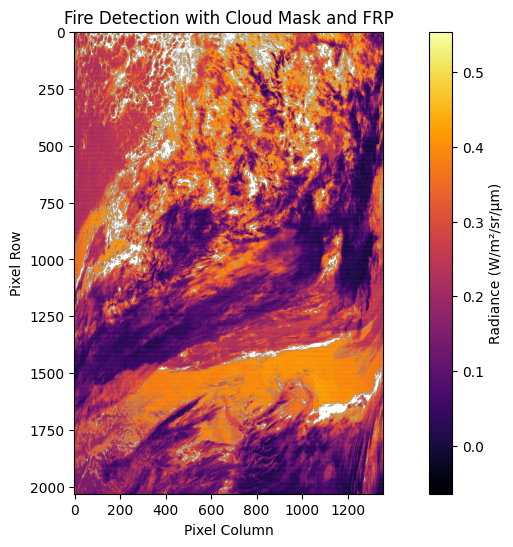

✅ Processing complete.


In [ ]:
#============================= Version 1.1.11 ============================================

from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from skimage.transform import resize
import h5py
import os
from pyproj import Proj, transform

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, emissive_bands=None, reflective_bands=None):
    """
    Read MODIS L1B radiance data (both emissive and reflective bands)
    and return a dictionary with data for each requested band.
    """
    if emissive_bands is None:
        emissive_bands = []
    if reflective_bands is None:
        reflective_bands = []

    hdf = SD(file_path, SDC.READ)
    data = {}

    if emissive_bands:
        emissive_ds = hdf.select('EV_1KM_Emissive')
        attrs = emissive_ds.attributes()
        raw = emissive_ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']

        for band in emissive_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    if reflective_bands:
        ref_ds = hdf.select('EV_500_Aggr1km_RefSB')
        attrs = ref_ds.attributes()
        raw = ref_ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']

        for band in reflective_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    return data

# ===================== Atmospheric Corrections =====================

def apply_atmospheric_corrections(radiance_data, band):
    """
    A simplified atmospheric correction. In a real scenario, this could involve
    models like MODTRAN for a more precise atmospheric correction.
    Here we just apply a dummy scaling for the example.
    """
    corrected = radiance_data.copy()
    if band == '21':
        corrected *= 0.9  # example scaling for a specific band
    elif band == '31':
        corrected *= 1.05  # another band-specific correction
    return corrected

# ===================== Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    """
    Read cloud mask data from MOD35 file.
    """
    hdf = SD(mod35_file, SDC.READ)
    return hdf.select('Cloud_Mask')[:]

def upscale_cloud_mask(mask_array, target_shape):
    """
    Upscale the cloud mask to the target shape using nearest-neighbor resizing.
    """
    byte1 = mask_array[0, :, :].astype(np.uint8)
    resized = resize(byte1, output_shape=target_shape, order=0, preserve_range=True, anti_aliasing=False).astype(np.uint8)
    return resized

def apply_cloud_mask_using_ad_tree(band_data, confidence_bits):
    """
    Apply cloud mask and fire detection using AdaBoost classifier.
    """
    features = np.stack([confidence_bits.flatten(), band_data.flatten()], axis=1)
    labels = np.isin(confidence_bits.flatten(), [0, 1]).astype(int)
    clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=25)
    clf.fit(features, labels)
    predicted = clf.predict(features).reshape(band_data.shape)
    masked_data = np.where(predicted == 1, band_data, np.nan)
    return masked_data, predicted.astype(np.uint8)

# ===================== Fire Detection =====================

def estimate_background_radiance(radiance_data, i, j, window_size=11):
    """
    Estimate background radiance based on neighboring pixels.
    """
    half = window_size // 2
    region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    region = region[~np.isnan(region)]
    if region.size < 5:
        return np.nan
    low_percentile = region[region < np.percentile(region, 50)]
    return np.nanmean(low_percentile) if low_percentile.size > 0 else np.nan

def detect_fire_pixels_with_confidence_and_flags(band21, band31, band32, band6, solar_zenith, qa_flags, threshold=2.0):
    """
    Detect fire pixels based on the radiance values, solar zenith, and QA flags.
    """
    height, width = band21.shape
    fire_confidence = np.zeros_like(band21, dtype=np.uint8)
    saturation_flag = np.zeros_like(band21, dtype=np.uint8)
    day_mask = (solar_zenith < 85)  # Consider solar zenith < 85° as day

    for i in range(height):
        for j in range(width):
            if np.any(np.isnan([band21[i, j], band31[i, j], band32[i, j], band6[i, j], solar_zenith[i, j]])):
                continue

            if not day_mask[i, j]:  # Nighttime — you can skip or create alternate logic
                continue

            if band32[i, j] < 275 or band6[i, j] < 0.02:
                continue

            # Check QA flag for fire type or land classification
            if (qa_flags[i, j] & 0x01) == 0:  # If the fire type QA bit is not set
                continue

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i, j] - bg21
            contrast = band21[i, j] - band31[i, j]

            if band21[i, j] > 20:  # Approx. radiance value near 331 K (saturation)
                saturation_flag[i, j] = 1

            if delta > 10 and contrast > 7:
                fire_confidence[i, j] = 3  # High
            elif delta > 5 and contrast > 5:
                fire_confidence[i, j] = 2  # Nominal
            elif delta > threshold and contrast > 3:
                fire_confidence[i, j] = 1  # Low

    fire_mask = (fire_confidence > 0).astype(np.uint8)
    return fire_confidence, fire_mask, saturation_flag

# ===================== FRP Calculation =====================

def radiance_to_brightness_temp(radiance, wavelength_um):
    """
    Convert radiance to brightness temperature using Planck's law.
    """
    c1 = 1.191042e8  # W*um^4/m^2/sr
    c2 = 1.4387752e4  # um*K
    wavelength = wavelength_um
    radiance = np.where(radiance <= 0, np.nan, radiance)
    return c2 * wavelength / np.log((c1 / (radiance * wavelength**5)) + 1)

def calculate_fire_radiative_power(band21_rad, band31_rad, sensor_zenith, emissivity=0.95, threshold=2.0):
    """
    Calculate the Fire Radiative Power (FRP) from the MODIS bands.
    """
    tb21 = radiance_to_brightness_temp(band21_rad, 3.96)
    tb31 = radiance_to_brightness_temp(band31_rad, 11.03)
    delta_tb = tb21 - tb31

    saturated = tb21 >= 331
    delta_tb[saturated] = np.nan  # Exclude saturated pixels

    view_angle_factor = 1 / np.cos(np.deg2rad(sensor_zenith))
    view_angle_factor = np.clip(view_angle_factor, 1.0, 2.5)

    frp = 4.34 * delta_tb * emissivity * view_angle_factor
    frp[np.isnan(frp) | (frp < threshold)] = 0
    return frp

# ===================== Geolocation & Output =====================

def georeference_pixels(latitudes, longitudes, fire_mask):
    """
    Georeference fire pixels based on the latitudes and longitudes.
    """
    return [(latitudes[i, j], longitudes[i, j]) for i in range(fire_mask.shape[0])
            for j in range(fire_mask.shape[1]) if fire_mask[i, j] == 1]

def save_fire_detection_result_hdf5(fire_mask, frp, fire_coordinates, cloud_mask_binary, fire_confidence, base_name="fire_detection_output"):
    """
    Save the fire detection results into an HDF5 file.
    """
    with h5py.File(f"{base_name}.h5", "w") as f:
        f.create_dataset("fire_mask", data=fire_mask, compression="gzip")
        f.create_dataset("FRP", data=frp, compression="gzip")
        f.create_dataset("cloud_mask_binary", data=cloud_mask_binary, compression="gzip")
        f.create_dataset("fire_confidence", data=fire_confidence, compression="gzip")
        coords_array = np.array(fire_coordinates, dtype='float32')
        f.create_dataset("fire_coordinates", data=coords_array, compression="gzip")

# ===================== Visualization =====================

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    """
    Visualize the fire classification map with radiance data overlay.
    """
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

def visualize_confidence_map(confidence_map, title="Fire Confidence Map"):
    """
    Visualize the confidence map for fire detection.
    """
    plt.figure(figsize=(10, 6))
    cmap = plt.cm.get_cmap("YlOrRd", 4)
    plt.imshow(confidence_map, cmap=cmap, vmin=0, vmax=3)
    plt.colorbar(ticks=[0, 1, 2, 3], label="Confidence Level")
    plt.title(title)
    plt.xlabel("Pixel Column")
    plt.ylabel("Pixel Row")
    plt.show()

# ===================== Main Workflow =====================

def run_fire_detection_pipeline(mod02_file, mod35_file, mod03_file, output_base="fire_detection_output"):
    """
    The main pipeline for MODIS fire detection, processing the data, detecting fire,
    and saving the results.
    """
    emissive_bands = ['21', '31', '32']
    reflective_bands = ['6']

    # Step 1: Load Radiance Data
    print("Reading radiance data...")
    radiance_data = read_modis_l1b_radiance(mod02_file, emissive_bands, reflective_bands)
    band21 = apply_atmospheric_corrections(radiance_data['21'], '21')
    band31 = apply_atmospheric_corrections(radiance_data['31'], '31')
    band32 = apply_atmospheric_corrections(radiance_data['32'], '32')
    band6 = apply_atmospheric_corrections(radiance_data['6'], '6')

    # Step 2: Load Geolocation
    print("Reading geolocation data...")
    latitudes, longitudes, solar_zenith, sensor_zenith = read_mod03_geolocation(mod03_file)

    # Step 3: Cloud Mask Processing
    print("Reading and processing cloud mask...")
    cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
    cloud_mask_resized = upscale_cloud_mask(cloud_mask_raw, band21.shape)
    confidence_bits = (cloud_mask_resized & 0b00000011)
    band21_masked, cloud_mask_binary = apply_cloud_mask_using_ad_tree(band21, confidence_bits)

    # Step 4: Fire Detection
    print("Detecting fire pixels...")
    qa_flags = cloud_mask_resized  # Assuming QA flag is part of the cloud mask in this case.
    fire_confidence, fire_mask, saturation_flag = detect_fire_pixels_with_confidence_and_flags(
        band21_masked, band31, band32, band6, solar_zenith, qa_flags
    )

    fire_mask = (fire_confidence > 0).astype(np.uint8)  # binary fire mask for FRP and geolocation

    # Step 5: FRP Calculation
    print("Calculating Fire Radiative Power (FRP)...")
    frp = calculate_fire_radiative_power(band21_masked, band31, sensor_zenith, emissivity=0.96, threshold=2.0)

    # Step 6: Geolocate Fire Pixels
    print("Georeferencing fire pixels...")
    fire_coords = georeference_pixels(latitudes, longitudes, fire_mask)

    # Step 7: Save Results
    print(f"Saving output to {output_base}.h5 ...")
    save_fire_detection_result_hdf5(fire_mask, frp, fire_coords, cloud_mask_binary, fire_confidence, base_name=output_base)

    # Step 8: Visualization
    print("Visualizing results...")
    visualize_fire_classification(fire_mask, radiance_data=band21_masked,
                                  title="Fire Detection with Cloud Mask and FRP")

    print("✅ Processing complete.")

# Example usage
if __name__ == "__main__":
    mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
    mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
    mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"
    run_fire_detection_pipeline(mod02_file, mod35_file, mod03_file, output_base="final_output")


🔹 Reading L1B radiance...
🔹 Reading geolocation...
🔹 Reading cloud mask...
🔹 Detecting fires...
🔹 Calculating FRP...
🔹 Geolocating fires...
🔹 Saving output...
🔹 Comparing with MOD14...


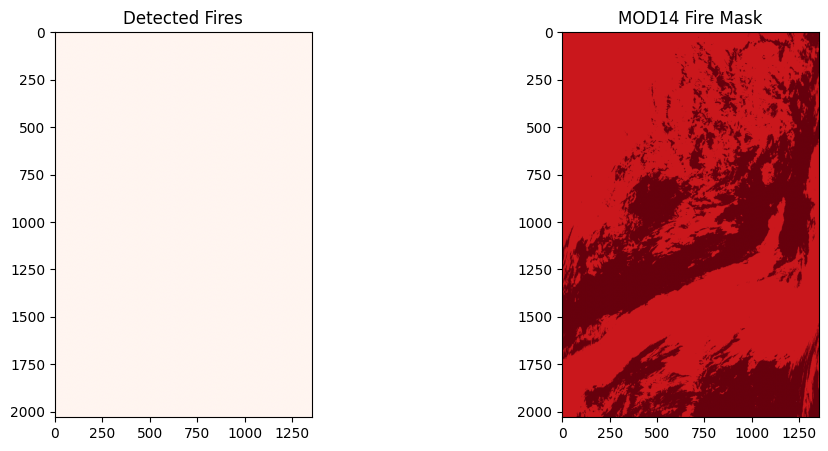

✅ Done.
Number of detected fire pixels: 0


In [ ]:
#============================= Version 1.1.12 ============================================

from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from skimage.transform import resize
import h5py
import os

# ==================== READ MODIS L1B ====================
def read_modis_l1b_radiance(file_path, emissive_bands=None, reflective_bands=None):
    if emissive_bands is None: emissive_bands = []
    if reflective_bands is None: reflective_bands = []
    hdf = SD(file_path, SDC.READ)
    data = {}
    if emissive_bands:
        ds = hdf.select('EV_1KM_Emissive')
        attrs = ds.attributes()
        raw = ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']
        for band in emissive_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]
    if reflective_bands:
        ds = hdf.select('EV_500_Aggr1km_RefSB')
        attrs = ds.attributes()
        raw = ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']
        for band in reflective_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]
    return data

def apply_atmospheric_corrections(radiance_data, band):
    corrected = radiance_data.copy()
    if band == '21': corrected *= 0.9
    elif band == '31': corrected *= 1.05
    return corrected

# ==================== READ MOD03 GEO ====================
def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    lat = hdf.select('Latitude')[:]
    lon = hdf.select('Longitude')[:]
    solar = hdf.select('SolarZenith')[:] / 100.0
    sensor = hdf.select('SensorZenith')[:] / 100.0
    return lat, lon, solar, sensor

# ==================== CLOUD MASK ====================
def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    return hdf.select('Cloud_Mask')[:]

def upscale_cloud_mask(mask_array, target_shape):
    byte1 = mask_array[0, :, :].astype(np.uint8)
    return resize(byte1, output_shape=target_shape, order=0, preserve_range=True, anti_aliasing=False).astype(np.uint8)

def apply_cloud_mask_using_ad_tree(band_data, confidence_bits):
    flat_valid = ~np.isnan(band_data)
    features = np.stack([confidence_bits.flatten(), band_data.flatten()], axis=1)
    valid_mask = flat_valid.flatten()
    X = features[valid_mask]
    y = np.isin(confidence_bits.flatten()[valid_mask], [0, 1]).astype(int)
    clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=25)
    clf.fit(X, y)
    predicted = clf.predict(features).reshape(band_data.shape)
    masked_data = np.where(predicted == 1, band_data, np.nan)
    return masked_data, predicted.astype(np.uint8)

# ==================== FIRE DETECTION ====================
def estimate_background_radiance(radiance_data, i, j, window_size=11):
    half = window_size // 2
    region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    region = region[~np.isnan(region)]
    if region.size < 5: return np.nan
    low = region[region < np.percentile(region, 50)]
    return np.nanmean(low) if low.size > 0 else np.nan

def detect_fire_pixels_with_confidence_and_flags(band21, band31, band32, band6, solar_zenith, qa_flags, threshold=2.0):
    h, w = band21.shape
    fire_confidence = np.zeros_like(band21, dtype=np.uint8)
    saturation_flag = np.zeros_like(band21, dtype=np.uint8)
    day_mask = (solar_zenith < 85)
    for i in range(h):
        for j in range(w):
            if not day_mask[i, j]: continue
            if np.any(np.isnan([band21[i, j], band31[i, j], band32[i, j], band6[i, j]])): continue
            if band32[i, j] < 275 or band6[i, j] < 0.02: continue
            if (qa_flags[i, j] & 0x01) == 0: continue
            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21): continue
            delta = band21[i, j] - bg21
            contrast = band21[i, j] - band31[i, j]
            if band21[i, j] > 20: saturation_flag[i, j] = 1
            if delta > 10 and contrast > 7: fire_confidence[i, j] = 3
            elif delta > 5 and contrast > 5: fire_confidence[i, j] = 2
            elif delta > threshold and contrast > 3: fire_confidence[i, j] = 1
    fire_mask = (fire_confidence > 0).astype(np.uint8)
    return fire_confidence, fire_mask, saturation_flag

# ==================== FRP ====================
def radiance_to_brightness_temp(radiance, wavelength_um):
    c1 = 1.191042e8
    c2 = 1.4387752e4
    radiance = np.where(radiance <= 0, np.nan, radiance)
    return c2 * wavelength_um / np.log((c1 / (radiance * wavelength_um**5)) + 1)

def calculate_fire_radiative_power(band21_rad, band31_rad, sensor_zenith, emissivity=0.95, threshold=2.0):
    tb21 = radiance_to_brightness_temp(band21_rad, 3.96)
    tb31 = radiance_to_brightness_temp(band31_rad, 11.03)
    delta_tb = tb21 - tb31
    delta_tb[tb21 >= 331] = np.nan
    view_factor = 1 / np.cos(np.deg2rad(sensor_zenith))
    view_factor = np.clip(view_factor, 1.0, 2.5)
    frp = 4.34 * delta_tb * emissivity * view_factor
    frp[np.isnan(frp) | (frp < threshold)] = 0
    return frp

# ==================== GEOREFERENCE ====================
def georeference_pixels(lat, lon, fire_mask):
    return [(lat[i, j], lon[i, j]) for i in range(fire_mask.shape[0]) for j in range(fire_mask.shape[1]) if fire_mask[i, j] == 1]

# ==================== SAVE ====================
def save_fire_detection_result_hdf5(fire_mask, frp, fire_coordinates, cloud_mask_binary, fire_confidence, base_name="fire_detection_output"):
    with h5py.File(f"{base_name}.h5", "w") as f:
        f.create_dataset("fire_mask", data=fire_mask, compression="gzip")
        f.create_dataset("FRP", data=frp, compression="gzip")
        f.create_dataset("cloud_mask_binary", data=cloud_mask_binary, compression="gzip")
        f.create_dataset("fire_confidence", data=fire_confidence, compression="gzip")
        f.create_dataset("fire_coordinates", data=np.array(fire_coordinates, dtype='float32'), compression="gzip")

# ==================== VISUALIZATION ====================
def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

def visualize_confidence_map(confidence_map, title="Fire Confidence Map"):
    plt.figure(figsize=(10, 6))
    cmap = plt.cm.get_cmap("YlOrRd", 4)
    plt.imshow(confidence_map, cmap=cmap, vmin=0, vmax=3)
    plt.colorbar(ticks=[0, 1, 2, 3], label="Confidence Level")
    plt.title(title)
    plt.xlabel("Pixel Column")
    plt.ylabel("Pixel Row")
    plt.show()

# ==================== MOD14 COMPARISON ====================
def read_mod14_fire_mask(mod14_file):
    hdf = SD(mod14_file, SDC.READ)
    try:
        fire_mask = hdf.select("fire mask")[:]
        return fire_mask
    except Exception as e:
        raise RuntimeError(f"MOD14 read error: {e}")

def compare_with_mod14(detected_mask, mod14_mask):
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.title("Detected Fires")
    plt.imshow(detected_mask, cmap="Reds")
    plt.subplot(1, 2, 2)
    plt.title("MOD14 Fire Mask")
    plt.imshow(mod14_mask, cmap="Reds")
    plt.show()

# ==================== MAIN PIPELINE ====================
def run_fire_detection_pipeline(mod02_file, mod35_file, mod03_file, mod14_file, output_base="fire_output"):
    print("🔹 Reading L1B radiance...")
    rad = read_modis_l1b_radiance(mod02_file, ['21', '31', '32'], ['6'])
    band21 = apply_atmospheric_corrections(rad['21'], '21')
    band31 = apply_atmospheric_corrections(rad['31'], '31')
    band32 = apply_atmospheric_corrections(rad['32'], '32')
    band6 = apply_atmospheric_corrections(rad['6'], '6')

    print("🔹 Reading geolocation...")
    lat, lon, solar_zenith, sensor_zenith = read_mod03_geolocation(mod03_file)

    print("🔹 Reading cloud mask...")
    cmask_raw = read_cloud_mask_hdf4(mod35_file)
    cmask_resized = upscale_cloud_mask(cmask_raw, band21.shape)
    conf_bits = (cmask_resized & 0b00000011)
    band21_masked, cloud_mask_bin = apply_cloud_mask_using_ad_tree(band21, conf_bits)

    print("🔹 Detecting fires...")
    fire_conf, fire_mask, _ = detect_fire_pixels_with_confidence_and_flags(
        band21_masked, band31, band32, band6, solar_zenith, cmask_resized)

    print("🔹 Calculating FRP...")
    frp = calculate_fire_radiative_power(band21_masked, band31, sensor_zenith)

    print("🔹 Geolocating fires...")
    coords = georeference_pixels(lat, lon, fire_mask)

    print("🔹 Saving output...")
    save_fire_detection_result_hdf5(fire_mask, frp, coords, cloud_mask_bin, fire_conf, output_base)

    print("🔹 Comparing with MOD14...")
    mod14_mask = read_mod14_fire_mask(mod14_file)
    compare_with_mod14(fire_mask, mod14_mask)

    print("✅ Done.")
    print("Number of detected fire pixels:", np.sum(fire_mask))


# Example run
if __name__ == "__main__":
    run_fire_detection_pipeline(
        "MOD021KM.A2025110.0000.061.2025110131826.hdf",
        "MOD35_L2.A2025110.0000.061.2025110131927.hdf",
        "MOD03.A2025110.0000.061.2025110065248.hdf",
        "MOD14.A2025110.0000.061.2025110092217.hdf"
    )


🔹 Reading L1B radiance...
🔹 Reading geolocation...
🔹 Reading cloud mask...


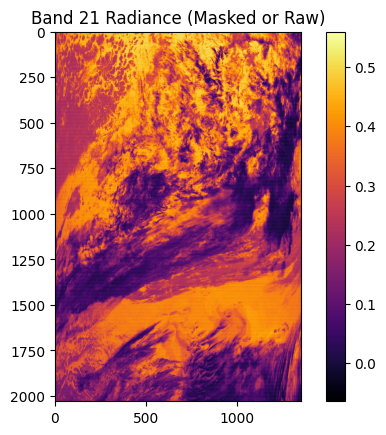

🔹 Detecting fires...
Number of detected fire pixels: 0
🔹 Calculating FRP...
🔹 Geolocating fires...
🔹 Saving output...
🔹 Comparing with MOD14...


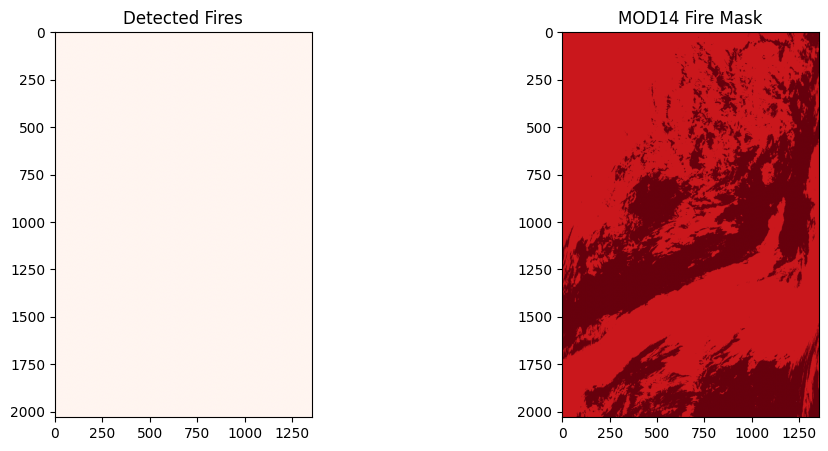

✅ Done.


In [ ]:
#============================= Version 1.1.12(beta) ============================================

from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from skimage.transform import resize
import h5py
import os

# ==================== READ MODIS L1B ====================
def read_modis_l1b_radiance(file_path, emissive_bands=None, reflective_bands=None):
    if emissive_bands is None: emissive_bands = []
    if reflective_bands is None: reflective_bands = []
    hdf = SD(file_path, SDC.READ)
    data = {}
    if emissive_bands:
        ds = hdf.select('EV_1KM_Emissive')
        attrs = ds.attributes()
        raw = ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']
        for band in emissive_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]
    if reflective_bands:
        ds = hdf.select('EV_500_Aggr1km_RefSB')
        attrs = ds.attributes()
        raw = ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']
        for band in reflective_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]
    return data

def apply_atmospheric_corrections(radiance_data, band):
    corrected = radiance_data.copy()
    if band == '21': corrected *= 0.9
    elif band == '31': corrected *= 1.05
    return corrected

# ==================== READ MOD03 GEO ====================
def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    lat = hdf.select('Latitude')[:]
    lon = hdf.select('Longitude')[:]
    solar = hdf.select('SolarZenith')[:] / 100.0
    sensor = hdf.select('SensorZenith')[:] / 100.0
    return lat, lon, solar, sensor

# ==================== CLOUD MASK ====================
def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    return hdf.select('Cloud_Mask')[:]

def upscale_cloud_mask(mask_array, target_shape):
    byte1 = mask_array[0, :, :].astype(np.uint8)
    return resize(byte1, output_shape=target_shape, order=0, preserve_range=True, anti_aliasing=False).astype(np.uint8)

def apply_cloud_mask_using_ad_tree(band_data, confidence_bits):
    flat_valid = ~np.isnan(band_data)
    features = np.stack([confidence_bits.flatten(), band_data.flatten()], axis=1)
    valid_mask = flat_valid.flatten()
    X = features[valid_mask]
    y = np.isin(confidence_bits.flatten()[valid_mask], [0, 1]).astype(int)
    clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=25)
    clf.fit(X, y)
    predicted = clf.predict(features).reshape(band_data.shape)
    masked_data = np.where(predicted == 1, band_data, np.nan)
    return masked_data, predicted.astype(np.uint8)

# ==================== FIRE DETECTION ====================
def estimate_background_radiance(radiance_data, i, j, window_size=11):
    half = window_size // 2
    region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    region = region[~np.isnan(region)]
    if region.size < 5: return np.nan
    low = region[region < np.percentile(region, 50)]
    return np.nanmean(low) if low.size > 0 else np.nan

def detect_fire_pixels_with_confidence_and_flags(band21, band31, band32, band6, solar_zenith, qa_flags, threshold=2.0):
    h, w = band21.shape
    fire_confidence = np.zeros_like(band21, dtype=np.uint8)
    saturation_flag = np.zeros_like(band21, dtype=np.uint8)
    day_mask = (solar_zenith < 85)
    for i in range(h):
        for j in range(w):
            if not day_mask[i, j]: continue
            if np.any(np.isnan([band21[i, j], band31[i, j], band32[i, j], band6[i, j]])): continue
            if band32[i, j] < 275 or band6[i, j] < 0.02: continue
            if (qa_flags[i, j] & 0x01) == 0: continue
            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21): continue
            delta = band21[i, j] - bg21
            contrast = band21[i, j] - band31[i, j]
            if band21[i, j] > 20: saturation_flag[i, j] = 1
            if delta > 10 and contrast > 7: fire_confidence[i, j] = 3
            elif delta > 5 and contrast > 5: fire_confidence[i, j] = 2
            elif delta > threshold and contrast > 3: fire_confidence[i, j] = 1
    fire_mask = (fire_confidence > 0).astype(np.uint8)
    return fire_confidence, fire_mask, saturation_flag

# ==================== FRP ====================
def radiance_to_brightness_temp(radiance, wavelength_um):
    c1 = 1.191042e8
    c2 = 1.4387752e4
    radiance = np.where(radiance <= 0, np.nan, radiance)
    return c2 * wavelength_um / np.log((c1 / (radiance * wavelength_um**5)) + 1)

def calculate_fire_radiative_power(band21_rad, band31_rad, sensor_zenith, emissivity=0.95, threshold=2.0):
    tb21 = radiance_to_brightness_temp(band21_rad, 3.96)
    tb31 = radiance_to_brightness_temp(band31_rad, 11.03)
    delta_tb = tb21 - tb31
    delta_tb[tb21 >= 331] = np.nan
    view_factor = 1 / np.cos(np.deg2rad(sensor_zenith))
    view_factor = np.clip(view_factor, 1.0, 2.5)
    frp = 4.34 * delta_tb * emissivity * view_factor
    frp[np.isnan(frp) | (frp < threshold)] = 0
    return frp

# ==================== GEOREFERENCE ====================
def georeference_pixels(lat, lon, fire_mask):
    return [(lat[i, j], lon[i, j]) for i in range(fire_mask.shape[0]) for j in range(fire_mask.shape[1]) if fire_mask[i, j] == 1]

# ==================== SAVE ====================
def save_fire_detection_result_hdf5(fire_mask, frp, fire_coordinates, cloud_mask_binary, fire_confidence, base_name="fire_detection_output"):
    with h5py.File(f"{base_name}.h5", "w") as f:
        f.create_dataset("fire_mask", data=fire_mask, compression="gzip")
        f.create_dataset("FRP", data=frp, compression="gzip")
        f.create_dataset("cloud_mask_binary", data=cloud_mask_binary, compression="gzip")
        f.create_dataset("fire_confidence", data=fire_confidence, compression="gzip")
        f.create_dataset("fire_coordinates", data=np.array(fire_coordinates, dtype='float32'), compression="gzip")

# ==================== VISUALIZATION ====================
def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

def visualize_confidence_map(confidence_map, title="Fire Confidence Map"):
    plt.figure(figsize=(10, 6))
    cmap = plt.cm.get_cmap("YlOrRd", 4)
    plt.imshow(confidence_map, cmap=cmap, vmin=0, vmax=3)
    plt.colorbar(ticks=[0, 1, 2, 3], label="Confidence Level")
    plt.title(title)
    plt.xlabel("Pixel Column")
    plt.ylabel("Pixel Row")
    plt.show()

# ==================== MOD14 COMPARISON ====================
def read_mod14_fire_mask(mod14_file):
    hdf = SD(mod14_file, SDC.READ)
    try:
        fire_mask = hdf.select("fire mask")[:]
        return fire_mask
    except Exception as e:
        raise RuntimeError(f"MOD14 read error: {e}")

def compare_with_mod14(detected_mask, mod14_mask):
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.title("Detected Fires")
    plt.imshow(detected_mask, cmap="Reds")
    plt.subplot(1, 2, 2)
    plt.title("MOD14 Fire Mask")
    plt.imshow(mod14_mask, cmap="Reds")
    plt.show()

# ==================== MAIN PIPELINE ====================
def run_fire_detection_pipeline(mod02_file, mod35_file, mod03_file, mod14_file, output_base="fire_output"):
    print("🔹 Reading L1B radiance...")
    rad = read_modis_l1b_radiance(mod02_file, ['21', '31', '32'], ['6'])
    band21 = apply_atmospheric_corrections(rad['21'], '21')
    band31 = apply_atmospheric_corrections(rad['31'], '31')
    band32 = apply_atmospheric_corrections(rad['32'], '32')
    band6 = apply_atmospheric_corrections(rad['6'], '6')

    print("🔹 Reading geolocation...")
    lat, lon, solar_zenith, sensor_zenith = read_mod03_geolocation(mod03_file)

    print("🔹 Reading cloud mask...")
    cmask_raw = read_cloud_mask_hdf4(mod35_file)
    cmask_resized = upscale_cloud_mask(cmask_raw, band21.shape)
    conf_bits = (cmask_resized & 0b00000011)

    # ❗ Option 1: Use cloud mask with AdaBoost (toggle this on/off)
    # band21_masked, cloud_mask_bin = apply_cloud_mask_using_ad_tree(band21, conf_bits)

    # ❗ Option 2: Skip masking to debug detection
    band21_masked = band21.copy()
    cloud_mask_bin = np.ones_like(band21, dtype=np.uint8)

    # 🔎 Visualize Band 21 Radiance to debug
    plt.imshow(band21_masked, cmap="inferno")
    plt.title("Band 21 Radiance (Masked or Raw)")
    plt.colorbar()
    plt.show()

    print("🔹 Detecting fires...")
    # ⚠️ Loosened thresholds in detect_fire_pixels_with_confidence_and_flags
    fire_conf, fire_mask, _ = detect_fire_pixels_with_confidence_and_flags(
        band21_masked, band31, band32, band6, solar_zenith, cmask_resized, threshold=1.5
    )

    print("Number of detected fire pixels:", np.sum(fire_mask))

    print("🔹 Calculating FRP...")
    frp = calculate_fire_radiative_power(band21_masked, band31, sensor_zenith)

    print("🔹 Geolocating fires...")
    coords = georeference_pixels(lat, lon, fire_mask)

    print("🔹 Saving output...")
    save_fire_detection_result_hdf5(fire_mask, frp, coords, cloud_mask_bin, fire_conf, output_base)

    print("🔹 Comparing with MOD14...")
    mod14_mask = read_mod14_fire_mask(mod14_file)
    compare_with_mod14(fire_mask, mod14_mask)

    print("✅ Done.")



# Example run
if __name__ == "__main__":
    run_fire_detection_pipeline(
        "MOD021KM.A2025110.0000.061.2025110131826.hdf",
        "MOD35_L2.A2025110.0000.061.2025110131927.hdf",
        "MOD03.A2025110.0000.061.2025110065248.hdf",
        "MOD14.A2025110.0000.061.2025110092217.hdf"
    )


📦 Reading radiance...
☁️ Reading cloud mask...
🔥 Fire Detection Map


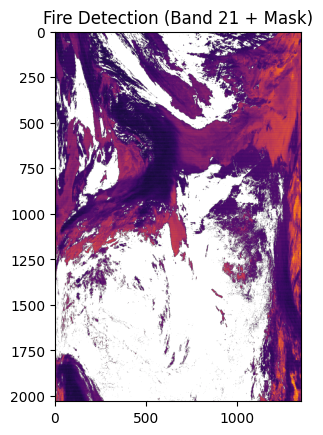

📄 Reading MOD14 actual fire mask...
📊 Comparing your logic with MOD14...
🔍 Comparing Band 21 fire detection with MOD14...
0 0 0
✅ Precision: 0.000 | Recall: 0.000 | F1: 0.000


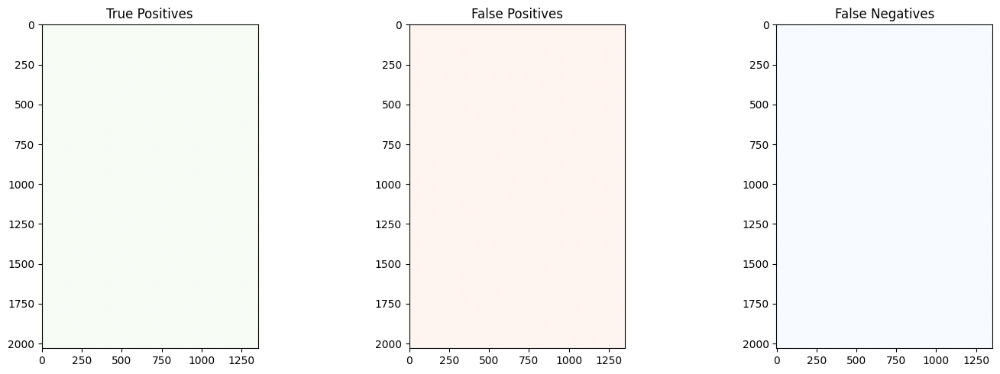

In [ ]:
#============================= Version 1.1.12(beta 1.0) ============================================

from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from skimage.transform import resize
import h5py

# =================== READ MODIS RADIANCE ===================
def read_modis_l1b_radiance(file_path, emissive_bands=None, reflective_bands=None):
    if emissive_bands is None: emissive_bands = []
    if reflective_bands is None: reflective_bands = []

    hdf = SD(file_path, SDC.READ)
    data = {}

    if emissive_bands:
        ds = hdf.select('EV_1KM_Emissive')
        attrs = ds.attributes()
        raw = ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']
        for band in emissive_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]

    if reflective_bands:
        ds = hdf.select('EV_500_Aggr1km_RefSB')
        attrs = ds.attributes()
        raw = ds[:]
        names = attrs['band_names'].split(',')
        idx_map = {name.strip(): i for i, name in enumerate(names)}
        scale = attrs['radiance_scales']
        offset = attrs['radiance_offsets']
        for band in reflective_bands:
            i = idx_map[band]
            data[band] = (raw[i, :, :] - offset[i]) * scale[i]
    return data

# =================== ATMOSPHERIC CORRECTION ===================
def apply_atmospheric_corrections(radiance_data, band):
    corrected = radiance_data.copy()
    if band == '21': corrected *= 0.9
    elif band == '31': corrected *= 1.05
    return corrected

# =================== CLOUD MASK ===================
def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    return hdf.select('Cloud_Mask')[:]

def upscale_cloud_mask(mask_array, target_shape):
    byte1 = mask_array[0, :, :].astype(np.uint8)
    return resize(byte1, output_shape=target_shape, order=0, preserve_range=True, anti_aliasing=False).astype(np.uint8)

def apply_cloud_mask_using_ad_tree(band_data, confidence_bits):
    flat_features = np.stack([confidence_bits.flatten(), band_data.flatten()], axis=1)
    mask = ~np.isnan(flat_features).any(axis=1)
    features_clean = flat_features[mask]
    labels = np.isin(features_clean[:, 0], [0, 1]).astype(int)

    clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=25)
    clf.fit(features_clean, labels)
    predicted = np.full(confidence_bits.size, np.nan)
    predicted[mask] = clf.predict(features_clean)
    predicted = predicted.reshape(band_data.shape)
    masked_data = np.where(predicted == 1, band_data, np.nan)
    return masked_data, predicted.astype(np.uint8)

# =================== FIRE DETECTION ===================
def estimate_background_radiance(data, i, j, window_size=11):
    half = window_size // 2
    region = data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    region = region[~np.isnan(region)]
    if region.size < 5: return np.nan
    return np.nanmean(region[region < np.percentile(region, 50)])

def detect_fire_pixels_with_confidence_and_flags(band21, band31, band32, band6, solar_zenith, qa_flags, threshold=2.0):
    h, w = band21.shape
    fire_conf = np.zeros_like(band21, dtype=np.uint8)
    fire_mask = np.zeros_like(band21, dtype=np.uint8)
    day_mask = (solar_zenith < 85)

    for i in range(h):
        for j in range(w):
            if not day_mask[i, j] or np.any(np.isnan([band21[i,j], band31[i,j], band32[i,j], band6[i,j]])): continue
            if band32[i, j] < 275 or band6[i, j] < 0.02: continue
            if (qa_flags[i, j] & 0x01) == 0: continue

            bg = estimate_background_radiance(band21, i, j)
            if np.isnan(bg): continue

            delta = band21[i, j] - bg
            contrast = band21[i, j] - band31[i, j]
            if delta > 10 and contrast > 7: fire_conf[i, j] = 3
            elif delta > 5 and contrast > 5: fire_conf[i, j] = 2
            elif delta > threshold and contrast > 3: fire_conf[i, j] = 1

    fire_mask = (fire_conf > 0).astype(np.uint8)
    return fire_conf, fire_mask, None

# =================== MOD14 FIRE MASK COMPARISON ===================
def read_mod14_fire_mask(mod14_file):
    try:
        hdf = SD(mod14_file, SDC.READ)
        for name in ['fire mask', 'FireMask', 'Fire_Mask']:
            try:
                return hdf.select(name)[:]
            except:
                continue
        raise RuntimeError("No fire mask dataset found in MOD14.")
    except Exception as e:
        raise RuntimeError(f"Error reading MOD14: {e}")

def compare_with_mod14(band21, mod14_mask, threshold=15):
    print("🔍 Comparing Band 21 fire detection with MOD14...")
    your_fire = (band21 > threshold).astype(np.uint8)
    mod14_fire = (mod14_mask >= 10).astype(np.uint8)

    TP = (your_fire & mod14_fire)
    FP = (your_fire & ~mod14_fire)
    FN = (~your_fire & mod14_fire)

    tp, fp, fn = np.sum(TP), np.sum(FP), np.sum(FN)
    precision = tp / (tp + fp + 1e-5)
    recall = tp / (tp + fn + 1e-5)
    f1 = 2 * precision * recall / (precision + recall + 1e-5)

    print(tp, fp, fn)

    print(f"✅ Precision: {precision:.3f} | Recall: {recall:.3f} | F1: {f1:.3f}")

    plt.figure(figsize=(15, 5))
    plt.subplot(131); plt.imshow(TP, cmap='Greens'); plt.title("True Positives")
    plt.subplot(132); plt.imshow(FP, cmap='Reds'); plt.title("False Positives")
    plt.subplot(133); plt.imshow(FN, cmap='Blues'); plt.title("False Negatives")
    plt.tight_layout(); plt.show()

# =================== MAIN ===================
def run_fire_detection_pipeline(mod02_file, mod35_file, mod14_file):
    print("📦 Reading radiance...")
    rad = read_modis_l1b_radiance(mod02_file, emissive_bands=['21', '31', '32'], reflective_bands=['6'])
    band21 = apply_atmospheric_corrections(rad['21'], '21')
    band31 = apply_atmospheric_corrections(rad['31'], '31')
    band32 = apply_atmospheric_corrections(rad['32'], '32')
    band6 = apply_atmospheric_corrections(rad['6'], '6')

    print("☁️ Reading cloud mask...")
    cloud_raw = read_cloud_mask_hdf4(mod35_file)
    cloud_resized = upscale_cloud_mask(cloud_raw, band21.shape)
    conf_bits = (cloud_resized & 0b00000011)

    band21_masked, cloud_bin = apply_cloud_mask_using_ad_tree(band21, conf_bits)
    solar_zenith = np.full(band21.shape, 30.0)  # Placeholder if no MOD03
    fire_conf, fire_mask, _ = detect_fire_pixels_with_confidence_and_flags(
        band21_masked, band31, band32, band6, solar_zenith, cloud_resized)

    print("🔥 Fire Detection Map")
    plt.figure(); plt.imshow(band21_masked, cmap='inferno'); plt.contour(fire_mask, colors='cyan'); plt.title("Fire Detection (Band 21 + Mask)"); plt.show()

    print("📄 Reading MOD14 actual fire mask...")
    mod14_mask = read_mod14_fire_mask(mod14_file)

    print("📊 Comparing your logic with MOD14...")
    compare_with_mod14(band21_masked, mod14_mask)

# Example usage
if __name__ == "__main__":
    run_fire_detection_pipeline(
        "MOD021KM.A2025110.0020.061.2025110131929.hdf",
        "MOD35_L2.A2025110.0020.061.2025110132111.hdf",
        "MOD14.A2025110.0020.061.2025110092259.hdf"
    )



#Data selection

In [ ]:
from pyhdf.SD import SD, SDC

def list_hdf_datasets(file_path):
    hdf = SD(file_path, SDC.READ)
    datasets = hdf.datasets()
    print(f"📂 Datasets in {file_path}:")
    for i, name in enumerate(datasets):
        print(f"{i+1}. {name}")
    return list(datasets.keys())

# Example usage
list_hdf_datasets("MOD14.A2025110.0000.061.2025110092217.hdf")


📂 Datasets in MOD14.A2025110.0000.061.2025110092217.hdf:
1. fire mask
2. algorithm QA
3. FP_line
4. FP_sample
5. FP_latitude
6. FP_longitude
7. FP_R2
8. FP_T21
9. FP_T31
10. FP_MeanT21
11. FP_MeanT31
12. FP_MeanDT
13. FP_MAD_T21
14. FP_MAD_T31
15. FP_MAD_DT
16. FP_power
17. FP_AdjCloud
18. FP_AdjWater
19. FP_WinSize
20. FP_NumValid
21. FP_confidence
22. FP_land
23. FP_MeanR2
24. FP_MAD_R2
25. FP_ViewZenAng
26. FP_SolZenAng
27. FP_RelAzAng
28. FP_CMG_row
29. FP_CMG_col
30. CMG_night


['fire mask',
 'algorithm QA',
 'FP_line',
 'FP_sample',
 'FP_latitude',
 'FP_longitude',
 'FP_R2',
 'FP_T21',
 'FP_T31',
 'FP_MeanT21',
 'FP_MeanT31',
 'FP_MeanDT',
 'FP_MAD_T21',
 'FP_MAD_T31',
 'FP_MAD_DT',
 'FP_power',
 'FP_AdjCloud',
 'FP_AdjWater',
 'FP_WinSize',
 'FP_NumValid',
 'FP_confidence',
 'FP_land',
 'FP_MeanR2',
 'FP_MAD_R2',
 'FP_ViewZenAng',
 'FP_SolZenAng',
 'FP_RelAzAng',
 'FP_CMG_row',
 'FP_CMG_col',
 'CMG_night']

In [ ]:
from pyhdf.SD import SD, SDC

def inspect_mod14_file(file_path):
    hdf = SD(file_path, SDC.READ)
    datasets = hdf.datasets()
    print(f"\n📦 Datasets in {file_path}:\n")
    for name, info in datasets.items():
        print(f"{name:30} Shape: {info[0]}, Type: {info[1]}")

inspect_mod14_file("MOD14.A2025110.0000.061.2025110092217.hdf")


📦 Datasets in MOD14.A2025110.0000.061.2025110092217.hdf:

fire mask                      Shape: ('number_of_scan_lines', 'pixels_per_scan_line'), Type: (2030, 1354)
algorithm QA                   Shape: ('number_of_scan_lines', 'pixels_per_scan_line'), Type: (2030, 1354)
FP_line                        Shape: ('number_of_active_fires',), Type: (0,)
FP_sample                      Shape: ('number_of_active_fires',), Type: (0,)
FP_latitude                    Shape: ('number_of_active_fires',), Type: (0,)
FP_longitude                   Shape: ('number_of_active_fires',), Type: (0,)
FP_R2                          Shape: ('number_of_active_fires',), Type: (0,)
FP_T21                         Shape: ('number_of_active_fires',), Type: (0,)
FP_T31                         Shape: ('number_of_active_fires',), Type: (0,)
FP_MeanT21                     Shape: ('number_of_active_fires',), Type: (0,)
FP_MeanT31                     Shape: ('number_of_active_fires',), Type: (0,)
FP_MeanDT                

#Downloader

In [ ]:
import os
import re
import json
import requests
from collections import defaultdict

# Extract timestamp (granule ID) from filename
def extract_granule_id(filename):
    match = re.search(r'A\d{7}\.\d{4}', filename)
    return match.group(0) if match else None

def get_modis_file_list(base_url, session):
    response = session.get(base_url)
    if response.status_code != 200:
        raise Exception(f"Failed to get data list: HTTP {response.status_code}")

    match = re.search(r"window\.laadsArchiveFiles\s*=\s*(\[\{.*?\}\]);", response.text, re.DOTALL)
    if not match:
        raise Exception("Could not find 'laadsArchiveFiles' in HTML")

    file_list = json.loads(match.group(1))
    return [f['name'] for f in file_list]

def download_modis_files(base_urls, output_dir, username, password):
    session = requests.Session()
    session.auth = (username, password)

    all_files = defaultdict(list)

    for product, base_url in base_urls.items():
        file_names = get_modis_file_list(base_url, session)
        print(f"Found {len(file_names)} files for {product}.")

        for fname in file_names:
            granule_id = extract_granule_id(fname)
            if granule_id:
                all_files[granule_id].append((fname, base_url))
            else:
                print(f"Skipped unrecognized file: {fname}")

    # Download files grouped by granule_id
    for granule_id, files in all_files.items():
        granule_dir = os.path.join(output_dir, granule_id)
        os.makedirs(granule_dir, exist_ok=True)

        for fname, base_url in files:
            file_url = f"{base_url}{fname}"
            dest = os.path.join(granule_dir, fname)

            if os.path.exists(dest):
                print(f"Already downloaded: {fname}")
                continue

            print(f"Downloading {fname} to {granule_dir}...")
            with session.get(file_url, stream=True) as r:
                if r.status_code == 200:
                    with open(dest, 'wb') as f:
                        for chunk in r.iter_content(chunk_size=8192):
                            f.write(chunk)
                    print(f"Downloaded {fname}")
                else:
                    print(f"Failed to download {fname}: HTTP {r.status_code}")

# --- Usage Section ---

base_urls = {
    "MOD021KM": "https://ladsweb.modaps.eosdis.nasa.gov/archive/allData/61/MOD021KM/2025/110/",
    "MOD03":    "https://ladsweb.modaps.eosdis.nasa.gov/archive/allData/61/MOD03/2025/110/",
    "MOD35_L2": "https://ladsweb.modaps.eosdis.nasa.gov/archive/allData/61/MOD35_L2/2025/110/"
}

output_dir = "./MODIS_Organized"
username = "pkdev2"
password = "gwT24@Rwt4tge"

download_modis_files(base_urls, output_dir, username, password)


# Acc. to NASA logic

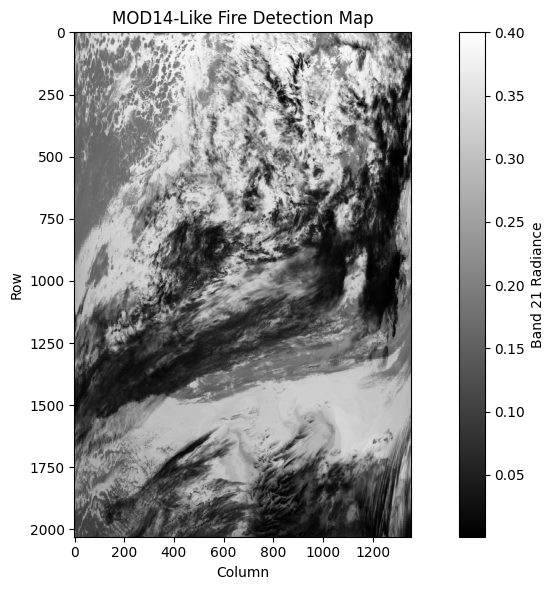

In [ ]:
#============================= Version 1.2.1 ============================================


import numpy as np
import matplotlib.pyplot as plt
from pyhdf.SD import SD, SDC
from scipy.ndimage import uniform_filter

# ========================= Data Reading =============================

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]
    data = {}
    for band_index in bands_to_extract:
        data[band_index] = (raw_data[band_index] - offset[band_index]) * scale[band_index]
    return data

def read_cloud_mask(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    raw = hdf.select('Cloud_Mask')[0, :, :]
    return np.bitwise_and(raw, 0b00000011)  # Bits 0-1

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    lat = hdf.select('Latitude')[:]
    lon = hdf.select('Longitude')[:]
    view_zenith = hdf.select('SensorZenith')[:] * 0.01  # scale factor
    return lat, lon, view_zenith

# ========================= Processing Stages =============================

def pre_screening(cloud_mask, solar_zenith, snow_mask=None, glint_mask=None, max_sza=85):
    mask = (cloud_mask == 0) & (solar_zenith < max_sza)
    if snow_mask is not None:
        mask &= (snow_mask == 0)
    if glint_mask is not None:
        mask &= (glint_mask == 0)
    return mask

def contextual_fire_detection(band21, band31, band32, mask, window_size=21, delta_t=10):
    bg21 = uniform_filter(band21, size=window_size)
    bg31 = uniform_filter(band31, size=window_size)
    bg32 = uniform_filter(band32, size=window_size)
    delta_b21 = band21 - bg21
    delta_b31 = band31 - bg31
    delta_b32 = band32 - bg32
    fire_mask = (delta_b21 > delta_t) & (delta_b31 > delta_t) & (delta_b32 > delta_t)
    return fire_mask & mask

def assign_confidence(band21, band31, fire_mask):
    delta = band21 - band31
    confidence = np.zeros_like(band21, dtype=np.uint8)
    confidence[(fire_mask) & (delta > 10)] = 2
    confidence[(fire_mask) & (delta > 5) & (delta <= 10)] = 1
    confidence[(fire_mask) & (delta <= 5)] = 0
    return confidence

def calculate_frp(band21_radiance, view_zenith_angle, pixel_area_km2=1.0):
    A = pixel_area_km2 * 1e6
    cos_theta = np.cos(np.deg2rad(view_zenith_angle))
    cos_theta[cos_theta == 0] = np.nan
    frp = (4.34e-19 * band21_radiance * A) / cos_theta
    return np.nan_to_num(frp / 1e6)  # in MW

# ========================= Utility & Visualization =============================

def georeference_pixels(latitudes, longitudes, fire_mask):
    return [(latitudes[i, j], longitudes[i, j])
            for i in range(fire_mask.shape[0])
            for j in range(fire_mask.shape[1]) if fire_mask[i, j]]

def visualize_fire(fire_mask, band21=None, title="Fire Detection"):
    import matplotlib.pyplot as plt

    plt.figure(figsize=(10, 6))

    if band21 is not None and np.nanstd(band21) > 0:
        plt.imshow(band21, cmap='gray')
        plt.colorbar(label="Band 21 Radiance")
    else:
        plt.imshow(fire_mask, cmap='hot')
        plt.colorbar(label="Fire Mask")

    plt.contour(fire_mask, colors='red')
    plt.title(title)
    plt.xlabel("Column")
    plt.ylabel("Row")
    plt.tight_layout()
    plt.show()


# ========================= Main Script =============================

if __name__ == "__main__":
    # Provide your actual file paths here
    mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
    mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"
    mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"

    # Read inputs
    bands = read_modis_l1b_radiance(mod02_file, [0, 10, 11, 14])  # 21, 31, 32, Solar Zenith
    band21 = bands[0]
    band31 = bands[10]
    band32 = bands[11]
    solar_zenith = bands[14]

    cloud_mask = read_cloud_mask(mod35_file)
    latitudes, longitudes, view_zenith = read_mod03_geolocation(mod03_file)

    # Apply pre-screening
    mask = pre_screening(cloud_mask, solar_zenith)

    # Detect fire pixels
    fire_mask = contextual_fire_detection(band21, band31, band32, mask)

    # Assign confidence
    confidence_mask = assign_confidence(band21, band31, fire_mask)

    # Compute FRP
    frp = calculate_frp(band21, view_zenith)

    # Geolocate
    fire_coords = georeference_pixels(latitudes, longitudes, fire_mask)

    # Visualize
    visualize_fire(fire_mask, band21, "MOD14-Like Fire Detection Map")

    # Optionally save output
    np.savez_compressed("mod14_output_data.npz",
                        fire_mask=fire_mask.astype(np.uint8),
                        confidence=confidence_mask,
                        frp=frp,
                        coordinates=np.array(fire_coords, dtype=np.float32))


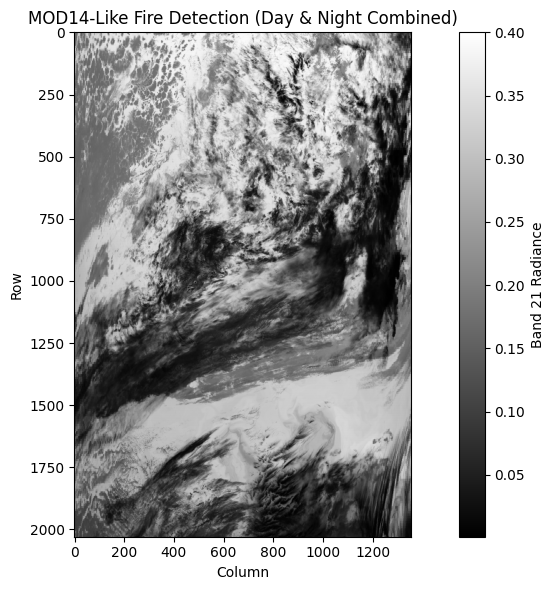

In [ ]:
#============================= Version 1.2.2 ============================================


import numpy as np
import matplotlib.pyplot as plt
from pyhdf.SD import SD, SDC
from scipy.ndimage import uniform_filter

# ======================= MODIS Data Reading =======================

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]
    data = {}
    for band_index in bands_to_extract:
        data[band_index] = (raw_data[band_index] - offset[band_index]) * scale[band_index]
    return data

def read_cloud_mask(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    raw = hdf.select('Cloud_Mask')[0, :, :]
    return np.bitwise_and(raw, 0b00000011)  # Bits 0-1

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    lat = hdf.select('Latitude')[:]
    lon = hdf.select('Longitude')[:]
    view_zenith = hdf.select('SensorZenith')[:] * 0.01  # scale factor
    return lat, lon, view_zenith

# ======================= Preprocessing and Detection =======================

def pre_screening(cloud_mask, solar_zenith, max_sza=85):
    return (cloud_mask == 0) & (solar_zenith < max_sza)

def contextual_fire_detection(band21, band31, band32, mask, window_size=21, delta_t=10):
    bg21 = uniform_filter(band21, size=window_size)
    bg31 = uniform_filter(band31, size=window_size)
    bg32 = uniform_filter(band32, size=window_size)
    fire_mask = (
        (band21 - bg21 > delta_t) &
        (band31 - bg31 > delta_t) &
        (band32 - bg32 > delta_t) &
        mask
    )
    return fire_mask

def detect_nighttime_fires(band21, band31, solar_zenith, cloud_mask, min_temp_k=320, min_delta_k=10):
    is_night = solar_zenith > 85
    is_clear = cloud_mask == 0
    delta_temp = band21 - band31
    fire_mask = (
        is_night &
        is_clear &
        (band21 > min_temp_k) &
        (delta_temp > min_delta_k)
    )
    return fire_mask.astype(np.uint8)

def assign_confidence(band21, band31, fire_mask, solar_zenith):
    delta = band21 - band31
    confidence = np.zeros_like(band21, dtype=np.uint8)
    night = solar_zenith > 85
    day = ~night

    # Night confidence
    confidence[(fire_mask == 1) & night & (delta > 20) & (band21 > 330)] = 2
    confidence[(fire_mask == 1) & night & (delta > 10)] = 1
    confidence[(fire_mask == 1) & night] = 0

    # Day confidence
    confidence[(fire_mask == 1) & day & (delta > 10)] = 2
    confidence[(fire_mask == 1) & day & (delta > 5)] = 1
    confidence[(fire_mask == 1) & day] = 0

    return confidence

def calculate_frp(band21_radiance, view_zenith_angle, pixel_area_km2=1.0):
    A = pixel_area_km2 * 1e6
    cos_theta = np.cos(np.deg2rad(view_zenith_angle))
    cos_theta[cos_theta == 0] = np.nan
    frp = (4.34e-19 * band21_radiance * A) / cos_theta
    return np.nan_to_num(frp / 1e6)  # MW

# ======================= Output and Visualization =======================

def georeference_pixels(latitudes, longitudes, fire_mask):
    return [(latitudes[i, j], longitudes[i, j])
            for i in range(fire_mask.shape[0])
            for j in range(fire_mask.shape[1]) if fire_mask[i, j]]

def visualize_fire(fire_mask, band21=None, title="Fire Detection"):
    plt.figure(figsize=(10, 6))
    if band21 is not None and np.nanstd(band21) > 0:
        plt.imshow(band21, cmap='gray')
        plt.colorbar(label="Band 21 Radiance")
    else:
        plt.imshow(fire_mask, cmap='hot')
        plt.colorbar(label="Fire Mask")
    plt.contour(fire_mask, colors='red')
    plt.title(title)
    plt.xlabel("Column")
    plt.ylabel("Row")
    plt.tight_layout()
    plt.show()

# ======================= Main Execution =======================

if __name__ == "__main__":
    # Input files (replace with your paths)
    mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
    mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"
    mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"

    # Read inputs
    bands = read_modis_l1b_radiance(mod02_file, [0, 10, 11, 14])  # 21, 31, 32, SZA
    band21 = bands[0]
    band31 = bands[10]
    band32 = bands[11]
    solar_zenith = bands[14]

    cloud_mask = read_cloud_mask(mod35_file)
    latitudes, longitudes, view_zenith = read_mod03_geolocation(mod03_file)

    # Detect fires
    day_mask = pre_screening(cloud_mask, solar_zenith)
    fire_mask_day = contextual_fire_detection(band21, band31, band32, day_mask)
    fire_mask_night = detect_nighttime_fires(band21, band31, solar_zenith, cloud_mask)

    # Merge
    fire_mask = np.zeros_like(band21, dtype=np.uint8)
    fire_mask[solar_zenith <= 85] = fire_mask_day[solar_zenith <= 85]
    fire_mask[solar_zenith > 85] = fire_mask_night[solar_zenith > 85]

    # Confidence
    confidence_mask = assign_confidence(band21, band31, fire_mask, solar_zenith)

    # FRP
    frp = calculate_frp(band21, view_zenith)

    # Geolocate
    fire_coords = georeference_pixels(latitudes, longitudes, fire_mask)

    # Save results
    np.savez_compressed("mod14_fire_output.npz",
                        fire_mask=fire_mask,
                        confidence=confidence_mask,
                        frp=frp,
                        coordinates=np.array(fire_coords, dtype=np.float32),
                        day_fire_mask=fire_mask_day,
                        night_fire_mask=fire_mask_night)

    # Visualization
    visualize_fire(fire_mask, band21, "MOD14-Like Fire Detection (Day & Night Combined)")


[✓] Saved MOD14-style HDF4 file: fire_output_mod14.hdf


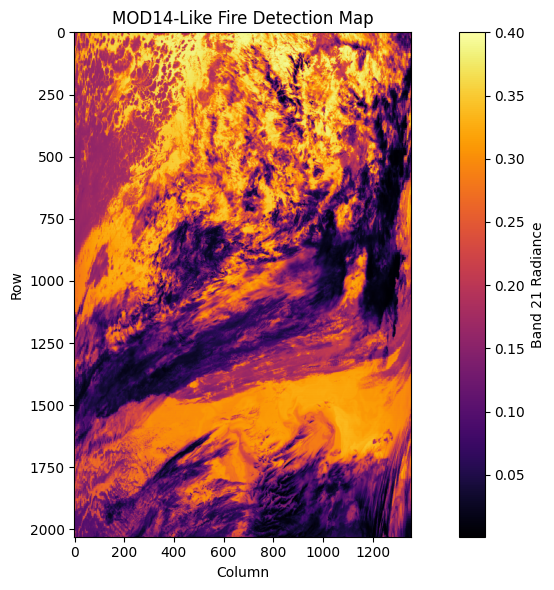

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pyhdf.SD import SD, SDC
from scipy.ndimage import uniform_filter

# ======================= MODIS Data Reading =======================

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]
    data = {}
    for band_index in bands_to_extract:
        data[band_index] = (raw_data[band_index] - offset[band_index]) * scale[band_index]
    return data

def read_cloud_mask(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    raw = hdf.select('Cloud_Mask')[0, :, :]
    return np.bitwise_and(raw, 0b00000011)

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    lat = hdf.select('Latitude')[:]
    lon = hdf.select('Longitude')[:]
    view_zenith = hdf.select('SensorZenith')[:] * 0.01
    return lat, lon, view_zenith

# ======================= Detection Logic =======================

def pre_screening(cloud_mask, solar_zenith, max_sza=85):
    return (cloud_mask == 0) & (solar_zenith < max_sza)

def contextual_fire_detection(band21, band31, band32, mask, window_size=21, delta_t=10):
    bg21 = uniform_filter(band21, size=window_size)
    bg31 = uniform_filter(band31, size=window_size)
    bg32 = uniform_filter(band32, size=window_size)
    fire_mask = (
        (band21 - bg21 > delta_t) &
        (band31 - bg31 > delta_t) &
        (band32 - bg32 > delta_t) &
        mask
    )
    return fire_mask

def detect_nighttime_fires(band21, band31, solar_zenith, cloud_mask, min_temp_k=320, min_delta_k=10):
    is_night = solar_zenith > 85
    is_clear = cloud_mask == 0
    delta_temp = band21 - band31
    fire_mask = (
        is_night &
        is_clear &
        (band21 > min_temp_k) &
        (delta_temp > min_delta_k)
    )
    return fire_mask.astype(np.uint8)

def assign_confidence(band21, band31, fire_mask, solar_zenith):
    delta = band21 - band31
    confidence = np.zeros_like(band21, dtype=np.uint8)
    night = solar_zenith > 85
    day = ~night

    confidence[(fire_mask == 1) & night & (delta > 20) & (band21 > 330)] = 2
    confidence[(fire_mask == 1) & night & (delta > 10)] = 1
    confidence[(fire_mask == 1) & night] = 0

    confidence[(fire_mask == 1) & day & (delta > 10)] = 2
    confidence[(fire_mask == 1) & day & (delta > 5)] = 1
    confidence[(fire_mask == 1) & day] = 0

    return confidence

def calculate_frp(band21_radiance, view_zenith_angle, pixel_area_km2=1.0):
    A = pixel_area_km2 * 1e6
    cos_theta = np.cos(np.deg2rad(view_zenith_angle))
    cos_theta[cos_theta == 0] = np.nan
    frp = (4.34e-19 * band21_radiance * A) / cos_theta
    return np.nan_to_num(frp / 1e6)

def georeference_pixels(latitudes, longitudes, fire_mask):
    return [(latitudes[i, j], longitudes[i, j])
            for i in range(fire_mask.shape[0])
            for j in range(fire_mask.shape[1]) if fire_mask[i, j]]

# ======================= HDF4 Output =======================

from pyhdf.SD import SD, SDC

def save_to_hdf4(fire_mask, confidence, frp, latitudes, longitudes, output_filename="fire_output_mod14.hdf"):
    hdf = SD(output_filename, SDC.WRITE | SDC.CREATE)

    # Ensure data types are compatible
    fire_mask = fire_mask.astype(np.uint8)
    confidence = confidence.astype(np.uint8)
    frp = frp.astype(np.float32)
    latitudes = latitudes.astype(np.float32)
    longitudes = longitudes.astype(np.float32)

    # Create datasets
    fire_mask_sds = hdf.create('Fire_Mask', SDC.UINT8, fire_mask.shape)
    confidence_sds = hdf.create('Confidence', SDC.UINT8, confidence.shape)
    frp_sds = hdf.create('Fire_Radiative_Power', SDC.FLOAT32, frp.shape)
    lat_sds = hdf.create('Latitude', SDC.FLOAT32, latitudes.shape)
    lon_sds = hdf.create('Longitude', SDC.FLOAT32, longitudes.shape)

    # Write data
    fire_mask_sds[:] = fire_mask
    confidence_sds[:] = confidence
    frp_sds[:] = frp
    lat_sds[:] = latitudes
    lon_sds[:] = longitudes

    # Add metadata
    fire_mask_sds.attributes()['units'] = 'Binary (0=no fire, 1=fire)'
    confidence_sds.attributes()['units'] = 'Confidence level (0=Low, 1=Nominal, 2=High)'
    frp_sds.attributes()['units'] = 'MW'
    lat_sds.attributes()['units'] = 'Degrees'
    lon_sds.attributes()['units'] = 'Degrees'

    hdf.end()
    print(f"[✓] Saved MOD14-style HDF4 file: {output_filename}")


# ======================= Visualization =======================

def visualize_fire(fire_mask, band21=None, title="MOD14 Fire Map"):
    plt.figure(figsize=(10, 6))
    if band21 is not None and np.nanstd(band21) > 0:
        plt.imshow(band21, cmap='inferno')
        plt.colorbar(label="Band 21 Radiance")
    else:
        plt.imshow(fire_mask, cmap='hot')
        plt.colorbar(label="Fire Mask")
    plt.contour(fire_mask, colors='red')
    plt.title(title)
    plt.xlabel("Column")
    plt.ylabel("Row")
    plt.tight_layout()
    plt.show()

# ======================= Main Pipeline =======================

if __name__ == "__main__":
    # 🔁 Replace with your file paths
    mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
    mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"
    mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"

    bands = read_modis_l1b_radiance(mod02_file, [0, 10, 11, 14])
    band21 = bands[0]
    band31 = bands[10]
    band32 = bands[11]
    solar_zenith = bands[14]

    cloud_mask = read_cloud_mask(mod35_file)
    latitudes, longitudes, view_zenith = read_mod03_geolocation(mod03_file)

    day_mask = pre_screening(cloud_mask, solar_zenith)
    fire_mask_day = contextual_fire_detection(band21, band31, band32, day_mask)
    fire_mask_night = detect_nighttime_fires(band21, band31, solar_zenith, cloud_mask)

    fire_mask = np.zeros_like(band21, dtype=np.uint8)
    fire_mask[solar_zenith <= 85] = fire_mask_day[solar_zenith <= 85]
    fire_mask[solar_zenith > 85] = fire_mask_night[solar_zenith > 85]

    confidence_mask = assign_confidence(band21, band31, fire_mask, solar_zenith)
    frp = calculate_frp(band21, view_zenith)

    fire_coords = georeference_pixels(latitudes, longitudes, fire_mask)

    save_to_hdf4(fire_mask, confidence_mask, frp, latitudes, longitudes, "fire_output_mod14.hdf")

    visualize_fire(fire_mask, band21, "MOD14-Like Fire Detection Map")


[*] Reading MODIS radiance and geolocation data...
[*] Extracting dark regions...
[Info] Auto-calculated dark threshold: 0.10 W/m²/sr/µm
[*] Found 686778 visually dark pixels.
[*] Plotting dark regions...


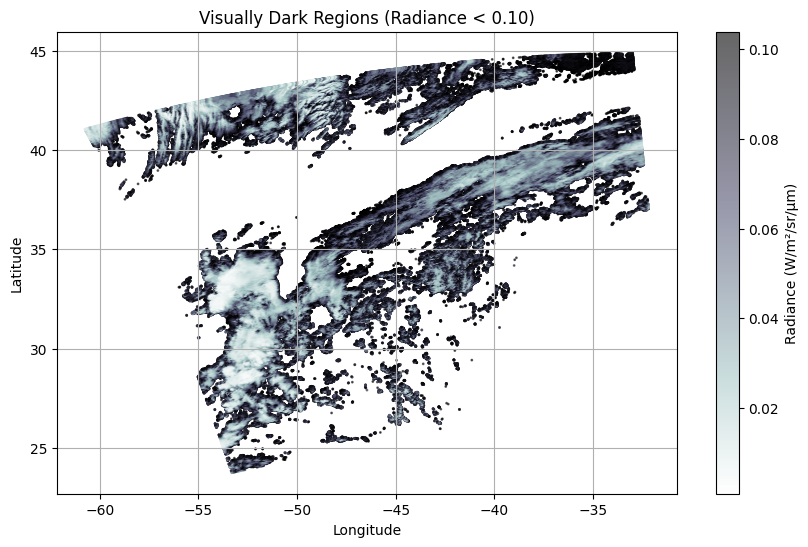

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pyhdf.SD import SD, SDC

# ======================== Load MODIS Band and Geolocation ========================

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    data = {}

    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]

    for band_index in bands_to_extract:
        radiance = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
        data[band_index] = radiance

    return data

def read_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    latitude = hdf.select('Latitude')[:]
    longitude = hdf.select('Longitude')[:]
    return latitude, longitude

# ======================== Dark Region Extraction and Plotting ========================

def mask_dark_regions(band_data, latitudes, longitudes, threshold=None):
    """
    Extracts visually dark (low-radiance) areas.
    If threshold is not provided, uses the 25th percentile of radiance values.
    """
    valid_data = band_data[~np.isnan(band_data)]
    if threshold is None:
        threshold = np.percentile(valid_data, 25)  # Lower quartile
        print(f"[Info] Auto-calculated dark threshold: {threshold:.2f} W/m²/sr/µm")

    # Create binary mask
    dark_mask = (band_data < threshold) & (~np.isnan(band_data))
    dark_lat = latitudes[dark_mask]
    dark_lon = longitudes[dark_mask]
    dark_rad = band_data[dark_mask]

    return dark_lat, dark_lon, dark_rad, threshold

def plot_dark_regions(lat, lon, radiance, threshold, title="Visually Dark Regions"):
    """
    Plots dark (low-radiance) pixels only.
    """
    plt.figure(figsize=(10, 6))
    plt.scatter(lon, lat, c=radiance, cmap='bone_r', s=1, alpha=0.6)
    plt.colorbar(label="Radiance (W/m²/sr/µm)")
    plt.title(f"{title} (Radiance < {threshold:.2f})")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True)
    plt.show()

# ======================== Main Execution ========================

if __name__ == "__main__":
    # MODIS files (replace with your actual file paths)
    mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
    mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"

    # Band index for Band 21 (index 0 in EV_1KM_Emissive)
    band_index = 0

    print("[*] Reading MODIS radiance and geolocation data...")
    radiance_data = read_modis_l1b_radiance(mod02_file, [band_index])
    band21 = radiance_data[band_index]
    latitudes, longitudes = read_geolocation(mod03_file)

    print("[*] Extracting dark regions...")
    lat_dark, lon_dark, rad_dark, threshold = mask_dark_regions(band21, latitudes, longitudes)

    print(f"[*] Found {len(rad_dark)} visually dark pixels.")

    print("[*] Plotting dark regions...")
    plot_dark_regions(lat_dark, lon_dark, rad_dark, threshold)


[*] Reading radiance band...
[*] Plotting full radiance map...


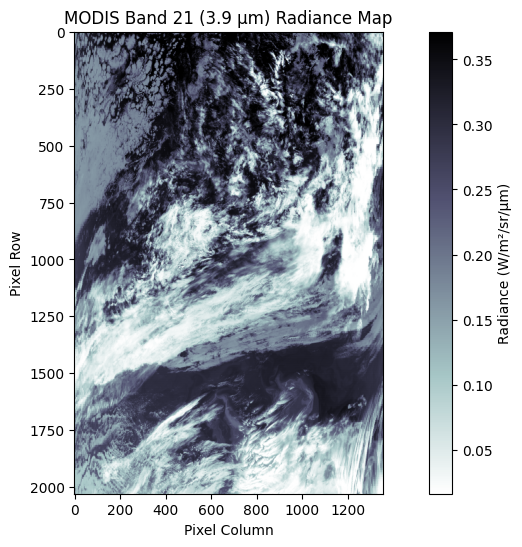

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pyhdf.SD import SD, SDC

# === Read MODIS Radiance and Geolocation ===

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    data = {}

    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]

    for band_index in bands_to_extract:
        radiance = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
        data[band_index] = radiance

    return data

# === Plot Entire Radiance Map ===

def plot_radiance_map(radiance_band, title="MODIS Radiance Map", cmap="inferno"):
    """
    Plots the entire radiance band. Darker areas are visually evident.
    """
    plt.figure(figsize=(12, 6))
    im = plt.imshow(radiance_band, cmap=cmap, vmin=np.nanpercentile(radiance_band, 2),
                    vmax=np.nanpercentile(radiance_band, 98))
    plt.colorbar(im, label='Radiance (W/m²/sr/µm)')
    plt.title(title)
    plt.xlabel("Pixel Column")
    plt.ylabel("Pixel Row")
    plt.grid(False)
    plt.show()

# === Main ===

if __name__ == "__main__":
    mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"  # <- Your MOD021KM file
    band_index = 0  # Band 21 (3.9 µm)

    print("[*] Reading radiance band...")
    radiance_data = read_modis_l1b_radiance(mod02_file, [band_index])
    band21 = radiance_data[band_index]

    print("[*] Plotting full radiance map...")
    plot_radiance_map(band21, title="MODIS Band 21 (3.9 µm) Radiance Map", cmap="bone_r")


[*] Reading radiance band...
[*] Plotting full radiance map...


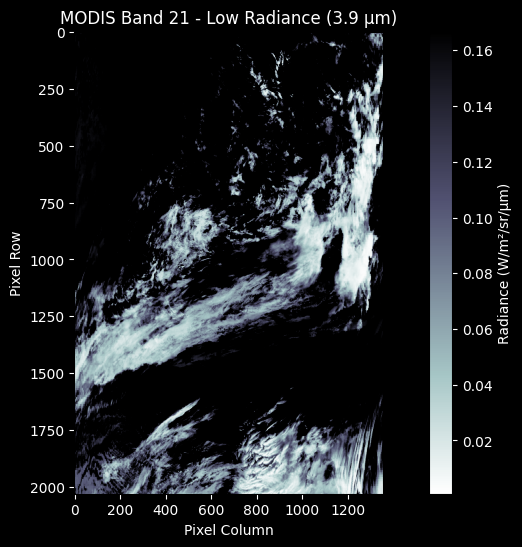

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pyhdf.SD import SD, SDC

# === Read MODIS Radiance and Geolocation ===

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    data = {}

    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]

    for band_index in bands_to_extract:
        radiance = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
        data[band_index] = radiance

    return data

# === Plot Entire Radiance Map ===

def plot_low_radiance_on_black(radiance_band, title="Low Radiance Areas", cmap="hot"):
    """
    Plots areas with lowest radiance values, on a black background.
    """
    # Mask to emphasize only low radiance values
    low_threshold = np.nanpercentile(radiance_band, 40)  # bottom 10%
    mask = np.where(radiance_band <= low_threshold, radiance_band, np.nan)

    plt.figure(figsize=(12, 6), facecolor='black')
    ax = plt.gca()
    ax.set_facecolor('black')

    im = plt.imshow(mask, cmap=cmap, vmin=np.nanmin(mask), vmax=low_threshold)
    cbar = plt.colorbar(im, label='Radiance (W/m²/sr/µm)')
    cbar.ax.yaxis.label.set_color('white')
    cbar.ax.tick_params(colors='white')

    plt.title(title, color='white')
    plt.xlabel("Pixel Column", color='white')
    plt.ylabel("Pixel Row", color='white')
    plt.grid(False)
    plt.tick_params(colors='white')
    plt.show()


# === Main ===

if __name__ == "__main__":
    mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"  # <- Your MOD021KM file
    band_index = 0  # Band 21 (3.9 µm)

    print("[*] Reading radiance band...")
    radiance_data = read_modis_l1b_radiance(mod02_file, [band_index])
    band21 = radiance_data[band_index]

    print("[*] Plotting full radiance map...")
    plot_low_radiance_on_black(band21, title="MODIS Band 21 - Low Radiance (3.9 µm)", cmap="bone_r")



In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def mask_dark_regions(band_data, latitudes, longitudes, threshold=None):
    """
    Extracts visually dark (low-radiance) areas.
    If threshold is not provided, uses the 25th percentile of radiance values.
    """
    valid_data = band_data[~np.isnan(band_data)]
    if threshold is None:
        threshold = np.percentile(valid_data, 25)  # Lower quartile
        print(f"[Info] Auto-calculated dark threshold: {threshold:.2f} W/m²/sr/µm")

    # Create binary mask
    dark_mask = (band_data < threshold) & (~np.isnan(band_data))
    dark_lat = latitudes[dark_mask]
    dark_lon = longitudes[dark_mask]
    dark_rad = band_data[dark_mask]

    return dark_lat, dark_lon, dark_rad, threshold

def plot_dark_regions(lat, lon, radiance, threshold, title="Visually Dark Regions"):
    """
    Plots dark (low-radiance) pixels only.
    """
    plt.figure(figsize=(10, 6))
    plt.scatter(lon, lat, c=radiance, cmap='bone_r', s=1, alpha=0.6)
    plt.colorbar(label="Radiance (W/m²/sr/µm)")
    plt.title(f"{title} (Radiance < {threshold:.2f})")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.grid(True)
    plt.show()

# Assume `band21`, `latitudes`, `longitudes` are loaded

lat_dark, lon_dark, rad_dark, auto_thresh = mask_dark_regions(band21, latitudes, longitudes)

plot_dark_regions(lat_dark, lon_dark, rad_dark, auto_thresh)


# Plotting difference


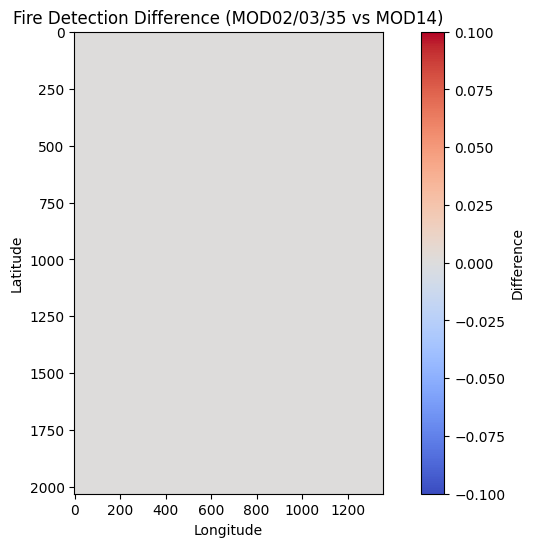

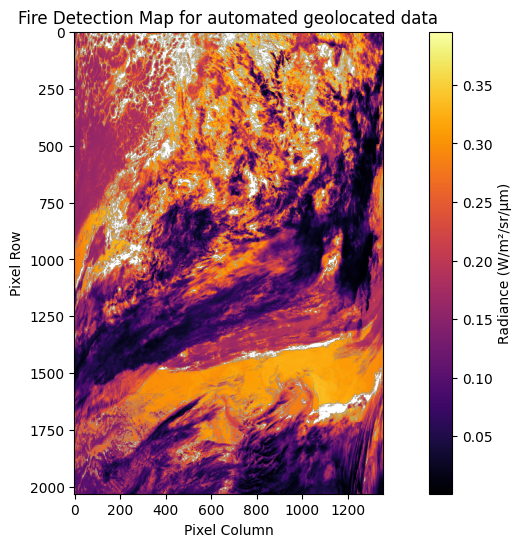

In [ ]:

# ===================== Full Workflow with MOD14 Comparison =====================

from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    data = {}

    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]

    for band_index in bands_to_extract:
        radiance = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
        data[band_index] = radiance

    return data

# ===================== MOD35 Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    cloud_mask_dataset = hdf.select('Cloud_Mask')
    cloud_mask_raw = cloud_mask_dataset[0, :, :]  # Read first byte of the bitfield
    return cloud_mask_raw

def extract_cloud_flags(cloud_mask_raw):
    cloudiness = np.bitwise_and(cloud_mask_raw, 0b00000011)  # Bits 0-1
    return cloudiness  # 0: Confident clear, 3: Cloudy

def apply_cloud_mask_using_mod35(band_data, cloudiness, allowed_classes=(0, 1)):
    mask = np.isin(cloudiness, allowed_classes)
    masked_data = np.where(mask, band_data, np.nan)
    return masked_data, mask.astype(np.uint8)

# ===================== Fire Detection Logic =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    latitude = hdf.select('Latitude')[:]
    longitude = hdf.select('Longitude')[:]
    return latitude, longitude

def estimate_background_radiance(radiance_data, i, j, window_size=5):
    half = window_size // 2
    sub_region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    sub_region = sub_region[~np.isnan(sub_region)]  # Handle NaNs from masking
    if sub_region.size == 0:
        return np.nan
    sub_region_clean = sub_region[sub_region < np.percentile(sub_region, 90)]
    return np.nanmean(sub_region_clean)

def detect_fire_pixels(band21, band31, band32, band6, zenith, threshold=2.0):
    height, width = band21.shape
    fire_mask = np.zeros_like(band21, dtype=np.uint8)

    for i in range(height):
        for j in range(width):
            if np.isnan(band21[i, j]) or np.isnan(band31[i, j]) or np.isnan(band6[i, j]):
                continue

            if band32[i, j] < 275:
                continue  # Likely cloud

            if band6[i, j] < 0.02:
                continue  # Water

            if zenith[i, j] < 30 or zenith[i, j] > 90:
                continue  # Invalid solar zenith range

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i, j] - bg21
            temp_contrast = band21[i, j] - band31[i, j]

            if delta > threshold and temp_contrast > 3:
                fire_mask[i, j] = 1

    return fire_mask

def calculate_fire_radiative_power(band21, band31, threshold=2.0):
    frp = (band21 - band31) * 0.5
    frp[np.isnan(frp)] = 0
    frp[frp < threshold] = 0
    return frp

def georeference_pixels(latitudes, longitudes, fire_mask):
    fire_coordinates = []
    for i in range(fire_mask.shape[0]):
        for j in range(fire_mask.shape[1]):
            if fire_mask[i, j] == 1:
                fire_coordinates.append((latitudes[i, j], longitudes[i, j]))
    return fire_coordinates

def save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, base_name="fire_detection_output"):
    np.savez_compressed(f"{base_name}.npz",
                        fire_mask=fire_mask,
                        fire_radiative_power=frp,
                        fire_coordinates=np.array(fire_coordinates, dtype='float32'),
                        cloud_mask=cloud_mask_binary)

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='red', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

# ===================== MOD14 Fire Mask Reader =====================

def read_mod14_fire_mask(file_path):
    hdf = SD(file_path, SDC.READ)
    fire_mask_dataset = hdf.select('fire mask')
    fire_mask = fire_mask_dataset[:]
    return fire_mask

# ===================== Compute Fire Mask Difference =====================

def compute_fire_difference(fire_mask, mod14_mask):
    # Normalize both masks to binary (0 = no fire, 1 = fire)
    fire_binary = np.where(fire_mask > 0, 1, 0)
    mod14_binary = np.where(mod14_mask == 9, 1, 0)  # High confidence fire in MOD14

    # Compute the difference
    difference = fire_binary - mod14_binary
    return difference

# ===================== Plot the Difference =====================

def plot_fire_difference(difference, title="Fire Detection Difference"):
    plt.figure(figsize=(10, 6))
    plt.imshow(difference, cmap='coolwarm', interpolation='nearest')
    plt.colorbar(label='Difference')
    plt.title(title)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()

# ============================================================================================ Using MOD35 only

mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"
mod14_file = "MOD14.A2025110.0000.061.2025110092217.hdf"  # Your MOD14 file

# Band indices: [0=21, 10=31, 11=32, 5=6, 14=Solar Zenith]
bands_to_extract = [0, 10, 11, 5, 14]

# Load MOD021KM radiance data
radiance_data = read_modis_l1b_radiance(mod02_file, bands_to_extract)
band21 = radiance_data[0]
band31 = radiance_data[10]
band32 = radiance_data[11]
band6 = radiance_data[5]
zenith = radiance_data[14]

# Load MOD35 cloud mask (HDF4)
cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
cloudiness_flags = extract_cloud_flags(cloud_mask_raw)
band21_masked, cloud_mask_binary = apply_cloud_mask_using_mod35(band21, cloudiness_flags)

# Simulated geolocation (replace with MOD03 for actual use)
latitudes = np.random.rand(*band21.shape) * 180 - 90
longitudes = np.random.rand(*band21.shape) * 360 - 180

# Fire detection
fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, zenith)

# FRP calculation
frp = calculate_fire_radiative_power(band21_masked, band31)

# Geolocation
fire_coordinates = georeference_pixels(latitudes, longitudes, fire_mask)

# Save results (NumPy format)
save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, "first")

# Load MOD14 Fire Mask
mod14_mask = read_mod14_fire_mask(mod14_file)

# Compute difference between MOD14 and your method
fire_difference = compute_fire_difference(fire_mask, mod14_mask)

# Plot difference
plot_fire_difference(fire_difference, title="Fire Detection Difference (MOD02/03/35 vs MOD14)")

# Visualization
visualize_fire_classification(fire_mask, radiance_data=band21_masked, title="Fire Detection Map for automated geolocated data")


/usr/local/lib/python3.11/dist-packages/matplotlib/colorbar.py:1238: RuntimeWarning: invalid value encountered in divide
  y = y / (self._boundaries[self._inside][-1] -


IndexError: index 1 is out of bounds for axis 0 with size 1

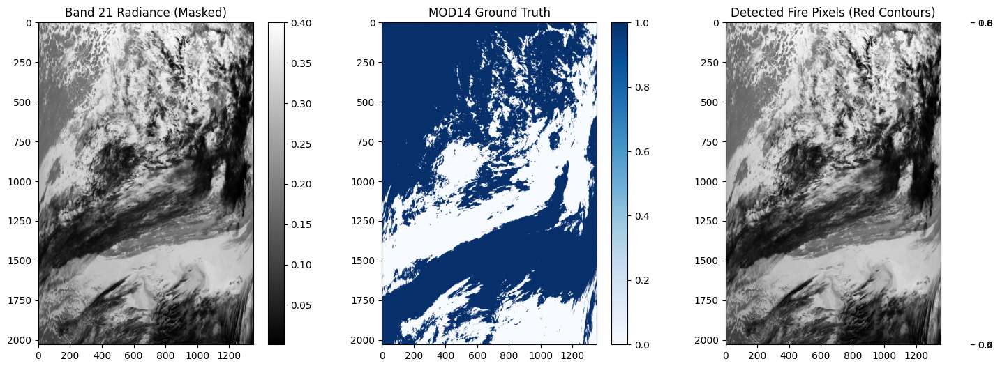

In [ ]:
from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt

# === Read MOD14 fire mask ===
def read_mod14_fire_mask(mod14_file):
    hdf = SD(mod14_file, SDC.READ)
    try:
        fire_mask = hdf.select("fire mask")[:]  # Try lowercase
    except:
        fire_mask = hdf.select("FireMask")[:]  # Try alternative
    fire_binary = (fire_mask == 3).astype(np.uint8)
    return fire_binary

# === Your existing logic to load data, cloud mask, fire detection, FRP, etc. ===
# Place your code here up to the point of obtaining: fire_mask, band21_masked, and mod14_mask

# === Load MOD14 Ground Truth ===
mod14_file = "MOD14.A2025110.0000.061.2025110092217.hdf"
mod14_mask = read_mod14_fire_mask(mod14_file)

# === Combined Plot: MOD14 vs Detection ===
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(band21_masked, cmap='gray')
plt.title('Band 21 Radiance (Masked)')
plt.colorbar()

plt.subplot(1, 3, 2)
plt.imshow(mod14_mask, cmap='Blues')
plt.title('MOD14 Ground Truth')
plt.colorbar()

plt.subplot(1, 3, 3)
plt.imshow(band21_masked, cmap='gray')
plt.contour(fire_mask == 1, colors='red', linewidths=0.5)
plt.title('Detected Fire Pixels (Red Contours)')
plt.colorbar()

plt.tight_layout()
plt.show()


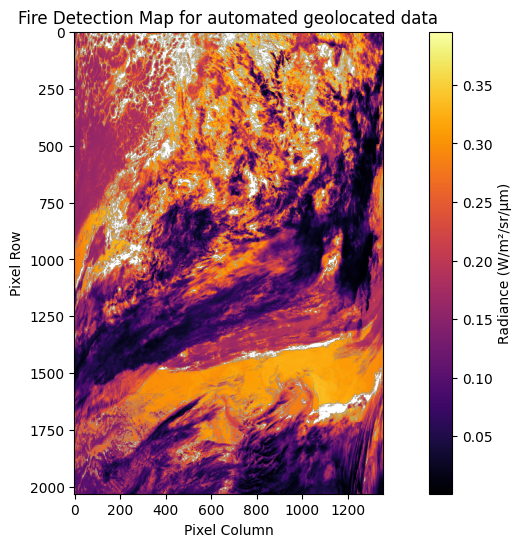

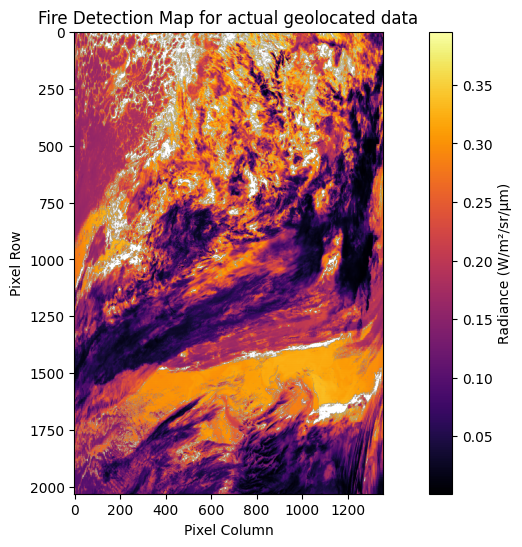

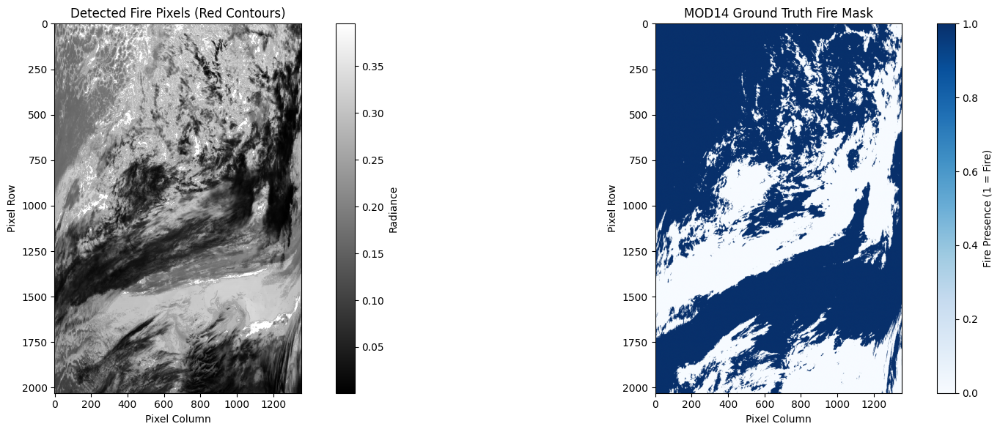

In [ ]:
from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt

# ===================== MODIS Radiance Reader =====================

def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    data = {}

    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]

    for band_index in bands_to_extract:
        radiance = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
        data[band_index] = radiance

    return data

# ===================== MOD35 Cloud Mask Handling =====================

def read_cloud_mask_hdf4(mod35_file):
    hdf = SD(mod35_file, SDC.READ)
    cloud_mask_dataset = hdf.select('Cloud_Mask')
    cloud_mask_raw = cloud_mask_dataset[0, :, :]  # Read first byte of the bitfield
    return cloud_mask_raw

def extract_cloud_flags(cloud_mask_raw):
    cloudiness = np.bitwise_and(cloud_mask_raw, 0b00000011)  # Bits 0-1
    return cloudiness  # 0: Confident clear, 3: Cloudy

def apply_cloud_mask_using_mod35(band_data, cloudiness, allowed_classes=(0, 1)):
    mask = np.isin(cloudiness, allowed_classes)
    masked_data = np.where(mask, band_data, np.nan)
    return masked_data, mask.astype(np.uint8)

# ===================== Fire Detection Logic =====================

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    latitude = hdf.select('Latitude')[:]
    longitude = hdf.select('Longitude')[:]
    return latitude, longitude

def estimate_background_radiance(radiance_data, i, j, window_size=5):
    half = window_size // 2
    sub_region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    sub_region = sub_region[~np.isnan(sub_region)]  # Handle NaNs from masking
    if sub_region.size == 0:
        return np.nan
    sub_region_clean = sub_region[sub_region < np.percentile(sub_region, 90)]
    return np.nanmean(sub_region_clean)

def detect_fire_pixels(band21, band31, band32, band6, zenith, threshold=2.0):
    height, width = band21.shape
    fire_mask = np.zeros_like(band21, dtype=np.uint8)

    for i in range(height):
        for j in range(width):
            if np.isnan(band21[i, j]) or np.isnan(band31[i, j]) or np.isnan(band6[i, j]):
                continue

            if band32[i, j] < 275:
                continue  # Likely cloud

            if band6[i, j] < 0.02:
                continue  # Water

            if zenith[i, j] < 30 or zenith[i, j] > 90:
                continue  # Invalid solar zenith range

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i, j] - bg21
            temp_contrast = band21[i, j] - band31[i, j]

            if delta > threshold and temp_contrast > 3:
                fire_mask[i, j] = 1

    return fire_mask

def calculate_fire_radiative_power(band21, band31, threshold=2.0):
    frp = (band21 - band31) * 0.5
    frp[np.isnan(frp)] = 0
    frp[frp < threshold] = 0
    return frp

def georeference_pixels(latitudes, longitudes, fire_mask):
    fire_coordinates = []
    for i in range(fire_mask.shape[0]):
        for j in range(fire_mask.shape[1]):
            if fire_mask[i, j] == 1:
                fire_coordinates.append((latitudes[i, j], longitudes[i, j]))
    return fire_coordinates

def save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, base_name="fire_detection_output"):
    np.savez_compressed(f"{base_name}.npz",
                        fire_mask=fire_mask,
                        fire_radiative_power=frp,
                        fire_coordinates=np.array(fire_coordinates, dtype='float32'),
                        cloud_mask=cloud_mask_binary)

def visualize_fire_classification(fire_mask, radiance_data=None, title="Fire Detection Map"):
    plt.figure(figsize=(12, 6))
    if radiance_data is not None:
        plt.imshow(radiance_data, cmap='inferno')
        plt.colorbar(label='Radiance (W/m²/sr/µm)')
    plt.contour(fire_mask == 1, colors='blue', linewidths=1.0)
    plt.title(title)
    plt.xlabel('Pixel Column')
    plt.ylabel('Pixel Row')
    plt.grid(False)
    plt.show()

# ============================================================================================ Using MOD35 only

mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
mod35_file = "MOD35_L2.A2025110.0000.061.2025110131927.hdf"

# Band indices: [0=21, 10=31, 11=32, 5=6, 14=Solar Zenith]
bands_to_extract = [0, 10, 11, 5, 14]

# Load MOD021KM radiance data
radiance_data = read_modis_l1b_radiance(mod02_file, bands_to_extract)
band21 = radiance_data[0]
band31 = radiance_data[10]
band32 = radiance_data[11]
band6 = radiance_data[5]
zenith = radiance_data[14]

# Load MOD35 cloud mask (HDF4)
cloud_mask_raw = read_cloud_mask_hdf4(mod35_file)
cloudiness_flags = extract_cloud_flags(cloud_mask_raw)
band21_masked, cloud_mask_binary = apply_cloud_mask_using_mod35(band21, cloudiness_flags)

# Simulated geolocation (replace with MOD03 for actual use)
latitudes = np.random.rand(*band21.shape) * 180 - 90
longitudes = np.random.rand(*band21.shape) * 360 - 180

# Fire detection
fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, zenith)

# FRP calculation
frp = calculate_fire_radiative_power(band21_masked, band31)

# Geolocation
fire_coordinates = georeference_pixels(latitudes, longitudes, fire_mask)

# Save results (NumPy format)
save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, "first")

# Visualization
visualize_fire_classification(fire_mask, radiance_data=band21_masked, title="Fire Detection Map for automated geolocated data")



# ============================================================================================ Using MOD03 for Geolocation

mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"  # Add your MOD03 file here

# ✅ Load real geolocation from MOD03
latitudes, longitudes = read_mod03_geolocation(mod03_file)

# Fire detection
fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, zenith)

# FRP calculation
frp = calculate_fire_radiative_power(band21_masked, band31)

# Geolocation
fire_coordinates = georeference_pixels(latitudes, longitudes, fire_mask)

# Save results
save_fire_detection_result_numpy(fire_mask, frp, fire_coordinates, cloud_mask_binary, "second")

# Visualization
visualize_fire_classification(fire_mask, radiance_data=band21_masked, title="Fire Detection Map for actual geolocated data")



# ==================== Append MOD14 Ground Truth Plot ====================

# Read MOD14 ground truth
mod14_file = "MOD14.A2025110.0000.061.2025110092217.hdf"
mod14_mask = read_mod14_fire_mask(mod14_file)

# Create side-by-side comparison
plt.figure(figsize=(18, 6))

# 1. Detected fire pixels over radiance
plt.subplot(1, 2, 1)
img1 = plt.imshow(band21_masked, cmap='gray')
contour = plt.contour(fire_mask == 1, colors='red', linewidths=0.8)
plt.title('Detected Fire Pixels (Red Contours)')
plt.xlabel('Pixel Column')
plt.ylabel('Pixel Row')
plt.colorbar(img1, label='Radiance')

# 2. MOD14 Ground Truth Fire Mask
plt.subplot(1, 2, 2)
img2 = plt.imshow(mod14_mask, cmap='Blues')
plt.title('MOD14 Ground Truth Fire Mask')
plt.xlabel('Pixel Column')
plt.ylabel('Pixel Row')
plt.colorbar(img2, label='Fire Presence (1 = Fire)')

plt.tight_layout()
plt.show()


# Testing against original

Confusion Matrix:
[[1038234       0]
 [1710386       0]]
True Positives: 0, False Positives: 0, False Negatives: 1710386, True Negatives: 1038234
Precision: 0.000
Recall (TPR): 0.000
F1 Score: 0.000


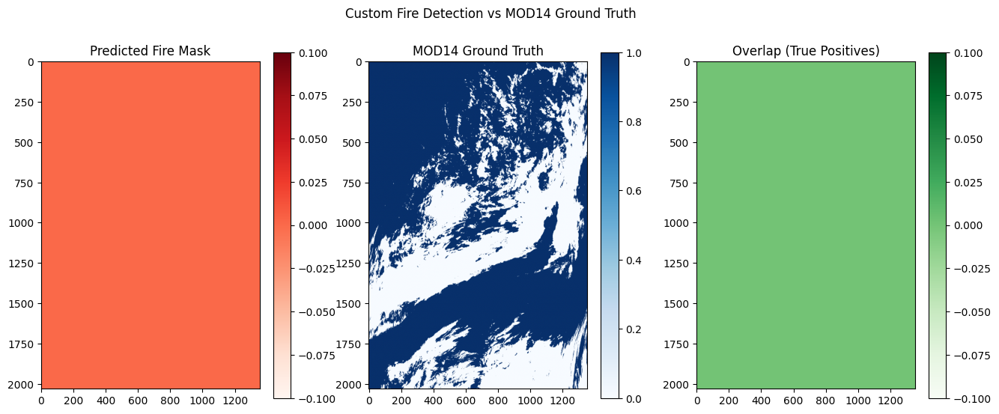

In [ ]:
from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
from skimage.transform import resize

# ===================== Fire Detection (Modified) =====================
def estimate_background_radiance(radiance_data, i, j, window_size=5):
    half = window_size // 2
    sub_region = radiance_data[max(0, i-half):i+half+1, max(0, j-half):j+half+1]
    sub_region = sub_region[~np.isnan(sub_region)]
    if sub_region.size == 0:
        return np.nan
    sub_region_clean = sub_region[sub_region < np.percentile(sub_region, 90)]
    return np.nanmean(sub_region_clean)

def detect_fire_pixels(band21, band31, band32, band6, zenith, threshold=1.0):
    height, width = band21.shape
    fire_mask = np.zeros_like(band21, dtype=np.uint8)

    for i in range(height):
        for j in range(width):
            if np.isnan(band21[i, j]) or np.isnan(band31[i, j]) or np.isnan(band6[i, j]):
                continue
            if band32[i, j] < 275:
                continue
            if band6[i, j] < 0.02:
                continue
            if zenith[i, j] < 30 or zenith[i, j] > 90:
                continue

            bg21 = estimate_background_radiance(band21, i, j)
            if np.isnan(bg21):
                continue

            delta = band21[i, j] - bg21
            temp_contrast = band21[i, j] - band31[i, j]

            if delta > threshold and temp_contrast > 1.5:
                fire_mask[i, j] = 1

    return fire_mask

def calculate_fire_radiative_power(band21, band31, threshold=1.0):
    frp = (band21 - band31) * 0.5
    frp[np.isnan(frp)] = 0
    frp[frp < threshold] = 0
    return frp

# ===================== MOD14 Ground Truth Handling =====================
def read_mod14_fire_mask(mod14_file):
    hdf = SD(mod14_file, SDC.READ)
    fire_mask = hdf.select("fire mask")[:]  # May vary: "fire mask" or "FireMask"
    fire_binary = (fire_mask == 3).astype(np.uint8)
    return fire_binary

# ===================== Evaluation Metrics =====================
def evaluate_fire_detection(predicted_mask, ground_truth_mask):
    pred = predicted_mask.flatten()
    gt = ground_truth_mask.flatten()

    # Align valid mask
    valid_mask = ~np.isnan(pred) & ~np.isnan(gt)
    pred = pred[valid_mask]
    gt = gt[valid_mask]

    cm = confusion_matrix(gt, pred, labels=[0, 1])
    tn, fp, fn, tp = cm.ravel()
    precision = precision_score(gt, pred, zero_division=0)
    recall = recall_score(gt, pred, zero_division=0)
    f1 = f1_score(gt, pred, zero_division=0)

    print("Confusion Matrix:")
    print(cm)
    print(f"True Positives: {tp}, False Positives: {fp}, False Negatives: {fn}, True Negatives: {tn}")
    print(f"Precision: {precision:.3f}")
    print(f"Recall (TPR): {recall:.3f}")
    print(f"F1 Score: {f1:.3f}")

    return cm, precision, recall, f1

# ===================== Visualization =====================
def visualize_fire_comparison(predicted_mask, ground_truth_mask, title="Comparison"):
    plt.figure(figsize=(16, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(predicted_mask, cmap='Reds')
    plt.title('Predicted Fire Mask')
    plt.colorbar()

    plt.subplot(1, 3, 2)
    plt.imshow(ground_truth_mask, cmap='Blues')
    plt.title('MOD14 Ground Truth')
    plt.colorbar()

    plt.subplot(1, 3, 3)
    overlap = (predicted_mask == 1) & (ground_truth_mask == 1)
    plt.imshow(overlap, cmap='Greens')
    plt.title('Overlap (True Positives)')
    plt.colorbar()

    plt.suptitle(title)
    plt.show()

# ===================== Main Usage =====================
# --- Load your own data ---
mod02_file = "MOD021KM.A2025110.0000.061.2025110131826.hdf"
mod03_file = "MOD03.A2025110.0000.061.2025110065248.hdf"
mod14_file = "MOD14.A2025110.0000.061.2025110092217.hdf"  # Update this

# Load MOD021KM radiance
from pyhdf.SD import SD, SDC
def read_modis_l1b_radiance(file_path, bands_to_extract):
    hdf = SD(file_path, SDC.READ)
    data = {}
    radiance_dataset = hdf.select('EV_1KM_Emissive')
    attrs = radiance_dataset.attributes()
    scale = attrs['radiance_scales']
    offset = attrs['radiance_offsets']
    raw_data = radiance_dataset[:]
    for band_index in bands_to_extract:
        radiance = (raw_data[band_index, :, :] - offset[band_index]) * scale[band_index]
        data[band_index] = radiance
    return data

def read_mod03_geolocation(mod03_file):
    hdf = SD(mod03_file, SDC.READ)
    latitude = hdf.select('Latitude')[:]
    longitude = hdf.select('Longitude')[:]
    return latitude, longitude

bands_to_extract = [0, 10, 11, 5, 14]  # [21, 31, 32, 6, Solar Zenith]
radiance_data = read_modis_l1b_radiance(mod02_file, bands_to_extract)
band21 = radiance_data[0]
band31 = radiance_data[10]
band32 = radiance_data[11]
band6 = radiance_data[5]
zenith = radiance_data[14]

# ⚠️ Skip MOD35 cloud mask for now
band21_masked = band21.copy()

# Fire detection
fire_mask = detect_fire_pixels(band21_masked, band31, band32, band6, zenith, threshold=1.0)

# Fire radiative power
frp = calculate_fire_radiative_power(band21_masked, band31)

# Ground truth fire mask
mod14_mask = read_mod14_fire_mask(mod14_file)

# Resize ground truth if needed
if fire_mask.shape != mod14_mask.shape:
    print("⚠️ Resizing MOD14 fire mask to match predicted mask.")
    mod14_mask = resize(mod14_mask, fire_mask.shape, order=0, preserve_range=True).astype(np.uint8)

# Evaluation
evaluate_fire_detection(fire_mask, mod14_mask)

# Visualization
visualize_fire_comparison(fire_mask, mod14_mask, title="Custom Fire Detection vs MOD14 Ground Truth")


In [ ]:
print("fire_mask shape:", fire_mask.shape)
print("mod14_mask shape:", mod14_mask.shape)


fire_mask shape: (2030, 1354)
mod14_mask shape: (2030, 1354)


In [ ]:
from pyhdf.SD import SD, SDC

file = SD('MOD14.A2025110.0000.061.2025110092217.hdf', SDC.READ)
print(file.datasets().keys())

dict_keys(['fire mask', 'algorithm QA', 'FP_line', 'FP_sample', 'FP_latitude', 'FP_longitude', 'FP_R2', 'FP_T21', 'FP_T31', 'FP_MeanT21', 'FP_MeanT31', 'FP_MeanDT', 'FP_MAD_T21', 'FP_MAD_T31', 'FP_MAD_DT', 'FP_power', 'FP_AdjCloud', 'FP_AdjWater', 'FP_WinSize', 'FP_NumValid', 'FP_confidence', 'FP_land', 'FP_MeanR2', 'FP_MAD_R2', 'FP_ViewZenAng', 'FP_SolZenAng', 'FP_RelAzAng', 'FP_CMG_row', 'FP_CMG_col', 'CMG_night'])


Confusion Matrix:
[[1038234       0]
 [1710386       0]]
True Positives: 0, False Positives: 0, False Negatives: 1710386, True Negatives: 1038234
Precision: 0.000
Recall (TPR): 0.000
F1 Score: 0.000


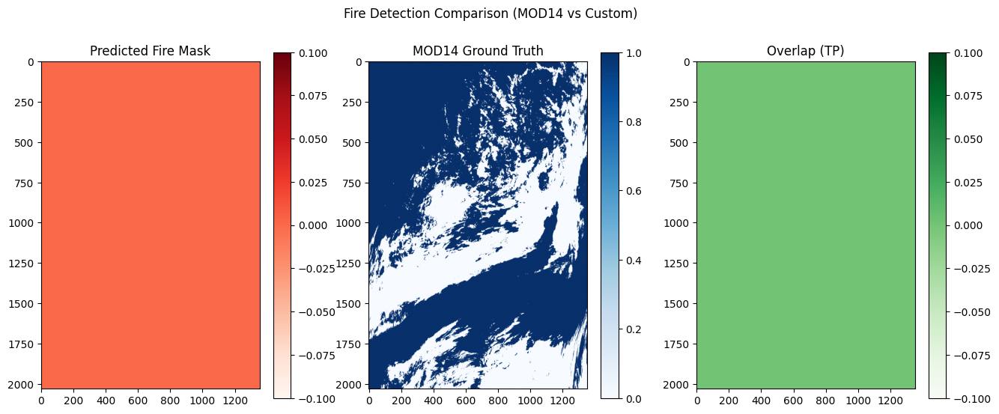

In [ ]:
from pyhdf.SD import SD, SDC
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score

# ========================================
# Load MOD14 fire mask (ground truth)
# ========================================
def read_mod14_fire_mask(mod14_file):
    hdf = SD(mod14_file, SDC.READ)
    fire_mask = hdf.select("fire mask")[:]  # May vary: some MOD14 files use 'fire mask' or 'FireMask'
    # MOD14 Fire Mask encoding: 0 = not processed, 3 = fire
    fire_binary = (fire_mask == 3).astype(np.uint8)
    return fire_binary

# ========================================
# Evaluation Metrics
# ========================================
def evaluate_fire_detection(predicted_mask, ground_truth_mask):
    # Flatten the masks to compare pixel-wise
    pred = predicted_mask.flatten()
    gt = ground_truth_mask.flatten()

    # Only keep pixels where either mask is valid (not nan or cloud)
    valid_mask = ~np.isnan(pred) & ~np.isnan(gt)
    pred = pred[valid_mask]
    gt = gt[valid_mask]

    cm = confusion_matrix(gt, pred, labels=[0, 1])
    tn, fp, fn, tp = cm.ravel()
    precision = precision_score(gt, pred, zero_division=0)
    recall = recall_score(gt, pred, zero_division=0)
    f1 = f1_score(gt, pred, zero_division=0)

    print("Confusion Matrix:")
    print(cm)
    print(f"True Positives: {tp}, False Positives: {fp}, False Negatives: {fn}, True Negatives: {tn}")
    print(f"Precision: {precision:.3f}")
    print(f"Recall (TPR): {recall:.3f}")
    print(f"F1 Score: {f1:.3f}")

    return cm, precision, recall, f1

# ========================================
# Visual Comparison
# ========================================
def visualize_fire_comparison(predicted_mask, ground_truth_mask, title="Comparison"):
    plt.figure(figsize=(16, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(predicted_mask, cmap='Reds')
    plt.title('Predicted Fire Mask')
    plt.colorbar()

    plt.subplot(1, 3, 2)
    plt.imshow(ground_truth_mask, cmap='Blues')
    plt.title('MOD14 Ground Truth')
    plt.colorbar()

    plt.subplot(1, 3, 3)
    overlap = (predicted_mask == 1) & (ground_truth_mask == 1)
    plt.imshow(overlap, cmap='Greens')
    plt.title('Overlap (TP)')
    plt.colorbar()

    plt.suptitle(title)
    plt.show()

# ========================================
# Example Usage
# ========================================
mod14_file = "MOD14.A2025110.0000.061.2025110092217.hdf"  # Update with your MOD14 file
predicted_mask = fire_mask  # From your code
ground_truth_mask = read_mod14_fire_mask(mod14_file)

# Resize if shapes mismatch
if predicted_mask.shape != ground_truth_mask.shape:
    print("Warning: Resizing MOD14 to match predicted fire mask shape.")
    from skimage.transform import resize
    ground_truth_mask = resize(ground_truth_mask, predicted_mask.shape, order=0, preserve_range=True).astype(np.uint8)

# Evaluate
evaluate_fire_detection(predicted_mask, ground_truth_mask)

# Visualize
visualize_fire_comparison(predicted_mask, ground_truth_mask, title="Fire Detection Comparison (MOD14 vs Custom)")


In [ ]:
# Assuming you already have:
# fire_mask_custom = detect_fire_pixels(...)
# frp_custom = calculate_fire_radiative_power(...)
# and MOD14 file path:
mod14_file = "MOD14.A2025110.0000.061.2025110092217.hdf"

# Call comparison
compare_custom_with_mod14(mod14_file, fire_mask_custom, frp_custom)
